In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_excel('/content/Suface Quality Report MARCH 2026.xlsx',header=1)

In [3]:
df.head()

,INSP. DATE,CAST DATE,CAST SIZE,Rolling Date,HEAT NO.,GRADE,SIZE,Customer,Rolled pcs,ROLLING MILL,...,45,46,47,48,49,50,Avg,Surface Quality,Surface Condition,Remarks
0,01.03.2026,28.01.2026,280X320,05.02.2026,65248,SCM420HV(IYM),34-RD,VARROC,899,BSM,...,1.0,0.0,2.0,1.0,0.0,4.0,1.333333,A,Good,NaN
1,01.03.2026,20.02.2026,165X165,26.02.2026,65835,C43,50-RD,TRINITY,635,ASM,...,0.0,2.0,0.0,1.0,1.0,1.0,0.611111,A,Good,NaN
2,01.03.2026,28.11.2025,160X160,03.12.2025,63630,SCM420HV,33-RD,MICROTEK,238,BSM,...,0.0,1.0,2.0,1.0,0.0,1.0,1.277778,A,Good,NaN
3,01.03.2026,08.02.2026,280X320,12.02.2026,65520,S53CG,56-RD,JINABAKUL FORGE,490,ASM,...,2.0,2.0,2.0,0.0,2.0,2.0,1.145833,A,Good,NaN
4,01.03.2026,01.02.2026,165X165,06.02.2026,65342,SCM415HV,35-RD,HERO MOTO,548,BSM,...,6.0,4.0,8.0,2.0,0.0,8.0,4.145833,A,Good,NaN


In [4]:
df = df[~df['ROLLING MILL'].str.contains('ASM|BSM', case=False, na=False)].copy()

In [5]:
df.head()

,INSP. DATE,CAST DATE,CAST SIZE,Rolling Date,HEAT NO.,GRADE,SIZE,Customer,Rolled pcs,ROLLING MILL,...,45,46,47,48,49,50,Avg,Surface Quality,Surface Condition,Remarks
7,01.03.2026,17.02.2026,280X320,21.02.2026,65753,42CRMO4,75-RD,SANSERA,190,HVM,...,NaN,NaN,NaN,NaN,NaN,NaN,20.461538,C,Bad,NaN
8,01.03.2026,23.02.2026,280X320,26.02.2026,65923,41CR4,54-RD,LAXMI AGNI,440,HVM,...,8.0,NaN,NaN,NaN,NaN,NaN,6.534884,A,Good,NaN
9,01.03.2026,15.02.2026,520X650,23.02.2026,65688,SAE8319,80-RD,SANGKAJ,187,HVM,...,NaN,NaN,NaN,NaN,NaN,NaN,10.090909,B,Average,NaN
10,01.03.2026,23.02.2026,280X320,26.02.2026,65922,41CR4,54-RD,LAXMI AGNI,450,HVM,...,6.0,5.0,2.0,8.0,2.0,3.0,5.000000,A,Good,NaN
11,01.03.2026,22.02.2026,280X320,27.02.2026,65879,41CR4,54-RD,LAXMI AGNI,456,HVM,...,NaN,NaN,NaN,NaN,NaN,NaN,6.024390,A,Good,NaN


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 136 entries, 7 to 349
Data columns (total 65 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   INSP. DATE         136 non-null    object 
 1   CAST DATE          136 non-null    object 
 2   CAST SIZE          136 non-null    object 
 3   Rolling Date       136 non-null    object 
 4   HEAT NO.           136 non-null    object 
 5   GRADE              136 non-null    object 
 6   SIZE               136 non-null    object 
 7   Customer           136 non-null    object 
 8   Rolled pcs         136 non-null    object 
 9   ROLLING MILL       136 non-null    object 
 10  AGENCY             136 non-null    object 
 11  1                  136 non-null    int64  
 12  2                  136 non-null    int64  
 13  3                  136 non-null    int64  
 14  4                  136 non-null    int64  
 15  5                  136 non-null    int64  
 16  6                  136 non-null

In [7]:
df.drop('Remarks',axis=1,inplace=True)

In [8]:
df.head()

,INSP. DATE,CAST DATE,CAST SIZE,Rolling Date,HEAT NO.,GRADE,SIZE,Customer,Rolled pcs,ROLLING MILL,...,44,45,46,47,48,49,50,Avg,Surface Quality,Surface Condition
7,01.03.2026,17.02.2026,280X320,21.02.2026,65753,42CRMO4,75-RD,SANSERA,190,HVM,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.461538,C,Bad
8,01.03.2026,23.02.2026,280X320,26.02.2026,65923,41CR4,54-RD,LAXMI AGNI,440,HVM,...,5.0,8.0,NaN,NaN,NaN,NaN,NaN,6.534884,A,Good
9,01.03.2026,15.02.2026,520X650,23.02.2026,65688,SAE8319,80-RD,SANGKAJ,187,HVM,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.090909,B,Average
10,01.03.2026,23.02.2026,280X320,26.02.2026,65922,41CR4,54-RD,LAXMI AGNI,450,HVM,...,4.0,6.0,5.0,2.0,8.0,2.0,3.0,5.000000,A,Good
11,01.03.2026,22.02.2026,280X320,27.02.2026,65879,41CR4,54-RD,LAXMI AGNI,456,HVM,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.024390,A,Good


In [9]:
df.drop(df.loc[:, 1:50].columns,axis=1,inplace=True)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 136 entries, 7 to 349
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   INSP. DATE         136 non-null    object 
 1   CAST DATE          136 non-null    object 
 2   CAST SIZE          136 non-null    object 
 3   Rolling Date       136 non-null    object 
 4   HEAT NO.           136 non-null    object 
 5   GRADE              136 non-null    object 
 6   SIZE               136 non-null    object 
 7   Customer           136 non-null    object 
 8   Rolled pcs         136 non-null    object 
 9   ROLLING MILL       136 non-null    object 
 10  AGENCY             136 non-null    object 
 11  Avg                136 non-null    float64
 12  Surface Quality    136 non-null    object 
 13  Surface Condition  136 non-null    object 
dtypes: float64(1), object(13)
memory usage: 15.9+ KB


In [11]:
df['INSP. DATE']=df['INSP. DATE'].str.replace('.','-')
df['CAST DATE']=df['CAST DATE'].str.replace('.','-')
df['Rolling Date']=df['Rolling Date'].str.replace('.','-')

In [12]:
df.head()

,INSP. DATE,CAST DATE,CAST SIZE,Rolling Date,HEAT NO.,GRADE,SIZE,Customer,Rolled pcs,ROLLING MILL,AGENCY,Avg,Surface Quality,Surface Condition
7,01-03-2026,17-02-2026,280X320,21-02-2026,65753,42CRMO4,75-RD,SANSERA,190,HVM,KT,20.461538,C,Bad
8,01-03-2026,23-02-2026,280X320,26-02-2026,65923,41CR4,54-RD,LAXMI AGNI,440,HVM,OM,6.534884,A,Good
9,01-03-2026,15-02-2026,520X650,23-02-2026,65688,SAE8319,80-RD,SANGKAJ,187,HVM,OM,10.090909,B,Average
10,01-03-2026,23-02-2026,280X320,26-02-2026,65922,41CR4,54-RD,LAXMI AGNI,450,HVM,SHRI VAJRA,5.000000,A,Good
11,01-03-2026,22-02-2026,280X320,27-02-2026,65879,41CR4,54-RD,LAXMI AGNI,456,HVM,SHIV,6.024390,A,Good


In [13]:
df.shape

(136, 14)

In [14]:
df.drop('CAST DATE',axis=1,inplace=True)

In [15]:
df['INSP. DATE']=pd.to_datetime(df['INSP. DATE'],format='mixed')
#df['CAST DATE']=pd.to_datetime(df['CAST DATE'],format='mixed')
df['Rolling Date']=pd.to_datetime(df['Rolling Date'],format='mixed')
df['Rolled pcs']=pd.to_numeric(df['Rolled pcs'])

In [16]:
df.head()

,INSP. DATE,CAST SIZE,Rolling Date,HEAT NO.,GRADE,SIZE,Customer,Rolled pcs,ROLLING MILL,AGENCY,Avg,Surface Quality,Surface Condition
7,2026-01-03,280X320,2026-02-21,65753,42CRMO4,75-RD,SANSERA,190,HVM,KT,20.461538,C,Bad
8,2026-01-03,280X320,2026-02-26,65923,41CR4,54-RD,LAXMI AGNI,440,HVM,OM,6.534884,A,Good
9,2026-01-03,520X650,2026-02-23,65688,SAE8319,80-RD,SANGKAJ,187,HVM,OM,10.090909,B,Average
10,2026-01-03,280X320,2026-02-26,65922,41CR4,54-RD,LAXMI AGNI,450,HVM,SHRI VAJRA,5.000000,A,Good
11,2026-01-03,280X320,2026-02-27,65879,41CR4,54-RD,LAXMI AGNI,456,HVM,SHIV,6.024390,A,Good


In [17]:
df[df.duplicated()]

,INSP. DATE,CAST SIZE,Rolling Date,HEAT NO.,GRADE,SIZE,Customer,Rolled pcs,ROLLING MILL,AGENCY,Avg,Surface Quality,Surface Condition


In [18]:
# Average Quality by GRADE
df.groupby('GRADE')['Avg'].mean().sort_values(ascending=False)

,Avg
GRADE,
SAE4319,32.937500
SCR420H,28.687293
ST52-3,25.378788
20MnCr5,24.660256
38MnVS6,22.000000
SAE1010,20.571429
44MNSIVS6,20.537631
42CRMO4,20.461538
20MNCR5,20.397980


In [19]:
# Average Quality by SIZE
df.groupby('SIZE')['Avg'].mean().sort_values(ascending=False)

,Avg
SIZE,
56-RD,38.870968
85-RD,19.706539
100-RD,19.667205
120-RD,18.264103
90,16.500000
95-RD,16.215812
80-RD,16.029321
55-RD,15.669490
83-RD,15.568996


In [20]:
# Count of SURFACE CONDITION
df['Surface Condition'].value_counts()

,count
Surface Condition,
Bad,67
Average,38
Good,31


In [21]:
# Compare average with surface quality
df.groupby('Surface Condition')['Avg'].mean()

,Avg
Surface Condition,
Average,10.770394
Bad,20.729837
Good,4.502126


In [22]:
# Compare customer wise surface quality
df.groupby('Customer')['Avg'].mean().sort_values(ascending=False)

,Avg
Customer,
M.M. FORGING,38.870968
M M FORGING,36.461538
TIMKEN,32.937500
Vulcan,28.153846
GENAU,25.378788
SMI Amtek,22.000000
VULCON ELECTRO.,21.166667
GALAXY/MICROTECH,20.687500
SAA AB ENGG.,20.571429


In [23]:
# GRADE+Surface Condition Analysis
df.groupby(['GRADE','Surface Condition'])['Avg'].mean().reset_index().sort_values(by='Surface Condition',ascending=False)

,GRADE,Surface Condition,Avg
19,C45,Good,3.235294
29,SAE5200,Good,1.687500
20,DY7A,Good,5.986653
13,41CR4,Good,6.088299
23,S48C-M1,Good,4.354167
26,S48CS1V,Good,3.686508
17,52100 SCP,Good,4.434783
1,11V41,Good,3.777778
32,SAE52100,Good,4.021017
31,SAE52100,Bad,19.837889


In [24]:
df.groupby(['GRADE','Surface Condition','SIZE']).size().reset_index(name='Count').sort_values('Count',ascending=False)

,GRADE,Surface Condition,SIZE,Count
13,38MNVS6,Bad,85-RD,11
49,SAE52100,Bad,50-RD,9
36,S48CS1V,Bad,75-RD,7
21,41CR4,Good,54-RD,5
48,SAE52100,Average,55-RD,5
...,...,...,...,...
61,SAE8319,Bad,110-RD,1
63,SCR420H,Bad,100-RD,1
64,SCR420H,Bad,56-RD,1
66,ST52-3,Bad,120-RD,1


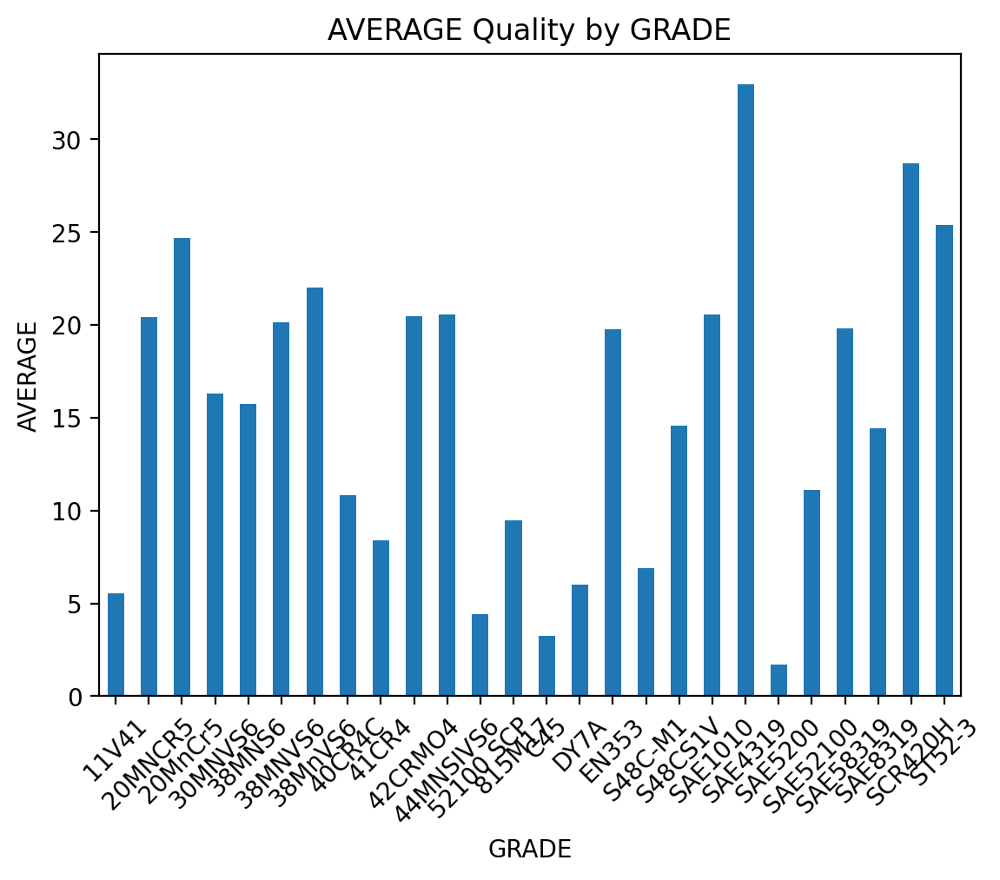

In [25]:
# GRADE vs AVG
import matplotlib.pyplot as plt
Grade_avg=df.groupby('GRADE')['Avg'].mean()

plt.figure(dpi=200)
Grade_avg.plot(kind='bar')
plt.title('AVERAGE Quality by GRADE')
plt.xlabel('GRADE')
plt.ylabel('AVERAGE')
plt.xticks(rotation=45)
plt.show()

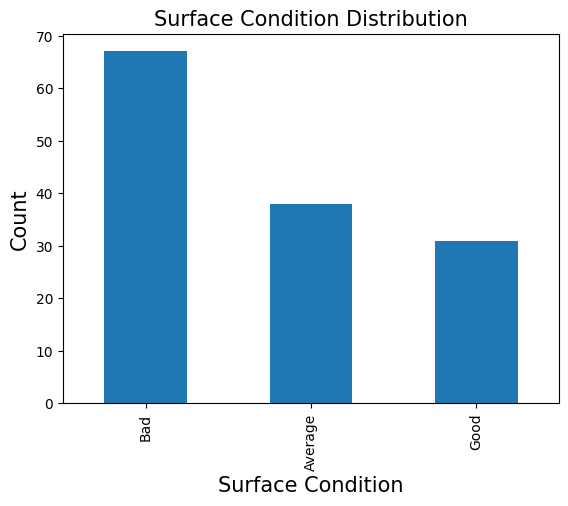

In [26]:
df['Surface Condition'].value_counts().plot(kind='bar')
plt.title('Surface Condition Distribution',fontsize=15)
plt.xlabel('Surface Condition',fontsize=15)
plt.ylabel('Count',fontsize=15)
plt.show()

In [27]:
df.head()

,INSP. DATE,CAST SIZE,Rolling Date,HEAT NO.,GRADE,SIZE,Customer,Rolled pcs,ROLLING MILL,AGENCY,Avg,Surface Quality,Surface Condition
7,2026-01-03,280X320,2026-02-21,65753,42CRMO4,75-RD,SANSERA,190,HVM,KT,20.461538,C,Bad
8,2026-01-03,280X320,2026-02-26,65923,41CR4,54-RD,LAXMI AGNI,440,HVM,OM,6.534884,A,Good
9,2026-01-03,520X650,2026-02-23,65688,SAE8319,80-RD,SANGKAJ,187,HVM,OM,10.090909,B,Average
10,2026-01-03,280X320,2026-02-26,65922,41CR4,54-RD,LAXMI AGNI,450,HVM,SHRI VAJRA,5.000000,A,Good
11,2026-01-03,280X320,2026-02-27,65879,41CR4,54-RD,LAXMI AGNI,456,HVM,SHIV,6.024390,A,Good


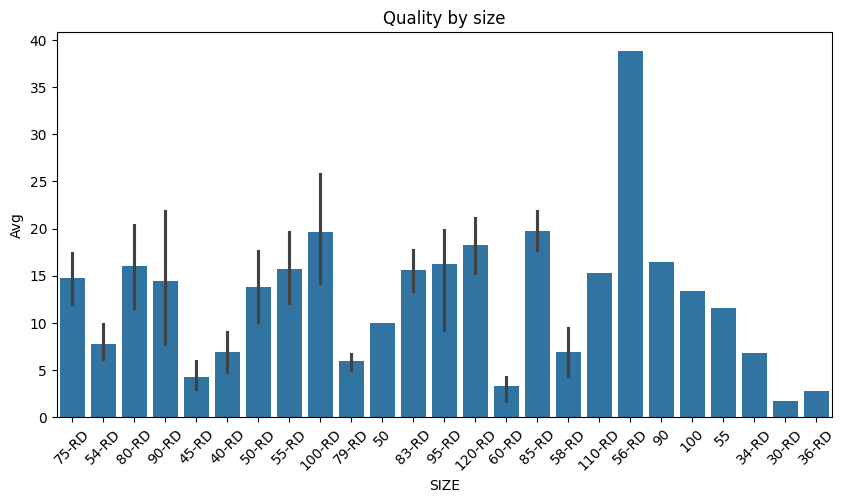

In [28]:
import seaborn as sns

plt.figure(figsize=(10,5))
sns.barplot(x='SIZE',y='Avg',data=df)
plt.title('Quality by size')
plt.xticks(rotation=45)
plt.show()

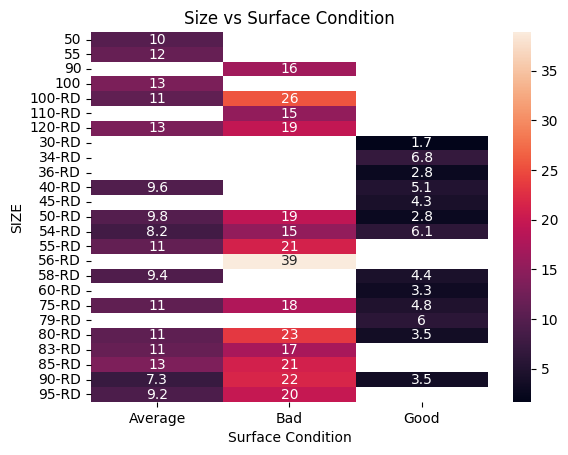

In [29]:
pivot=pd.pivot_table(
      df,
      index='SIZE',
      columns='Surface Condition',
      values='Avg',
      aggfunc='mean'
   )
plt.figure()
sns.heatmap(pivot,annot=True)
plt.title('Size vs Surface Condition')
plt.show()

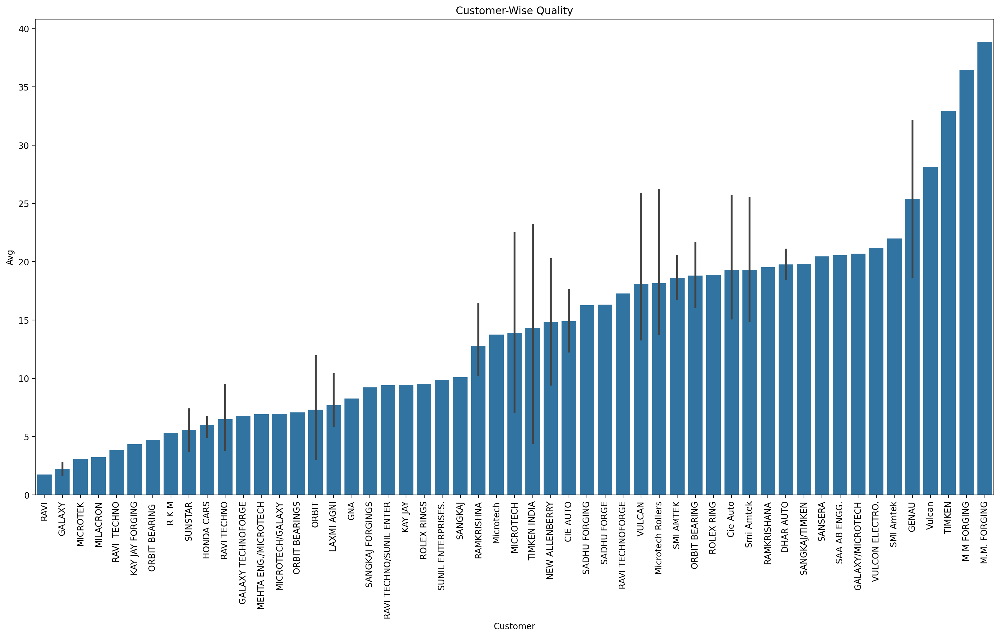

In [30]:
#Customer Comparison
order=df.groupby('Customer')['Avg'].mean().sort_values().index
plt.figure(figsize=(20,10),dpi=200)
sns.barplot(data=df,x='Customer',y='Avg',order=order)
plt.title('Customer-Wise Quality')
plt.xticks(rotation=90)
plt.show()

In [31]:
df1=pd.read_excel('/content/Mar- 2026..xlsx')

In [32]:
df1.head()

,Date,Shift,QC Shift Incharge,Heat No,Grade,Type of Steel,Finishing Mill\n(BM/HV),Customer,Input Size\n(mm),Output Size\n(mm),...,Remarks,Rolled pcs,Avg Defect/Bar,Surface Quality,Surface Condition,R&D Testing Observation,UT Total INSP QTY,UT Reject QTY,UT OK QTY,UT Acceptence Criteria
0,2026-01-03 00:00:00,A,SUMIT,66034,20MNCR5,Mn-Cr FAMILY,HV,VULCAN ELECTRO,280*320,RND 90,...,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...,NaN,NaN,NaN,Invalid,NaN,NaN,NaN,NaN,NaN
1,2026-01-03 00:00:00,A,SUMIT,66039,20MNCR5,Mn-Cr FAMILY,HV,VULCAN ELECTRO,280*320,RND 90,...,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...,NaN,NaN,NaN,Invalid,NaN,NaN,NaN,NaN,NaN
2,2026-01-03 00:00:00,A,SUMIT,66035,20MNCR5,Mn-Cr FAMILY,HV,VULCAN ELECTRO,280*320,RND 90,...,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...,NaN,NaN,NaN,Invalid,NaN,NaN,NaN,NaN,NaN
3,2026-01-03 00:00:00,A,SUMIT,66030,SAE1010,Low Carbon STEEL Grades,BM,CIE AUTOMOTIVE,280*320,SEMI 160,...,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...,....,....,....,....,....,....,....,....,....
4,2026-01-03 00:00:00,A,SUMIT,66009,38MNVS5,Micro Alloy Grades,BM,RAMKRISHNA,280*320,SEMI 140,...,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...,......,......,......,Invalid,......,......,......,......,......


In [33]:
df1.drop(['Rolled pcs','Avg Defect/Bar','Surface Quality','Surface Condition','R&D Testing Observation','UT Total INSP QTY','UT Reject QTY','UT OK QTY','UT Acceptence Criteria'],axis=1,inplace=True)

In [34]:
df1.head()

,Date,Shift,QC Shift Incharge,Heat No,Grade,Type of Steel,Finishing Mill\n(BM/HV),Customer,Input Size\n(mm),Output Size\n(mm),...,Semis/Finished bar cooling,Temp.during transfer for pit cooling\n(˚C),Surface quality\n(Acid etching/MPI Test),Dimension of finished bar\n(mm),No.of blooms hot out / cobbel,Identification of Non prime / reject material,Identification of Bundle,Any Process Deviation,Roll Set No,Remarks
0,2026-01-03 00:00:00,A,SUMIT,66034,20MNCR5,Mn-Cr FAMILY,HV,VULCAN ELECTRO,280*320,RND 90,...,AIR,-,SPARIKING SCRATCH,"90.90,91,90.95,91.25",0,0,"Hot chalk marked, MTS Tag Done",No,5B,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...
1,2026-01-03 00:00:00,A,SUMIT,66039,20MNCR5,Mn-Cr FAMILY,HV,VULCAN ELECTRO,280*320,RND 90,...,AIR,-,SEAM,"90.90,90.65,90.65,90.75",0,0,"Hot chalk marked, MTS Tag Done",No,5B,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...
2,2026-01-03 00:00:00,A,SUMIT,66035,20MNCR5,Mn-Cr FAMILY,HV,VULCAN ELECTRO,280*320,RND 90,...,AIR,-,OK,"90.90,90.70,91.25,90.95",0,0,"Hot chalk marked, MTS Tag Done",No,5B,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...
3,2026-01-03 00:00:00,A,SUMIT,66030,SAE1010,Low Carbon STEEL Grades,BM,CIE AUTOMOTIVE,280*320,SEMI 160,...,AIR,-,OK,DONE,0,0,"Hot chalk marked, MTS Tag Done",No,5B,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...
4,2026-01-03 00:00:00,A,SUMIT,66009,38MNVS5,Micro Alloy Grades,BM,RAMKRISHNA,280*320,SEMI 140,...,AIR,-,OK,DONE,0,0,"Hot chalk marked, MTS Tag Done",No,5B,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...


In [35]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 507 entries, 0 to 506
Data columns (total 53 columns):
 #   Column                                               Non-Null Count  Dtype  
---  ------                                               --------------  -----  
 0   Date                                                 407 non-null    object 
 1   Shift                                                406 non-null    object 
 2   QC Shift Incharge                                    406 non-null    object 
 3   Heat No                                              406 non-null    object 
 4   Grade                                                406 non-null    object 
 5   Type of Steel                                        406 non-null    object 
 6   Finishing Mill
(BM/HV)                               406 non-null    object 
 7   Customer                                             405 non-null    object 
 8   Input Size
(mm)                                      405 non-null    o

In [36]:
df1.drop(['Total Blooms/Billets Charged','Separate charging of First and Last Blooms','Furnace cycle gap','End Discard in mm','Facility used for cutting','No.of blooms hot out / cobbel'],axis=1,inplace=True)

In [37]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 507 entries, 0 to 506
Data columns (total 47 columns):
 #   Column                                               Non-Null Count  Dtype  
---  ------                                               --------------  -----  
 0   Date                                                 407 non-null    object 
 1   Shift                                                406 non-null    object 
 2   QC Shift Incharge                                    406 non-null    object 
 3   Heat No                                              406 non-null    object 
 4   Grade                                                406 non-null    object 
 5   Type of Steel                                        406 non-null    object 
 6   Finishing Mill
(BM/HV)                               406 non-null    object 
 7   Customer                                             405 non-null    object 
 8   Input Size
(mm)                                      405 non-null    o

In [38]:
df1=df1[~df1['Finishing Mill\n(BM/HV)'].str.contains('BM',case=False,na=False)]

In [39]:
df1.head()

,Date,Shift,QC Shift Incharge,Heat No,Grade,Type of Steel,Finishing Mill\n(BM/HV),Customer,Input Size\n(mm),Output Size\n(mm),...,Temp of bar during Cutting \n(˚C),Semis/Finished bar cooling,Temp.during transfer for pit cooling\n(˚C),Surface quality\n(Acid etching/MPI Test),Dimension of finished bar\n(mm),Identification of Non prime / reject material,Identification of Bundle,Any Process Deviation,Roll Set No,Remarks
0,2026-01-03 00:00:00,A,SUMIT,66034,20MNCR5,Mn-Cr FAMILY,HV,VULCAN ELECTRO,280*320,RND 90,...,920-930,AIR,-,SPARIKING SCRATCH,"90.90,91,90.95,91.25",0,"Hot chalk marked, MTS Tag Done",No,5B,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...
1,2026-01-03 00:00:00,A,SUMIT,66039,20MNCR5,Mn-Cr FAMILY,HV,VULCAN ELECTRO,280*320,RND 90,...,920-930,AIR,-,SEAM,"90.90,90.65,90.65,90.75",0,"Hot chalk marked, MTS Tag Done",No,5B,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...
2,2026-01-03 00:00:00,A,SUMIT,66035,20MNCR5,Mn-Cr FAMILY,HV,VULCAN ELECTRO,280*320,RND 90,...,920-930,AIR,-,OK,"90.90,90.70,91.25,90.95",0,"Hot chalk marked, MTS Tag Done",No,5B,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...
5,2026-01-03 00:00:00,A,SUMIT,66026,EN353,Cr+Ni+Mo Steel,HV,DHAR AUTO,280*320,RND 90,...,920-930,AIR,-,OK,"90.95,90.75,91.05,90.80",0,"Hot chalk marked, MTS Tag Done",No,5B,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...
6,2026-01-03 00:00:00,A,SUMIT,66040,11V41,Semi Free Cutting steel,HV,SUNSTAR PRECISION,280*320,RND 90,...,920-930,AIR,-,OK,"90.85,90.60,90.60,90.75",0,"Hot chalk marked, MTS Tag Done",No,5B,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...


In [40]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 276 entries, 0 to 506
Data columns (total 47 columns):
 #   Column                                               Non-Null Count  Dtype  
---  ------                                               --------------  -----  
 0   Date                                                 176 non-null    object 
 1   Shift                                                175 non-null    object 
 2   QC Shift Incharge                                    175 non-null    object 
 3   Heat No                                              175 non-null    object 
 4   Grade                                                175 non-null    object 
 5   Type of Steel                                        175 non-null    object 
 6   Finishing Mill
(BM/HV)                               175 non-null    object 
 7   Customer                                             175 non-null    object 
 8   Input Size
(mm)                                      175 non-null    object

In [41]:
df1.shape

(276, 47)

In [42]:
for col in df1.columns:
    print(repr(col))

'Date '
'Shift'
'QC Shift Incharge'
'Heat No'
'Grade'
'Type of Steel'
'Finishing Mill\n(BM/HV)'
'Customer'
'Input Size\n(mm)'
'Output Size\n(mm)'
'Hot /Cold charge '
'Grinding /Non Grinding '
'Lime Coating'
'No of bloom charge weight \n(MT)'
'Descaler Pressure Blomming mill\n(250BAR)'
'Level of oxygen in SZ & HZ\n(%)'
'Temperature at Pre-Heating Zone\n(˚C)'
'STD. Temp of Heating Zone \n(Top/Bottom\n˚C) (+/- 20)'
'STD. Temp of Soaking Zone \n(Top/Bottom˚C) (+/-20)'
'Temp at Heating Zone \n(Top) \n(˚C)'
'Temp at Heating Zone (Bottom)\n(˚C)'
'Temp at Soaking Zone \n(Top) \n(˚C)'
'Temp at Soaking Zone (Bottom)\n(˚C)'
'Surface Temp After Descaling in BM\n(˚C)'
'Core Temp After Descaling in BM\n(˚C)'
'Temp Before Entry and Exit In BM mill (˚C)'
'Temp Before Entry to HV mill (˚C)'
'Temp after Finish in HV mill (˚C)'
'Temp at Cooling Bed\n(˚C)'
'STD. Furnace Residence Time FRT \n(HR)'
'FIRST BLOOM FRT   (HRS)'
'LAST BLOOM FRT    (HRS)'
'Mill Speed \nBM\n(m/s)'
'Mill Speed \nHV\n(m/s)'
'Descale

In [43]:
df1.drop(['No of bloom charge weight \n(MT)','Dimension of finished bar\n(mm)'],axis=1,inplace=True)

In [44]:
df1.columns = df1.columns.str.replace('[^A-Za-z0-9 ]', '', regex=True)

In [45]:
for col in df1.columns:
    print(repr(col))

'Date '
'Shift'
'QC Shift Incharge'
'Heat No'
'Grade'
'Type of Steel'
'Finishing MillBMHV'
'Customer'
'Input Sizemm'
'Output Sizemm'
'Hot Cold charge '
'Grinding Non Grinding '
'Lime Coating'
'Descaler Pressure Blomming mill250BAR'
'Level of oxygen in SZ  HZ'
'Temperature at PreHeating ZoneC'
'STD Temp of Heating Zone TopBottomC  20'
'STD Temp of Soaking Zone TopBottomC 20'
'Temp at Heating Zone Top C'
'Temp at Heating Zone BottomC'
'Temp at Soaking Zone Top C'
'Temp at Soaking Zone BottomC'
'Surface Temp After Descaling in BMC'
'Core Temp After Descaling in BMC'
'Temp Before Entry and Exit In BM mill C'
'Temp Before Entry to HV mill C'
'Temp after Finish in HV mill C'
'Temp at Cooling BedC'
'STD Furnace Residence Time FRT HR'
'FIRST BLOOM FRT   HRS'
'LAST BLOOM FRT    HRS'
'Mill Speed BMms'
'Mill Speed HVms'
'Descaler Pressure HV mill210Bar'
'No of passes required for BM Mll '
'No of passes required for HV Mll '
'Temp of bar during Cutting C'
'SemisFinished bar cooling'
'Tempduring tr

In [46]:
df1.head()

,Date,Shift,QC Shift Incharge,Heat No,Grade,Type of Steel,Finishing MillBMHV,Customer,Input Sizemm,Output Sizemm,...,No of passes required for HV Mll,Temp of bar during Cutting C,SemisFinished bar cooling,Tempduring transfer for pit coolingC,Surface qualityAcid etchingMPI Test,Identification of Non prime reject material,Identification of Bundle,Any Process Deviation,Roll Set No,Remarks
0,2026-01-03 00:00:00,A,SUMIT,66034,20MNCR5,Mn-Cr FAMILY,HV,VULCAN ELECTRO,280*320,RND 90,...,10,920-930,AIR,-,SPARIKING SCRATCH,0,"Hot chalk marked, MTS Tag Done",No,5B,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...
1,2026-01-03 00:00:00,A,SUMIT,66039,20MNCR5,Mn-Cr FAMILY,HV,VULCAN ELECTRO,280*320,RND 90,...,10,920-930,AIR,-,SEAM,0,"Hot chalk marked, MTS Tag Done",No,5B,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...
2,2026-01-03 00:00:00,A,SUMIT,66035,20MNCR5,Mn-Cr FAMILY,HV,VULCAN ELECTRO,280*320,RND 90,...,10,920-930,AIR,-,OK,0,"Hot chalk marked, MTS Tag Done",No,5B,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...
5,2026-01-03 00:00:00,A,SUMIT,66026,EN353,Cr+Ni+Mo Steel,HV,DHAR AUTO,280*320,RND 90,...,10,920-930,AIR,-,OK,0,"Hot chalk marked, MTS Tag Done",No,5B,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...
6,2026-01-03 00:00:00,A,SUMIT,66040,11V41,Semi Free Cutting steel,HV,SUNSTAR PRECISION,280*320,RND 90,...,10,920-930,AIR,-,OK,0,"Hot chalk marked, MTS Tag Done",No,5B,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...


In [47]:
df1[df1.duplicated]

,Date,Shift,QC Shift Incharge,Heat No,Grade,Type of Steel,Finishing MillBMHV,Customer,Input Sizemm,Output Sizemm,...,No of passes required for HV Mll,Temp of bar during Cutting C,SemisFinished bar cooling,Tempduring transfer for pit coolingC,Surface qualityAcid etchingMPI Test,Identification of Non prime reject material,Identification of Bundle,Any Process Deviation,Roll Set No,Remarks
409,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
410,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
411,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
412,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
413,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
502,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
503,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
504,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
505,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
df1.drop_duplicates(inplace=True)

In [49]:
df1[df1.duplicated]

,Date,Shift,QC Shift Incharge,Heat No,Grade,Type of Steel,Finishing MillBMHV,Customer,Input Sizemm,Output Sizemm,...,No of passes required for HV Mll,Temp of bar during Cutting C,SemisFinished bar cooling,Tempduring transfer for pit coolingC,Surface qualityAcid etchingMPI Test,Identification of Non prime reject material,Identification of Bundle,Any Process Deviation,Roll Set No,Remarks


In [50]:
df1.head()

,Date,Shift,QC Shift Incharge,Heat No,Grade,Type of Steel,Finishing MillBMHV,Customer,Input Sizemm,Output Sizemm,...,No of passes required for HV Mll,Temp of bar during Cutting C,SemisFinished bar cooling,Tempduring transfer for pit coolingC,Surface qualityAcid etchingMPI Test,Identification of Non prime reject material,Identification of Bundle,Any Process Deviation,Roll Set No,Remarks
0,2026-01-03 00:00:00,A,SUMIT,66034,20MNCR5,Mn-Cr FAMILY,HV,VULCAN ELECTRO,280*320,RND 90,...,10,920-930,AIR,-,SPARIKING SCRATCH,0,"Hot chalk marked, MTS Tag Done",No,5B,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...
1,2026-01-03 00:00:00,A,SUMIT,66039,20MNCR5,Mn-Cr FAMILY,HV,VULCAN ELECTRO,280*320,RND 90,...,10,920-930,AIR,-,SEAM,0,"Hot chalk marked, MTS Tag Done",No,5B,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...
2,2026-01-03 00:00:00,A,SUMIT,66035,20MNCR5,Mn-Cr FAMILY,HV,VULCAN ELECTRO,280*320,RND 90,...,10,920-930,AIR,-,OK,0,"Hot chalk marked, MTS Tag Done",No,5B,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...
5,2026-01-03 00:00:00,A,SUMIT,66026,EN353,Cr+Ni+Mo Steel,HV,DHAR AUTO,280*320,RND 90,...,10,920-930,AIR,-,OK,0,"Hot chalk marked, MTS Tag Done",No,5B,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...
6,2026-01-03 00:00:00,A,SUMIT,66040,11V41,Semi Free Cutting steel,HV,SUNSTAR PRECISION,280*320,RND 90,...,10,920-930,AIR,-,OK,0,"Hot chalk marked, MTS Tag Done",No,5B,IMPROPER DESCALING IN ENTRY OF BLOOMING MILL T...


In [51]:
df.columns = df.columns.str.replace('[^A-Za-z0-9 ]', '', regex=True).str.strip()
df1.columns = df1.columns.str.replace('[^A-Za-z0-9 ]', '', regex=True).str.strip()

In [52]:
for col in df.columns:
    print(repr(col))

print("------")

for col in df1.columns:
    print(repr(col))

'INSP DATE'
'CAST SIZE'
'Rolling Date'
'HEAT NO'
'GRADE'
'SIZE'
'Customer'
'Rolled pcs'
'ROLLING MILL'
'AGENCY'
'Avg'
'Surface Quality'
'Surface Condition'
------
'Date'
'Shift'
'QC Shift Incharge'
'Heat No'
'Grade'
'Type of Steel'
'Finishing MillBMHV'
'Customer'
'Input Sizemm'
'Output Sizemm'
'Hot Cold charge'
'Grinding Non Grinding'
'Lime Coating'
'Descaler Pressure Blomming mill250BAR'
'Level of oxygen in SZ  HZ'
'Temperature at PreHeating ZoneC'
'STD Temp of Heating Zone TopBottomC  20'
'STD Temp of Soaking Zone TopBottomC 20'
'Temp at Heating Zone Top C'
'Temp at Heating Zone BottomC'
'Temp at Soaking Zone Top C'
'Temp at Soaking Zone BottomC'
'Surface Temp After Descaling in BMC'
'Core Temp After Descaling in BMC'
'Temp Before Entry and Exit In BM mill C'
'Temp Before Entry to HV mill C'
'Temp after Finish in HV mill C'
'Temp at Cooling BedC'
'STD Furnace Residence Time FRT HR'
'FIRST BLOOM FRT   HRS'
'LAST BLOOM FRT    HRS'
'Mill Speed BMms'
'Mill Speed HVms'
'Descaler Pressure 

In [53]:
# Clean df
df.columns = df.columns.str.strip().str.lower()

# Clean df1
df1.columns = df1.columns.str.strip().str.lower()

In [54]:
print(df.columns)
print(df1.columns)

Index(['insp date', 'cast size', 'rolling date', 'heat no', 'grade', 'size',
       'customer', 'rolled pcs', 'rolling mill', 'agency', 'avg',
       'surface quality', 'surface condition'],
      dtype='object')
Index(['date', 'shift', 'qc shift incharge', 'heat no', 'grade',
       'type of steel', 'finishing millbmhv', 'customer', 'input sizemm',
       'output sizemm', 'hot cold charge', 'grinding non grinding',
       'lime coating', 'descaler pressure blomming mill250bar',
       'level of oxygen in sz  hz', 'temperature at preheating zonec',
       'std temp of heating zone topbottomc  20',
       'std temp of soaking zone topbottomc 20', 'temp at heating zone top c',
       'temp at heating zone bottomc', 'temp at soaking zone top c',
       'temp at soaking zone bottomc', 'surface temp after descaling in bmc',
       'core temp after descaling in bmc',
       'temp before entry and exit in bm mill c',
       'temp before entry to hv mill c', 'temp after finish in hv mill c',
 

In [55]:
df_process_quality = pd.merge(
    df,
    df1,
    on=['heat no', 'grade', 'customer'],
    how='inner'
)

In [56]:
df_process_quality.head()

,insp date,cast size,rolling date,heat no,grade,size,customer,rolled pcs,rolling mill,agency,...,no of passes required for hv mll,temp of bar during cutting c,semisfinished bar cooling,tempduring transfer for pit coolingc,surface qualityacid etchingmpi test,identification of non prime reject material,identification of bundle,any process deviation,roll set no,remarks
0,2026-06-03,280X320,2026-03-03,66063,40CR4C,100-RD,RAMKRISHNA,188,HVM,OM,...,8,490-790,AIR,-,OK,0,"Hot chalk marked, MTS Tag Done",No,16 C,NO
1,2026-09-03,280X320,2026-05-03,66088,S48CS1V,83-RD,SMI AMTEK,210,HVM,OM,...,10,910-930,AIR,-,NaN,0,"Hot chalk marked, MTS Tag Done",No,16C,NO
2,2026-09-03,280X320,2026-05-03,66088,S48CS1V,83-RD,SMI AMTEK,210,HVM,OM,...,10,910-930,AIR,-,OK,0,"Hot chalk marked, MTS Tag Done",No,10J,NO
3,2026-09-03,280X320,2026-05-03,66089,S48CS1V,83-RD,SMI AMTEK,224,HVM,OM,...,10,910-930,AIR,-,NaN,0,"Hot chalk marked, MTS Tag Done",No,16C,NO
4,2026-09-03,280X320,2026-05-03,66089,S48CS1V,83-RD,SMI AMTEK,224,HVM,OM,...,10,910-930,AIR,-,MINOR CRACK,0,"Hot chalk marked, MTS Tag Done",No,10J,NO


In [57]:
df_process_quality.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24 entries, 0 to 23
Data columns (total 55 columns):
 #   Column                                        Non-Null Count  Dtype         
---  ------                                        --------------  -----         
 0   insp date                                     24 non-null     datetime64[ns]
 1   cast size                                     24 non-null     object        
 2   rolling date                                  24 non-null     datetime64[ns]
 3   heat no                                       24 non-null     object        
 4   grade                                         24 non-null     object        
 5   size                                          24 non-null     object        
 6   customer                                      24 non-null     object        
 7   rolled pcs                                    24 non-null     int64         
 8   rolling mill                                  24 non-null     object    

In [58]:
df_process_quality['date']=pd.to_datetime(df_process_quality['date'])

In [59]:
df_process_quality.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24 entries, 0 to 23
Data columns (total 55 columns):
 #   Column                                        Non-Null Count  Dtype         
---  ------                                        --------------  -----         
 0   insp date                                     24 non-null     datetime64[ns]
 1   cast size                                     24 non-null     object        
 2   rolling date                                  24 non-null     datetime64[ns]
 3   heat no                                       24 non-null     object        
 4   grade                                         24 non-null     object        
 5   size                                          24 non-null     object        
 6   customer                                      24 non-null     object        
 7   rolled pcs                                    24 non-null     int64         
 8   rolling mill                                  24 non-null     object    

In [60]:
df_process_quality[df_process_quality.duplicated]

,insp date,cast size,rolling date,heat no,grade,size,customer,rolled pcs,rolling mill,agency,...,no of passes required for hv mll,temp of bar during cutting c,semisfinished bar cooling,tempduring transfer for pit coolingc,surface qualityacid etchingmpi test,identification of non prime reject material,identification of bundle,any process deviation,roll set no,remarks


In [61]:
df_process_quality.isnull().sum()

,0
insp date,0
cast size,0
rolling date,0
heat no,0
grade,0
size,0
customer,0
rolled pcs,0
rolling mill,0
agency,0


In [62]:
print(df_process_quality.columns.tolist())

['insp date', 'cast size', 'rolling date', 'heat no', 'grade', 'size', 'customer', 'rolled pcs', 'rolling mill', 'agency', 'avg', 'surface quality', 'surface condition', 'date', 'shift', 'qc shift incharge', 'type of steel', 'finishing millbmhv', 'input sizemm', 'output sizemm', 'hot cold charge', 'grinding non grinding', 'lime coating', 'descaler pressure blomming mill250bar', 'level of oxygen in sz  hz', 'temperature at preheating zonec', 'std temp of heating zone topbottomc  20', 'std temp of soaking zone topbottomc 20', 'temp at heating zone top c', 'temp at heating zone bottomc', 'temp at soaking zone top c', 'temp at soaking zone bottomc', 'surface temp after descaling in bmc', 'core temp after descaling in bmc', 'temp before entry and exit in bm mill c', 'temp before entry to hv mill c', 'temp after finish in hv mill c', 'temp at cooling bedc', 'std furnace residence time frt hr', 'first bloom frt   hrs', 'last bloom frt    hrs', 'mill speed bmms', 'mill speed hvms', 'descaler p

In [63]:
print(df_process_quality.columns)

Index(['insp date', 'cast size', 'rolling date', 'heat no', 'grade', 'size',
       'customer', 'rolled pcs', 'rolling mill', 'agency', 'avg',
       'surface quality', 'surface condition', 'date', 'shift',
       'qc shift incharge', 'type of steel', 'finishing millbmhv',
       'input sizemm', 'output sizemm', 'hot cold charge',
       'grinding non grinding', 'lime coating',
       'descaler pressure blomming mill250bar', 'level of oxygen in sz  hz',
       'temperature at preheating zonec',
       'std temp of heating zone topbottomc  20',
       'std temp of soaking zone topbottomc 20', 'temp at heating zone top c',
       'temp at heating zone bottomc', 'temp at soaking zone top c',
       'temp at soaking zone bottomc', 'surface temp after descaling in bmc',
       'core temp after descaling in bmc',
       'temp before entry and exit in bm mill c',
       'temp before entry to hv mill c', 'temp after finish in hv mill c',
       'temp at cooling bedc', 'std furnace residence ti

In [64]:
df_process_quality.drop(['insp date', 'cast size', 'rolling date','rolled pcs','shift','qc shift incharge','level of oxygen in sz  hz'],axis=1,inplace=True)

In [65]:
df_process_quality.head()

,heat no,grade,size,customer,rolling mill,agency,avg,surface quality,surface condition,date,...,no of passes required for hv mll,temp of bar during cutting c,semisfinished bar cooling,tempduring transfer for pit coolingc,surface qualityacid etchingmpi test,identification of non prime reject material,identification of bundle,any process deviation,roll set no,remarks
0,66063,40CR4C,100-RD,RAMKRISHNA,HVM,OM,9.000000,B,Average,2026-03-03,...,8,490-790,AIR,-,OK,0,"Hot chalk marked, MTS Tag Done",No,16 C,NO
1,66088,S48CS1V,83-RD,SMI AMTEK,HVM,OM,15.315789,C,Bad,2026-05-03,...,10,910-930,AIR,-,NaN,0,"Hot chalk marked, MTS Tag Done",No,16C,NO
2,66088,S48CS1V,83-RD,SMI AMTEK,HVM,OM,15.315789,C,Bad,2026-05-03,...,10,910-930,AIR,-,OK,0,"Hot chalk marked, MTS Tag Done",No,10J,NO
3,66089,S48CS1V,83-RD,SMI AMTEK,HVM,OM,16.652174,C,Bad,2026-05-03,...,10,910-930,AIR,-,NaN,0,"Hot chalk marked, MTS Tag Done",No,16C,NO
4,66089,S48CS1V,83-RD,SMI AMTEK,HVM,OM,16.652174,C,Bad,2026-05-03,...,10,910-930,AIR,-,MINOR CRACK,0,"Hot chalk marked, MTS Tag Done",No,10J,NO


In [66]:
cols = [
    'descaler pressure hv mill210bar',
    'descaler pressure blomming mill250bar'
]

for col in cols:
    df_process_quality[col] = (
        df_process_quality[col]
        .astype(str)                # ensure string
        .str.extract('(\d+)')       # extract only numbers
    )
    df_process_quality[col] = pd.to_numeric(df_process_quality[col], errors='coerce')

<>:10: SyntaxWarning: invalid escape sequence '\d'
<>:10: SyntaxWarning: invalid escape sequence '\d'
/tmp/ipykernel_17935/650542403.py:10: SyntaxWarning: invalid escape sequence '\d'
  .str.extract('(\d+)')       # extract only numbers


In [67]:
df_process_quality[cols].dtypes

,0
descaler pressure hv mill210bar,int64
descaler pressure blomming mill250bar,int64


In [68]:
df_process_quality.shape

(24, 48)

In [69]:
df_process_quality.groupby('surface condition').mean(numeric_only=True)

,avg,descaler pressure blomming mill250bar,temperature at preheating zonec,std temp of heating zone topbottomc 20,std temp of soaking zone topbottomc 20,temp at heating zone top c,temp at heating zone bottomc,temp at soaking zone top c,temp at soaking zone bottomc,surface temp after descaling in bmc,core temp after descaling in bmc,descaler pressure hv mill210bar
surface condition,,,,,,,,,,,,
Average,12.160000,253.333333,1025.333333,1196.666667,1236.666667,1208.000000,1186.666667,1238.000000,1246.666667,1115.000000,1115.333333,124.666667
Bad,19.086808,236.277778,990.687500,1206.666667,1255.000000,1193.625000,1196.875000,1245.687500,1245.875000,1106.333333,1109.866667,124.222222
Good,5.665098,233.333333,1026.000000,1203.333333,1253.333333,1198.333333,1200.000000,1239.333333,1247.666667,1124.666667,1130.333333,121.666667


In [70]:
df_process_quality.groupby(['grade','surface condition']).mean(numeric_only=True)

avg  descaler pressure blomming mill250bar  \
grade    surface condition                                                     
30MNVS6  Bad                16.333333                               0.000000   
38MNS6   Average            13.480000                             253.000000   
38MNVS6  Average            14.000000                             253.000000   
         Bad                21.150757                             253.888889   
40CR4C   Average             9.000000                             254.000000   
C45      Good                3.235294                             252.000000   
DY7A     Good                6.880000                             224.000000   
EN353    Bad                21.050000                             195.000000   
S48CS1V  Bad                16.424104                             252.666667   
SAE52100 Bad                17.277778                             257.000000   

                            temperature at preheating zonec  \
grade    surface condition                                    
30MNVS6  Bad                                    1061.000000   
38MNS6   Average                                1060.000000   
38MNVS6  Average                                 991.000000   
         Bad                                     948.444444   
40CR4C   Average                                1025.000000   
C45      Good                                   1055.000000   
DY7A     Good                                   1011.500000   
EN353    Bad                                    1020.000000   
S48CS1V  Bad                                    1047.250000   
SAE52100 Bad                                    1045.000000   

                            std temp of heating zone topbottomc  20  \
grade    surface condition                                            
30MNVS6  Bad                                                 1210.0   
38MNS6   Average                                             1210.0   
38MNVS6  Average                                             1210.0   
         Bad                                                 1210.0   
40CR4C   Average                                             1170.0   
C45      Good                                                1210.0   
DY7A     Good                                                1200.0   
EN353    Bad                                                 1210.0   
S48CS1V  Bad                                                 1210.0   
SAE52100 Bad                                                 1150.0   

                            std temp of soaking zone topbottomc 20  \
grade    surface condition                                           
30MNVS6  Bad                                                1260.0   
38MNS6   Average                                            1260.0   
38MNVS6  Average                                            1260.0   
         Bad                                                1260.0   
40CR4C   Average                                            1190.0   
C45      Good                                               1260.0   
DY7A     Good                                               1250.0   
EN353    Bad                                                1260.0   
S48CS1V  Bad                                                1260.0   
SAE52100 Bad                                                1170.0   

                            temp at heating zone top c  \
grade    surface condition                               
30MNVS6  Bad                               1212.000000   
38MNS6   Average                           1232.000000   
38MNVS6  Average                           1217.000000   
         Bad                               1191.444444   
40CR4C   Average                           1175.000000   
C45      Good                              1207.000000   
DY7A     Good                              1194.000000   
EN353    Bad                               1200.000000   
S48CS1V  Bad                              

In [71]:
grouped = df_process_quality.groupby(
    ['heat no', 'grade', 'input sizemm', 'output sizemm', 'surface condition']
)[
    [
        'temp at heating zone top c',
        'temp at heating zone bottomc',
        'temp at soaking zone top c',
        'temp at soaking zone bottomc',
        'descaler pressure blomming mill250bar',
        'descaler pressure hv mill210bar'
    ]
].mean().reset_index()

In [72]:
import pandas as pd

cols = [
    'temp at heating zone top c',
    'temp at heating zone bottomc',
    'temp at soaking zone top c',
    'temp at soaking zone bottomc',
    'descaler pressure blomming mill250bar',
    'descaler pressure hv mill210bar'
]

# Convert wide → long
long_df = grouped.melt(
    id_vars=['grade', 'surface condition'],
    value_vars=cols,
    var_name='parameter',
    value_name='value'
)

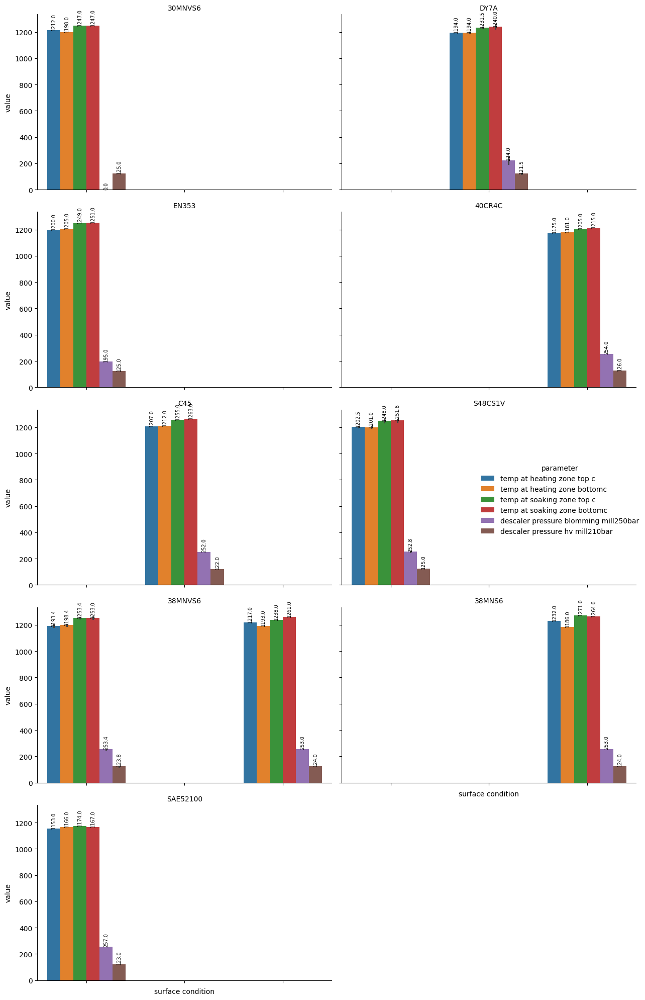

In [73]:
import seaborn as sns
import matplotlib.pyplot as plt

g = sns.catplot(
    data=long_df,
    x='surface condition',
    y='value',
    hue='parameter',
    col='grade',              # separate plot for each grade
    kind='bar',
    col_wrap=2,               # adjust layout
    height=4,
    aspect=1.2
)

g.set_titles("{col_name}")
g.set_xticklabels(rotation=0)

for ax in g.axes.flat:
    for container in ax.containers:
        ax.bar_label(container, fmt='%.1f', fontsize=7, rotation=90)

plt.tight_layout()
plt.show()

In [74]:
temp_cols = cols[:4]

long_temp = grouped.melt(
    id_vars=['grade', 'surface condition'],
    value_vars=temp_cols,
    var_name='parameter',
    value_name='value'
)

In [75]:
pressure_cols = cols[4:]

long_pressure = grouped.melt(
    id_vars=['grade', 'surface condition'],
    value_vars=pressure_cols,
    var_name='parameter',
    value_name='value'
)

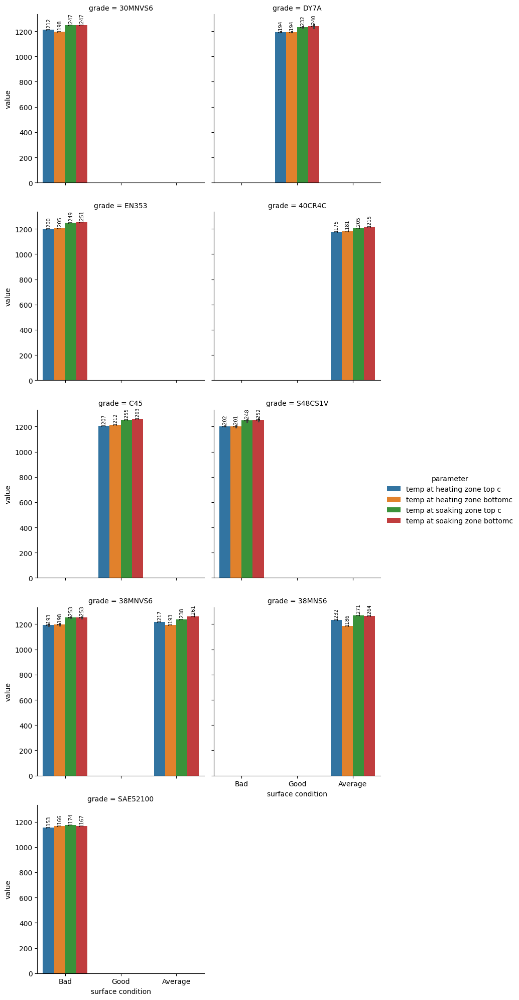

In [76]:
import seaborn as sns
import matplotlib.pyplot as plt

temp_cols = [
    'temp at heating zone top c',
    'temp at heating zone bottomc',
    'temp at soaking zone top c',
    'temp at soaking zone bottomc'
]

long_temp = grouped.melt(
    id_vars=['grade', 'surface condition'],
    value_vars=temp_cols,
    var_name='parameter',
    value_name='value'
)

g = sns.catplot(
    data=long_temp,
    x='surface condition',     # IMPORTANT
    y='value',
    hue='parameter',           # parameters shown as colors
    col='grade',               # separate grade
    kind='bar',
    col_wrap=2,
    height=4
)

# Add values
for ax in g.axes.flat:
    for container in ax.containers:
        ax.bar_label(container, fmt='%.0f', fontsize=7, rotation=90)

plt.show()

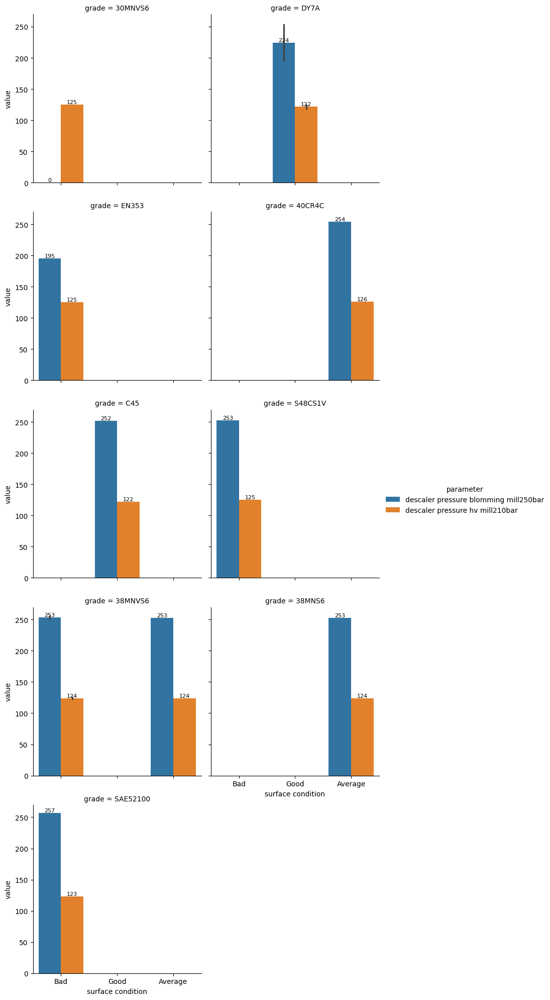

In [77]:
pressure_cols = [
    'descaler pressure blomming mill250bar',
    'descaler pressure hv mill210bar'
]

long_pressure = grouped.melt(
    id_vars=['grade', 'surface condition'],
    value_vars=pressure_cols,
    var_name='parameter',
    value_name='value'
)

g = sns.catplot(
    data=long_pressure,
    x='surface condition',     # shows Bad/Good clearly
    y='value',
    hue='parameter',
    col='grade',
    kind='bar',
    col_wrap=2,
    height=4
)

# Add values
for ax in g.axes.flat:
    for container in ax.containers:
        ax.bar_label(container, fmt='%.0f', fontsize=8)

plt.show()

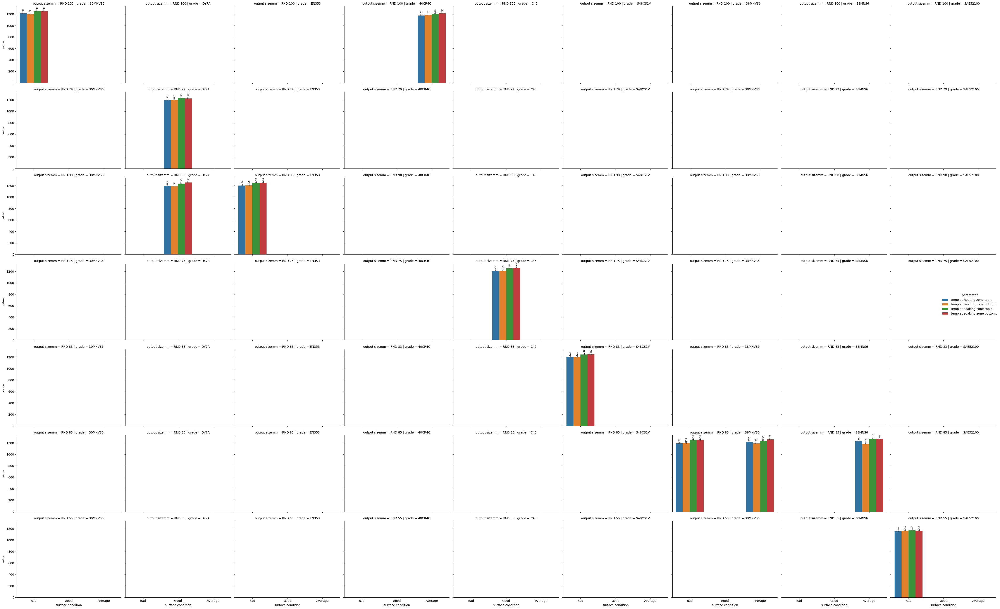

In [78]:
#Updated Temperature Plot (with Output Size)
import seaborn as sns
import matplotlib.pyplot as plt

temp_cols = [
    'temp at heating zone top c',
    'temp at heating zone bottomc',
    'temp at soaking zone top c',
    'temp at soaking zone bottomc'
]

long_temp = grouped.melt(
    id_vars=['grade', 'surface condition', 'output sizemm', 'input sizemm'],
    value_vars=temp_cols,
    var_name='parameter',
    value_name='value'
)

g = sns.catplot(
    data=long_temp,
    x='surface condition',
    y='value',
    hue='parameter',
    col='grade',
    row='output sizemm',   #  NEW → separates by output size
    kind='bar',
    height=4,
    aspect=1.2
)

# Add values
for ax in g.axes.flat:
    for container in ax.containers:
        ax.bar_label(container, fmt='%.0f', fontsize=7, rotation=90)

plt.tight_layout()
plt.show()

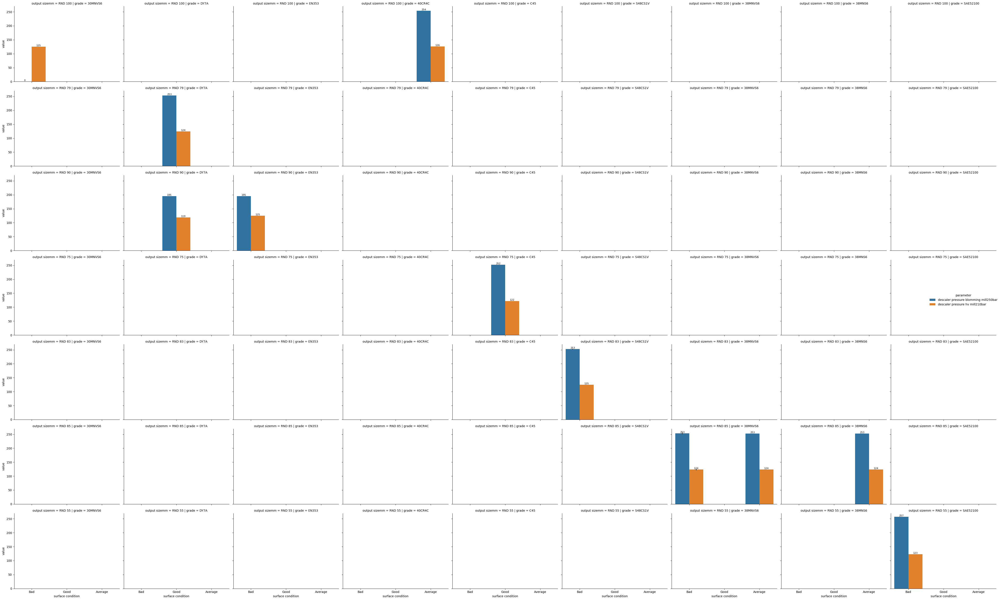

In [79]:
#Pressure Plot (MOST IMPORTANT FOR DEFECT)
pressure_cols = [
    'descaler pressure blomming mill250bar',
    'descaler pressure hv mill210bar'
]

long_pressure = grouped.melt(
    id_vars=['grade', 'surface condition', 'output sizemm', 'input sizemm'],
    value_vars=pressure_cols,
    var_name='parameter',
    value_name='value'
)

g = sns.catplot(
    data=long_pressure,
    x='surface condition',
    y='value',
    hue='parameter',
    col='grade',
    row='output sizemm',
    kind='bar',
    height=4,
    aspect=1.2
)

for ax in g.axes.flat:
    for container in ax.containers:
        ax.bar_label(container, fmt='%.0f', fontsize=8)

plt.tight_layout()
plt.show()

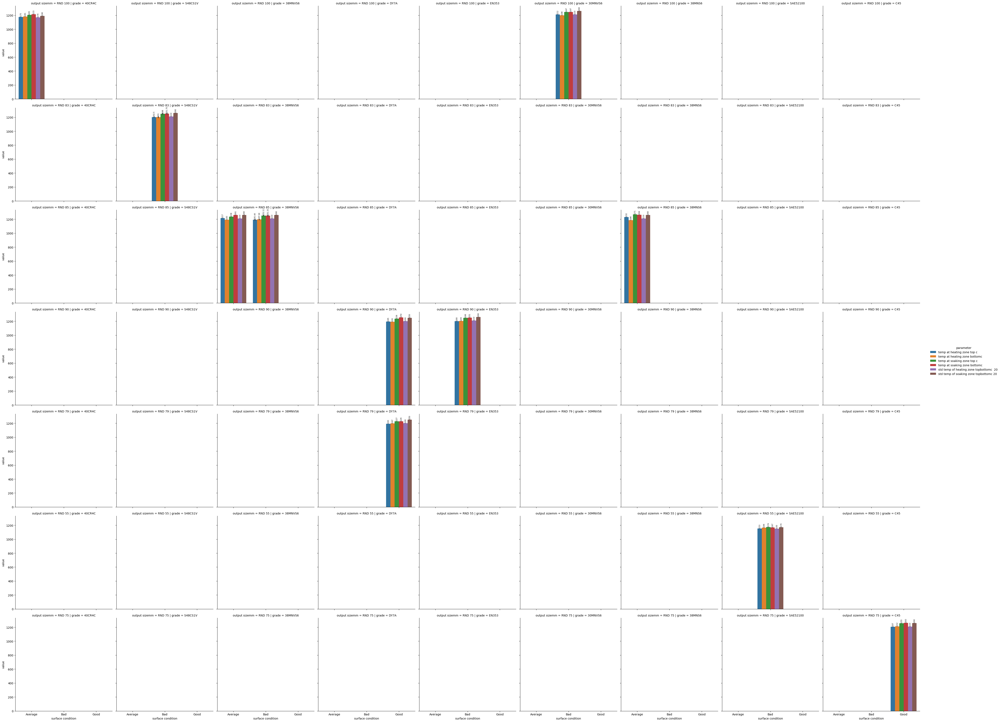

In [80]:
#Temperature + STD (Stability)
temp_std_cols = [
    'temp at heating zone top c',
    'temp at heating zone bottomc',
    'temp at soaking zone top c',
    'temp at soaking zone bottomc',
    'std temp of heating zone topbottomc  20',
    'std temp of soaking zone topbottomc 20'
]

long_temp_std = df_process_quality.melt(
    id_vars=['grade', 'surface condition', 'output sizemm'],
    value_vars=temp_std_cols,
    var_name='parameter',
    value_name='value'
)

g = sns.catplot(
    data=long_temp_std,
    x='surface condition',
    y='value',
    hue='parameter',
    col='grade',
    row='output sizemm',
    kind='bar'
)
for ax in g.axes.flat:
    for container in ax.containers:
        ax.bar_label(container, fontsize=6, rotation=90)

plt.show()

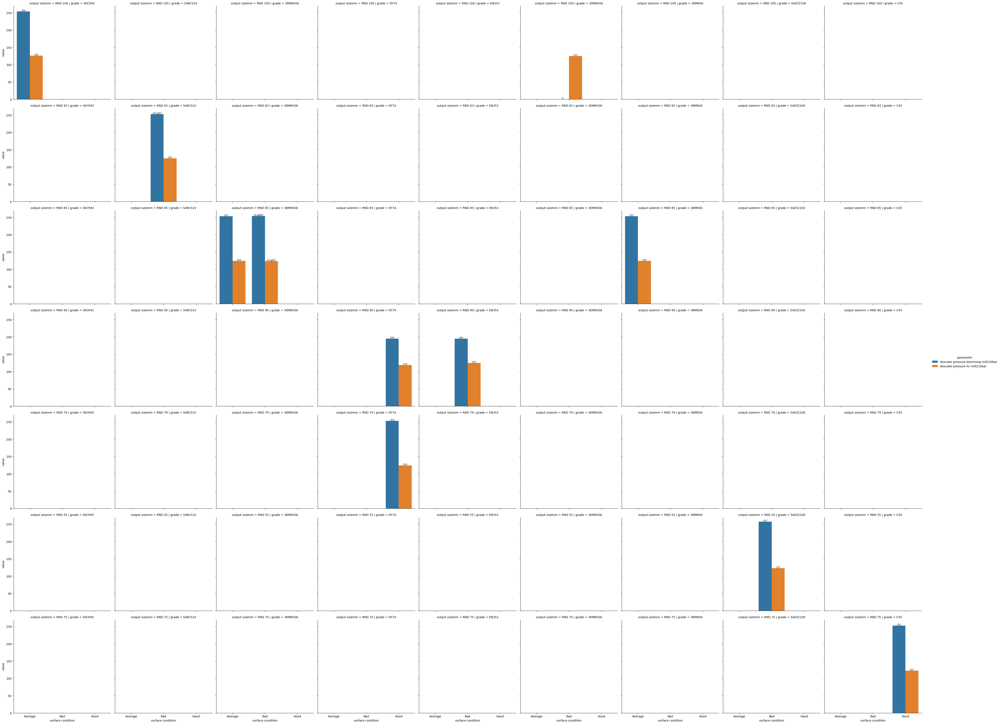

In [81]:
#Pressure (ROOT CAUSE)
pressure_cols = [
    'descaler pressure blomming mill250bar',
    'descaler pressure hv mill210bar'
]

long_pressure = df_process_quality.melt(
    id_vars=['grade', 'surface condition', 'output sizemm'],
    value_vars=pressure_cols,
    var_name='parameter',
    value_name='value'
)

g = sns.catplot(
    data=long_pressure,
    x='surface condition',
    y='value',
    hue='parameter',
    col='grade',
    row='output sizemm',
    kind='bar'
)

for ax in g.axes.flat:
    for container in ax.containers:
        ax.bar_label(container, fontsize=8)

plt.show()

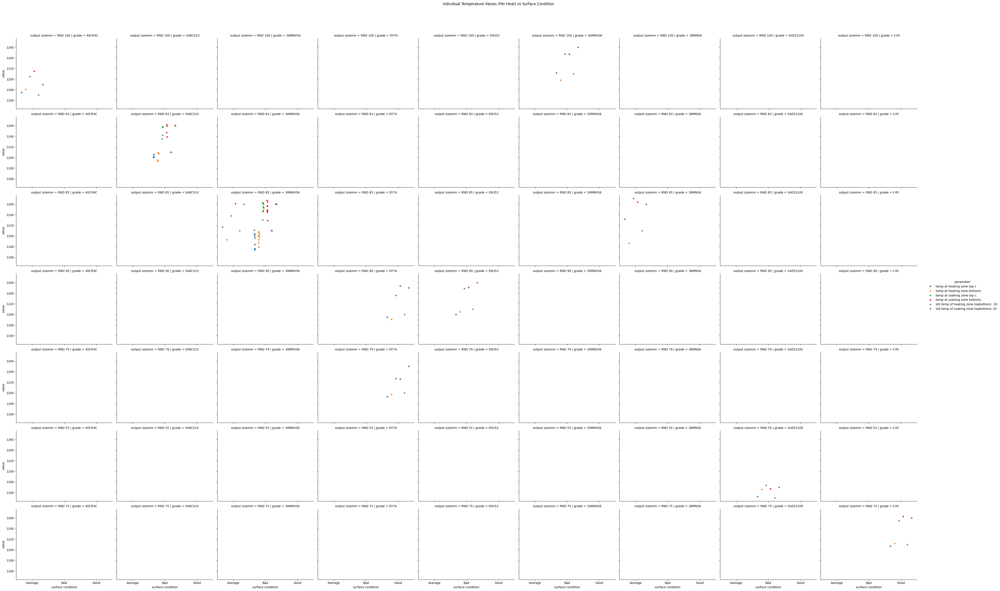

In [82]:
import seaborn as sns
import matplotlib.pyplot as plt

temp_std_cols = [
    'temp at heating zone top c',
    'temp at heating zone bottomc',
    'temp at soaking zone top c',
    'temp at soaking zone bottomc',
    'std temp of heating zone topbottomc  20',
    'std temp of soaking zone topbottomc 20'
]

# include heat no (VERY IMPORTANT)
long_temp_std = df_process_quality.melt(
    id_vars=['heat no','grade', 'surface condition', 'output sizemm'],
    value_vars=temp_std_cols,
    var_name='parameter',
    value_name='value'
)

#  RAW DATA PLOT (NO AVERAGE)
g = sns.catplot(
    data=long_temp_std,
    x='surface condition',
    y='value',
    hue='parameter',
    col='grade',
    row='output sizemm',
    kind='strip',      #  KEY CHANGE (no avg)
    dodge=True,
    height=4,
    aspect=1.2
)

g.fig.subplots_adjust(top=0.92)
g.fig.suptitle("Individual Temperature Values (Per Heat) vs Surface Condition")

plt.show()

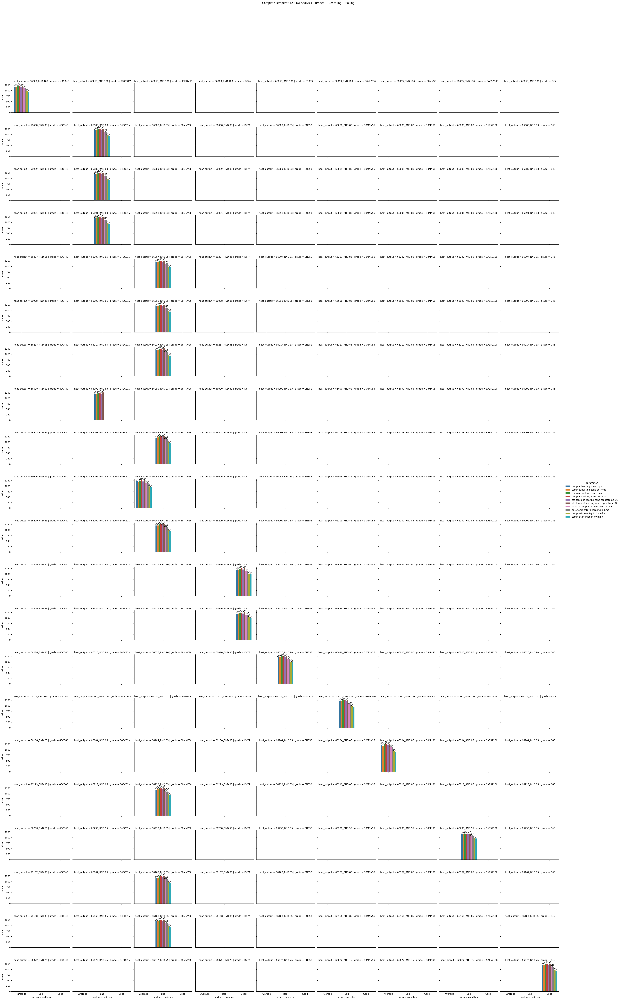

In [83]:
import seaborn as sns
import matplotlib.pyplot as plt

#  ALL COLUMNS (OLD + NEW)
temp_std_cols = [
    'temp at heating zone top c',
    'temp at heating zone bottomc',
    'temp at soaking zone top c',
    'temp at soaking zone bottomc',
    'std temp of heating zone topbottomc  20',
    'std temp of soaking zone topbottomc 20',

    #  NEW 4 COLUMNS ADDED
    'surface temp after descaling in bmc',
    'core temp after descaling in bmc',
    'temp before entry to hv mill c',
    'temp after finish in hv mill c'
]

#  Melt data
long_temp_std = df_process_quality.melt(
    id_vars=['heat no', 'grade', 'surface condition', 'output sizemm'],
    value_vars=temp_std_cols,
    var_name='parameter',
    value_name='value'
)

#  Create combined label
long_temp_std['heat_output'] = (
    long_temp_std['heat no'].astype(str) + "_" + long_temp_std['output sizemm']
)

#  Plot
g = sns.catplot(
    data=long_temp_std,
    x='surface condition',
    y='value',
    hue='parameter',
    col='grade',
    row='heat_output',
    kind='bar',
    height=3,
    aspect=1.3
)

#  Add values on bars (bold + readable)
for ax in g.axes.flat:
    for container in ax.containers:
        labels = ax.bar_label(container, fontsize=5, rotation=45)
        for label in labels:
            label.set_fontweight('bold')

#  Improve spacing
plt.subplots_adjust(top=0.9, hspace=0.5)

g.fig.suptitle("Complete Temperature Flow Analysis (Furnace → Descaling → Rolling)")

plt.show()

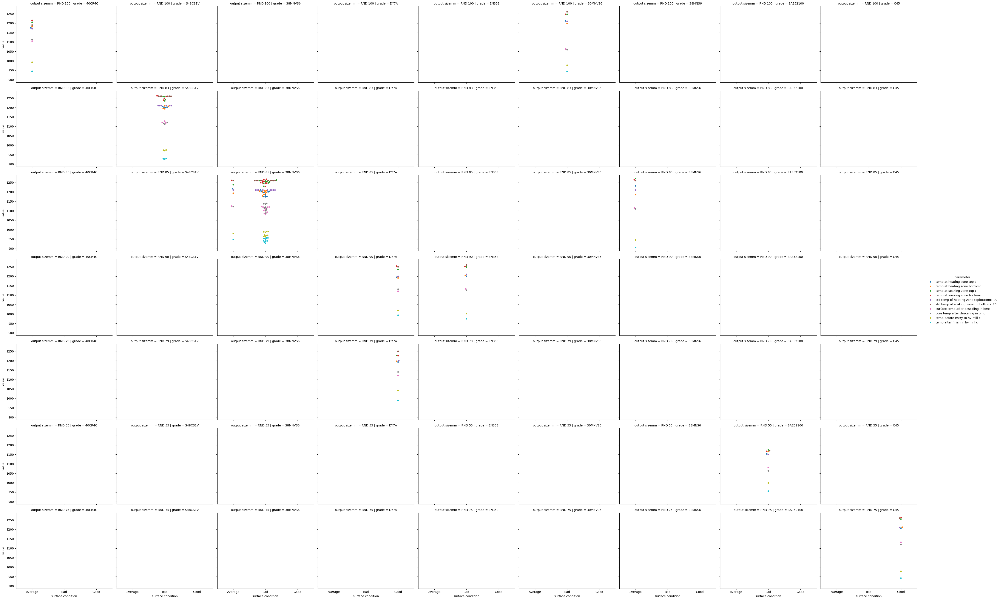

In [84]:
g = sns.catplot(
    data=long_temp_std,
    x='surface condition',
    y='value',
    hue='parameter',
    col='grade',
    row='output sizemm',
    kind='swarm',   # better than strip
    height=4,
    aspect=1.2
)

plt.show()

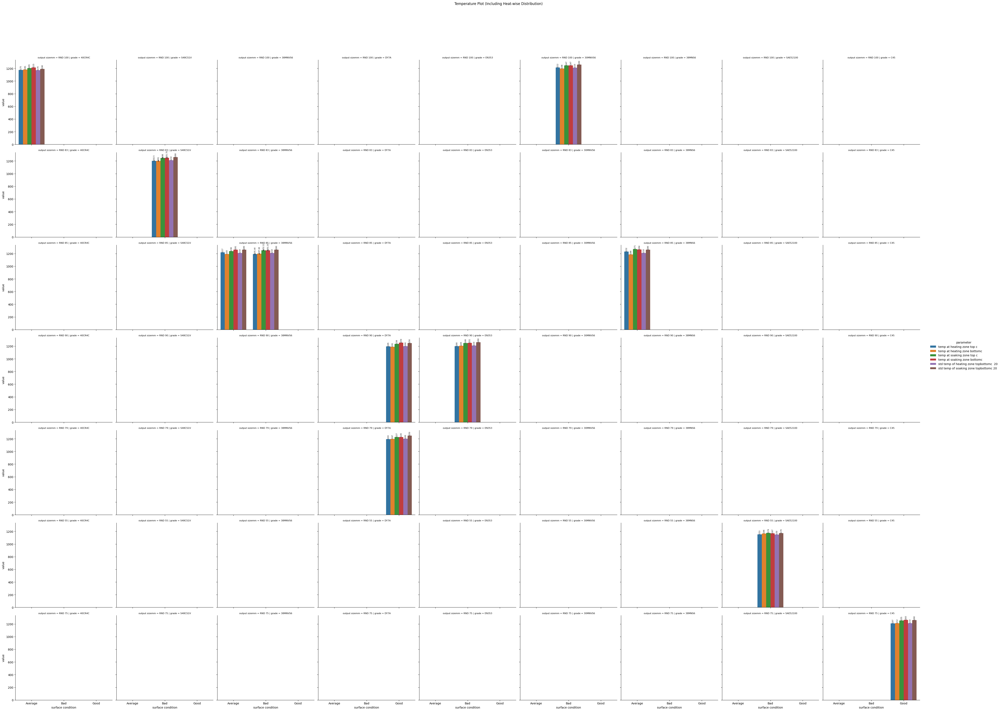

In [85]:
import seaborn as sns
import matplotlib.pyplot as plt

temp_std_cols = [
    'temp at heating zone top c',
    'temp at heating zone bottomc',
    'temp at soaking zone top c',
    'temp at soaking zone bottomc',
    'std temp of heating zone topbottomc  20',
    'std temp of soaking zone topbottomc 20'
]

#  include heat no
long_temp_std = df_process_quality.melt(
    id_vars=['heat no','grade', 'surface condition', 'output sizemm'],
    value_vars=temp_std_cols,
    var_name='parameter',
    value_name='value'
)

#  SAME BAR PLOT BUT ADD HEAT NO
g = sns.catplot(
    data=long_temp_std,
    x='surface condition',
    y='value',
    hue='parameter',
    col='grade',
    row='output sizemm',
    kind='bar'
)

#  Add heat no in title of each subplot
for ax in g.axes.flat:
    ax.set_title(ax.get_title(), fontsize=8)

# Add values
for ax in g.axes.flat:
    for container in ax.containers:
        ax.bar_label(container, fontsize=6, rotation=90)

plt.subplots_adjust(top=0.9)
g.fig.suptitle("Temperature Plot (Including Heat-wise Distribution)")

plt.show()

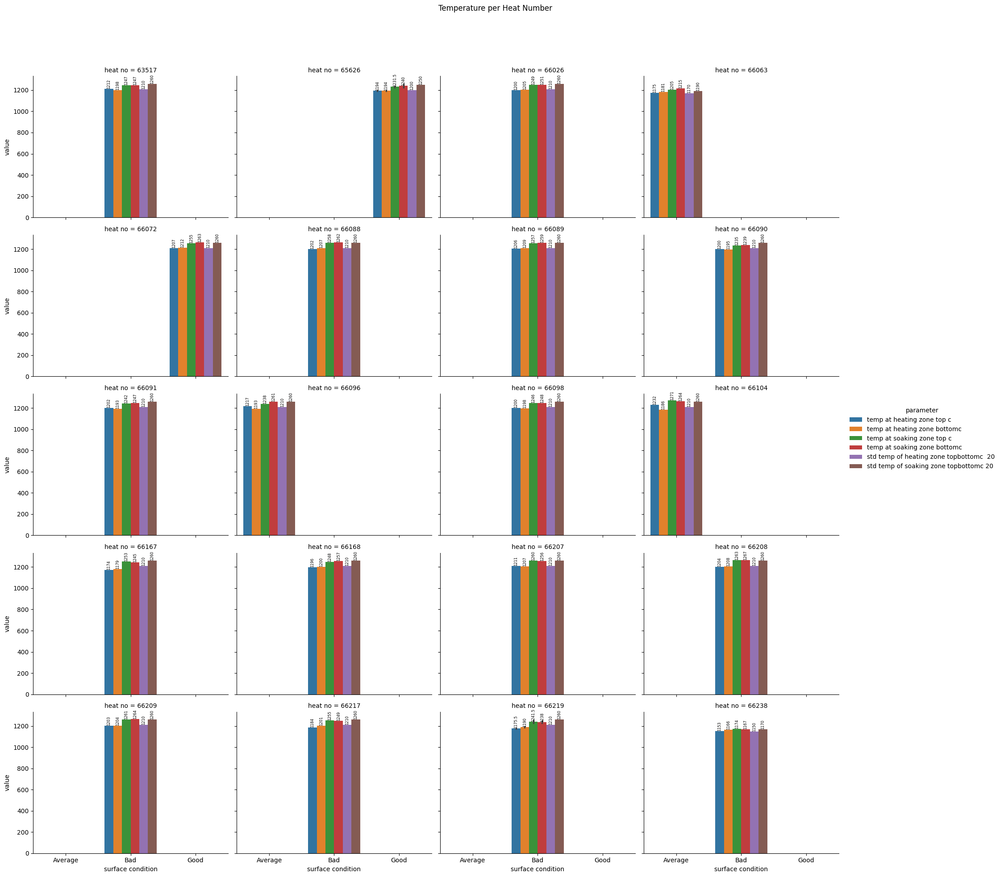

In [86]:
g = sns.catplot(
    data=long_temp_std,
    x='surface condition',
    y='value',
    hue='parameter',
    col='heat no',      #  EACH HEAT SEPARATE
    col_wrap=4,         # adjust layout
    kind='bar',
    height=4,
    aspect=1.2
)

for ax in g.axes.flat:
    for container in ax.containers:
        ax.bar_label(container, fontsize=6, rotation=90)

plt.subplots_adjust(top=0.9)
g.fig.suptitle("Temperature per Heat Number")

plt.show()

#This analysis compares actual heating and soaking zone temperatures with standard values for each heat number and output size, to identify the root cause of surface defects.
 **1. Temperature deviation causes defects**

  * In cases where surface condition is Bad, the actual temperatures significantly deviate from standard values.

       Example:
     Overheating → scale formation
     
     Underheating → improper deformation
**2. Consistency = Good surface**

Good surface condition is observed when actual temperatures are close to standard values across all zones.

Meaning:

* Process is stable
* Uniform heating

**3. Heat-wise variation matters**

Even within the same grade, different heat numbers show different behavior.

Insight:

Raw material / furnace variation
Not just grade → process inconsistency

**4. Output size impact**

Different output sizes for the same heat show variation in temperature distribution and surface quality.

Meaning:

* Rolling conditions affect final quality

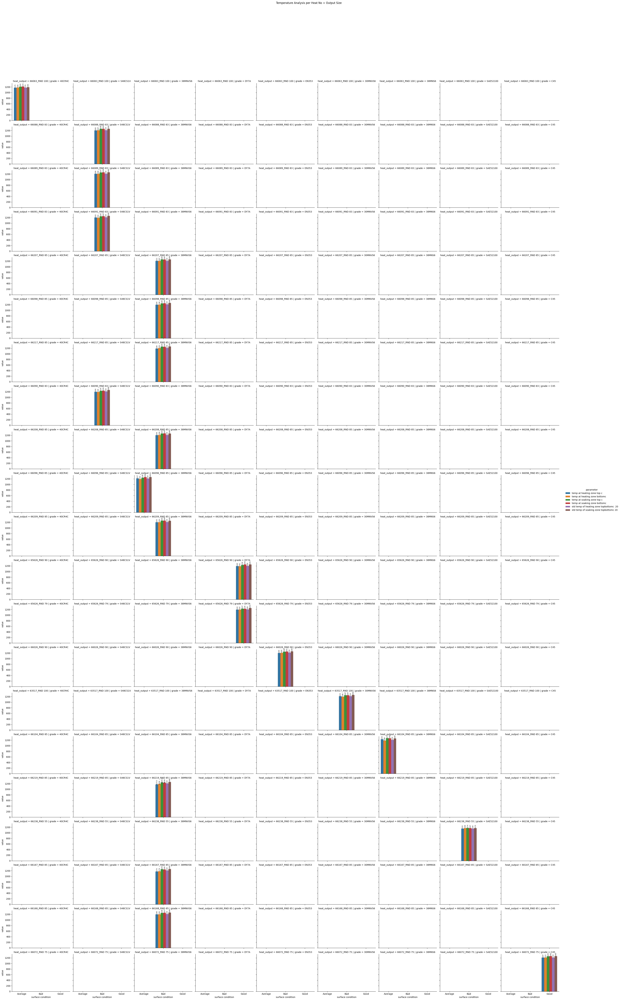

In [87]:
import seaborn as sns
import matplotlib.pyplot as plt

temp_std_cols = [
    'temp at heating zone top c',
    'temp at heating zone bottomc',
    'temp at soaking zone top c',
    'temp at soaking zone bottomc',
    'std temp of heating zone topbottomc  20',
    'std temp of soaking zone topbottomc 20'
]

# INCLUDE HEAT NO
long_temp_std = df_process_quality.melt(
    id_vars=['heat no','grade', 'surface condition', 'output sizemm'],
    value_vars=temp_std_cols,
    var_name='parameter',
    value_name='value'
)

#  CREATE COMBINED LABEL (VERY IMPORTANT)
long_temp_std['heat_output'] = (
    long_temp_std['heat no'].astype(str) + "_" + long_temp_std['output sizemm']
)

# SAME BAR PLOT BUT WITH HEAT+OUTPUT
g = sns.catplot(
    data=long_temp_std,
    x='surface condition',
    y='value',
    hue='parameter',
    col='grade',
    row='heat_output',   # each heat+output separate
    kind='bar',
    height=3,
    aspect=1.3
)

# Add values on bars
for ax in g.axes.flat:
    for container in ax.containers:
        ax.bar_label(container, fontsize=6, rotation=90)

plt.subplots_adjust(top=0.9)
g.fig.suptitle("Temperature Analysis per Heat No + Output Size")

plt.show()

In [117]:
# Separate datasets
df_bad = df_process_quality[df_process_quality['surface condition'] == 'Bad']
df_good = df_process_quality[df_process_quality['surface condition'] == 'Good']
df_avg = df_process_quality[df_process_quality['surface condition'] == 'Average']

In [120]:
temp_std_cols = [
    'temp at heating zone top c',
    'temp at heating zone bottomc',
    'temp at soaking zone top c',
    'temp at soaking zone bottomc',
    'std temp of heating zone topbottomc 20',
    'std temp of soaking zone topbottomc 20'
]

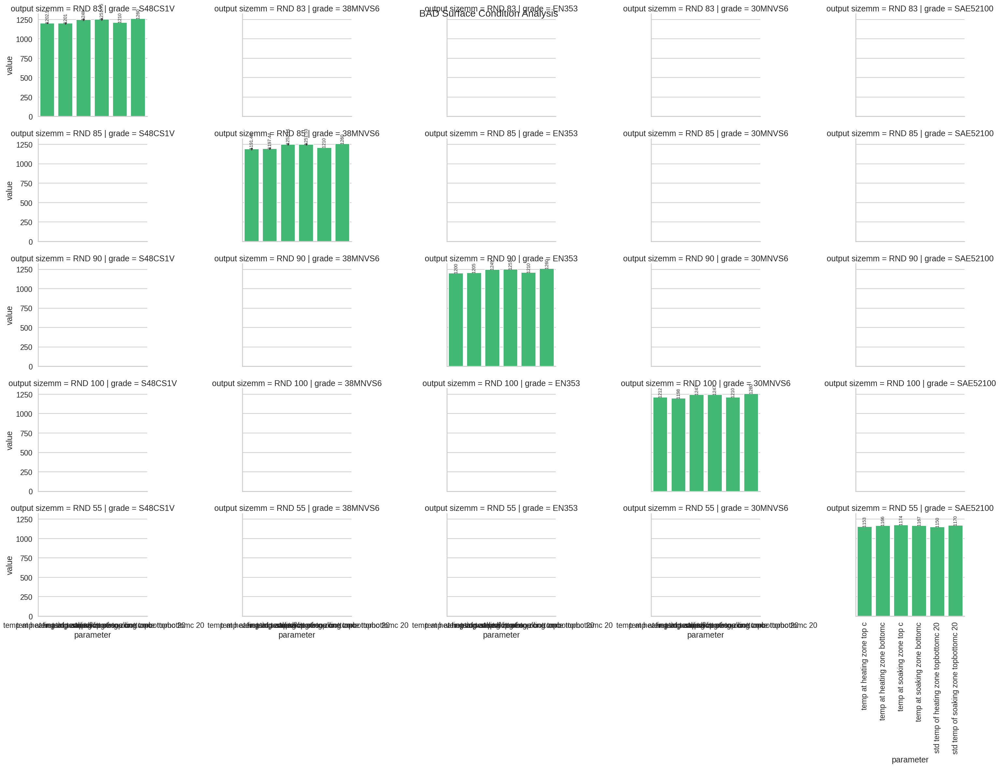

In [123]:
#BAD SURFACE CONDITION
long_bad = df_bad.melt(
    id_vars=['heat no','grade','output sizemm'],
    value_vars=temp_std_cols,
    var_name='parameter',
    value_name='value'
)

g = sns.catplot(
    data=long_bad,
    x='parameter',
    y='value',
    col='grade',
    row='output sizemm',
    kind='bar',
    height=4,
    aspect=1.5
)

for ax in g.axes.flat:
    for container in ax.containers:
        ax.bar_label(container, fontsize=10, rotation=90)

plt.xticks(rotation=90)
g.fig.suptitle("BAD Surface Condition Analysis")
plt.show()

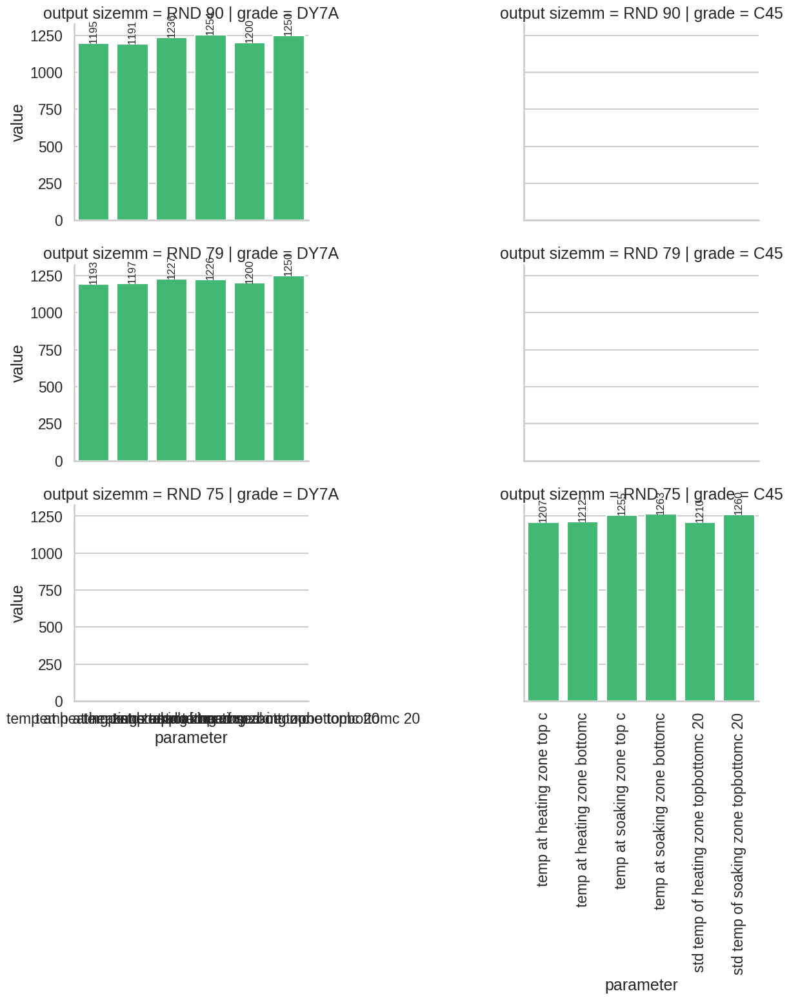

In [126]:
#GOOD Surface Condition
long_good = df_good.melt(
    id_vars=['heat no','grade','output sizemm'],
    value_vars=temp_std_cols,
    var_name='parameter',
    value_name='value'
)

g = sns.catplot(
    data=long_good,
    x='parameter',
    y='value',
    col='grade',
    row='output sizemm',
    kind='bar',
    height=4,
    aspect=1.5
)

for ax in g.axes.flat:
    for container in ax.containers:
        ax.bar_label(container, fontsize=12, rotation=90)

plt.xticks(rotation=90)
#g.fig.suptitle("GOOD Surface Condition Analysis")
plt.show()

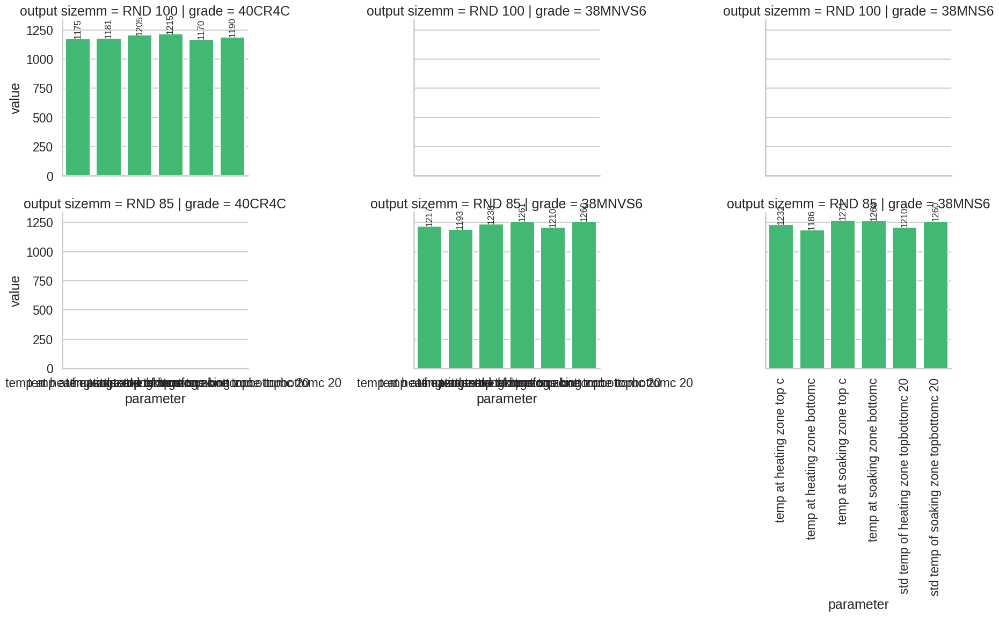

In [132]:
#AVERAGE Surface Condition
long_avg = df_avg.melt(
    id_vars=['heat no','grade','output sizemm'],
    value_vars=temp_std_cols,
    var_name='parameter',
    value_name='value'
)

g = sns.catplot(
    data=long_avg,
    x='parameter',
    y='value',
    col='grade',
    row='output sizemm',
    kind='bar',
    height=4,
    aspect=1.5
)

for ax in g.axes.flat:
    for container in ax.containers:
        ax.bar_label(container, fontsize=12, rotation=90)

plt.xticks(rotation=90)
#g.fig.suptitle("AVERAGE Surface Condition Analysis")
#plt.tight_layout()
plt.show()

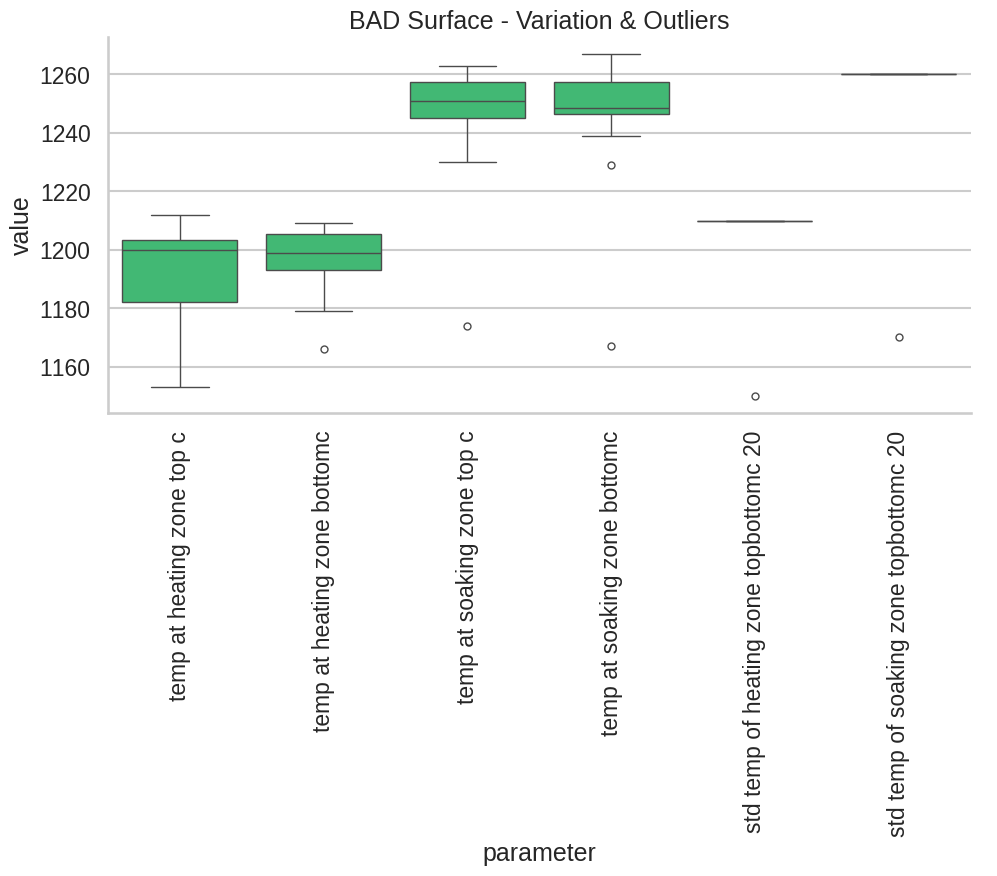

In [130]:
#bad
sns.catplot(
    data=long_bad,
    x='parameter',
    y='value',
    kind='box',
    height=5,
    aspect=2
)

plt.xticks(rotation=90)
plt.title("BAD Surface - Variation & Outliers")
plt.show()

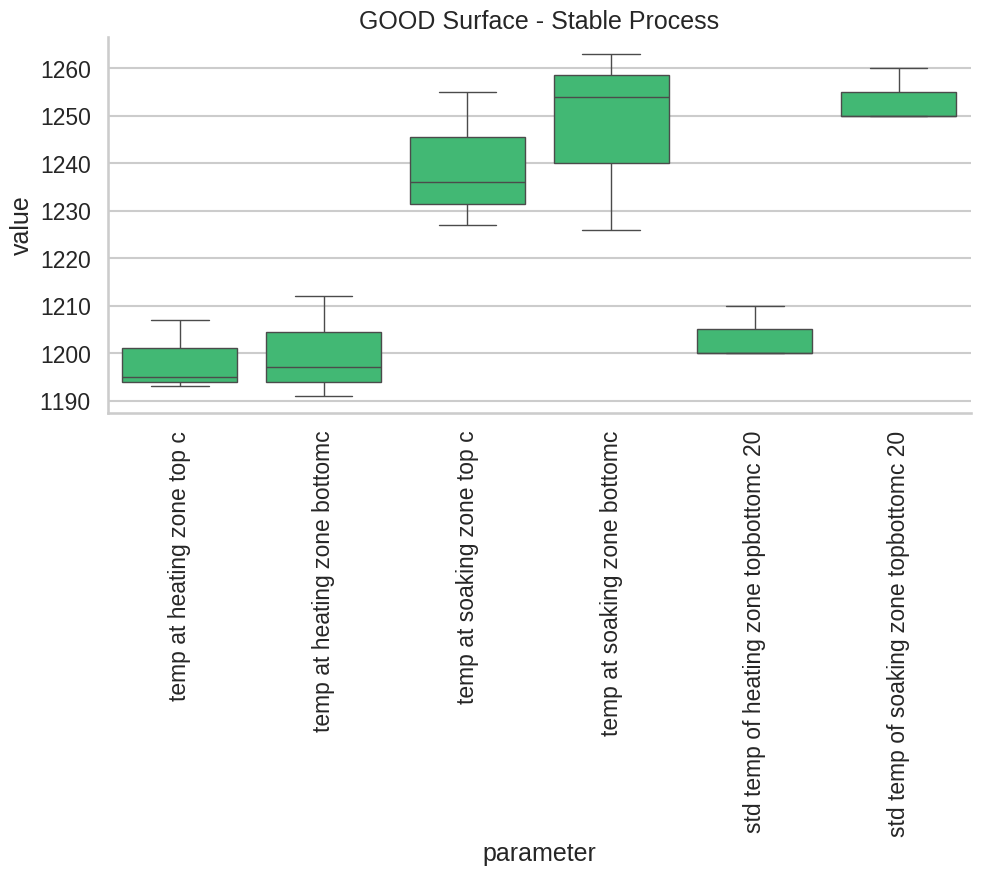

In [134]:
sns.catplot(
    data=long_good,
    x='parameter',
    y='value',
    kind='box',
    height=5,
    aspect=2
)

plt.xticks(rotation=90)
plt.title("GOOD Surface - Stable Process")
plt.show()

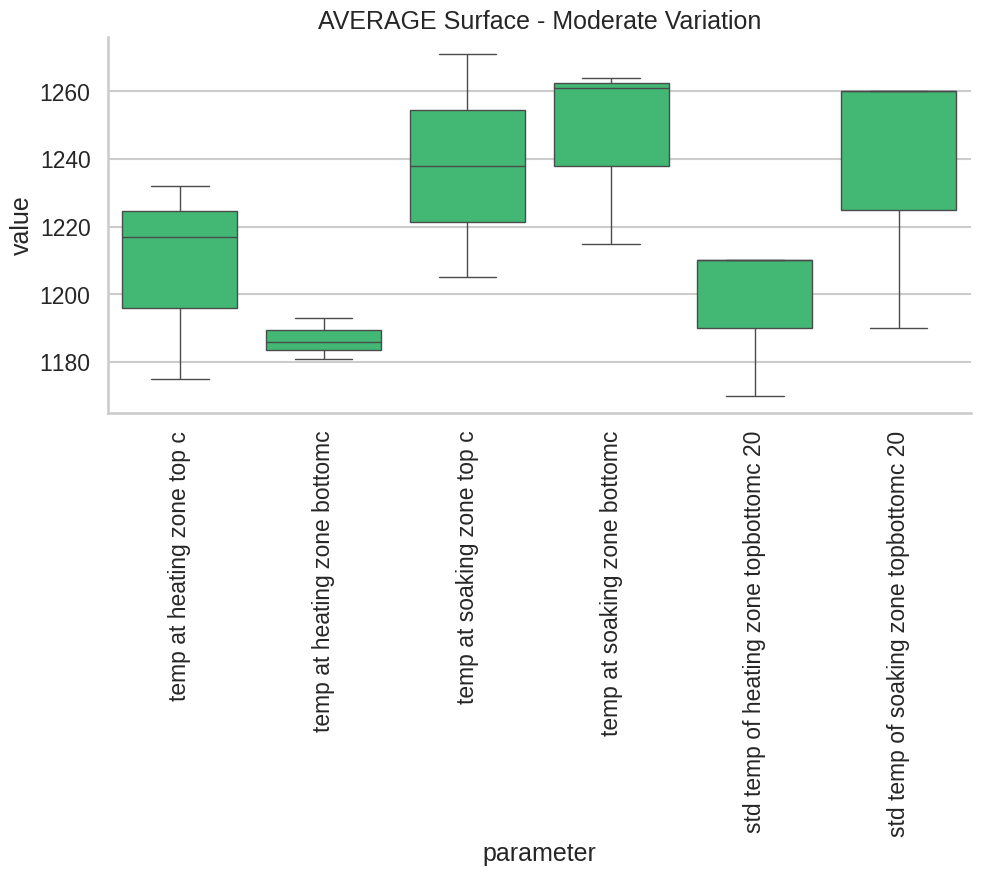

In [135]:
sns.catplot(
    data=long_avg,
    x='parameter',
    y='value',
    kind='box',
    height=5,
    aspect=2
)

plt.xticks(rotation=90)
plt.title("AVERAGE Surface - Moderate Variation")
plt.show()

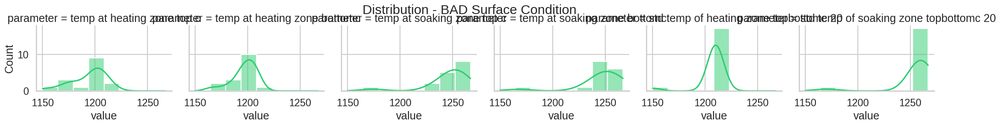

In [136]:
sns.displot(
    data=long_bad,
    x='value',
    col='parameter',
    kde=True,
    height=3,
    aspect=1.2
)

plt.suptitle("Distribution - BAD Surface Condition")
plt.show()

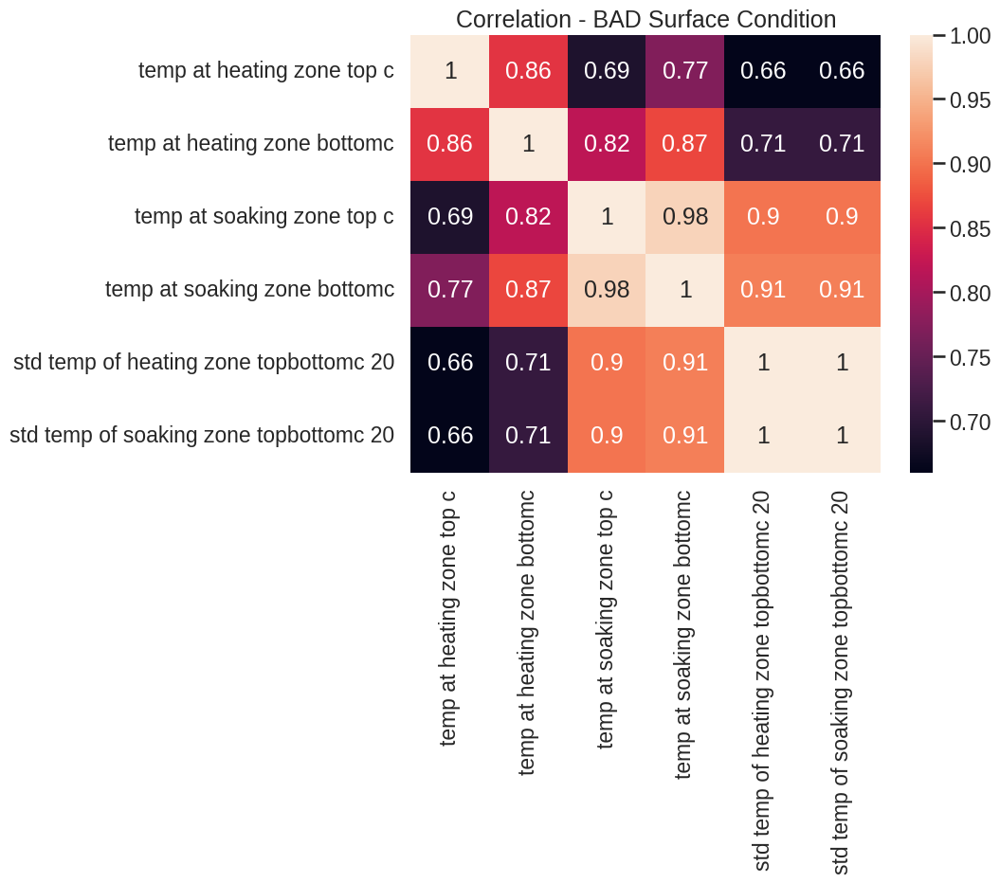

In [137]:
pivot_bad = df_bad[temp_std_cols].corr()

plt.figure(figsize=(8,6))
sns.heatmap(pivot_bad, annot=True)
plt.title("Correlation - BAD Surface Condition")
plt.show()


📊 Plotting for Heat No: 66063


/tmp/ipykernel_17935/3627052054.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


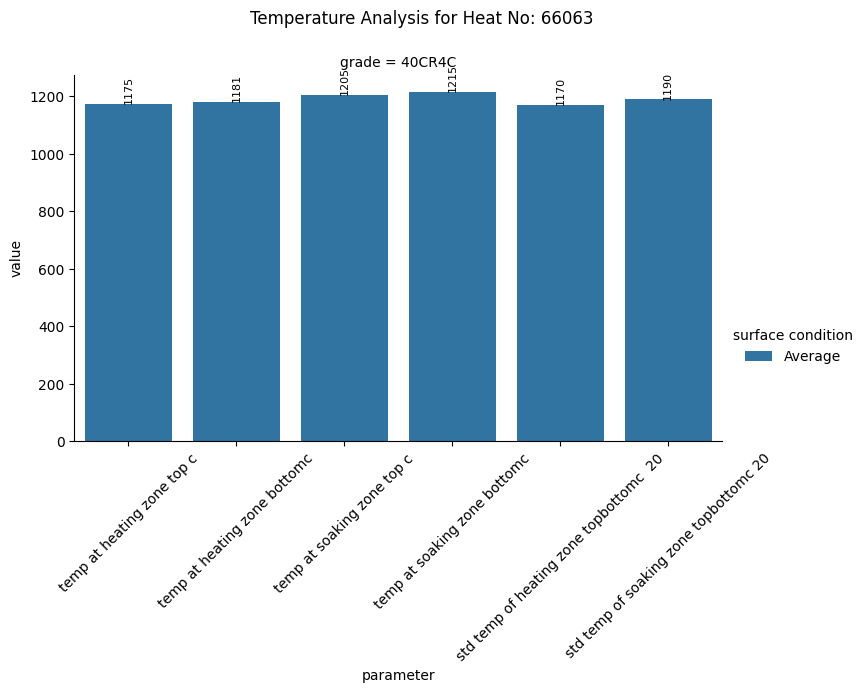


📊 Plotting for Heat No: 66088


/tmp/ipykernel_17935/3627052054.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


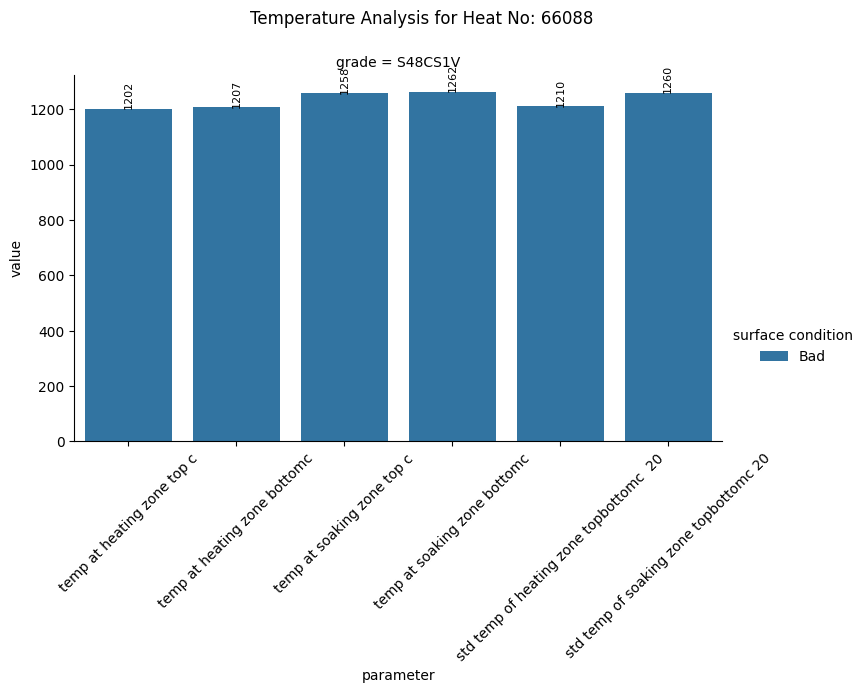


📊 Plotting for Heat No: 66089


/tmp/ipykernel_17935/3627052054.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


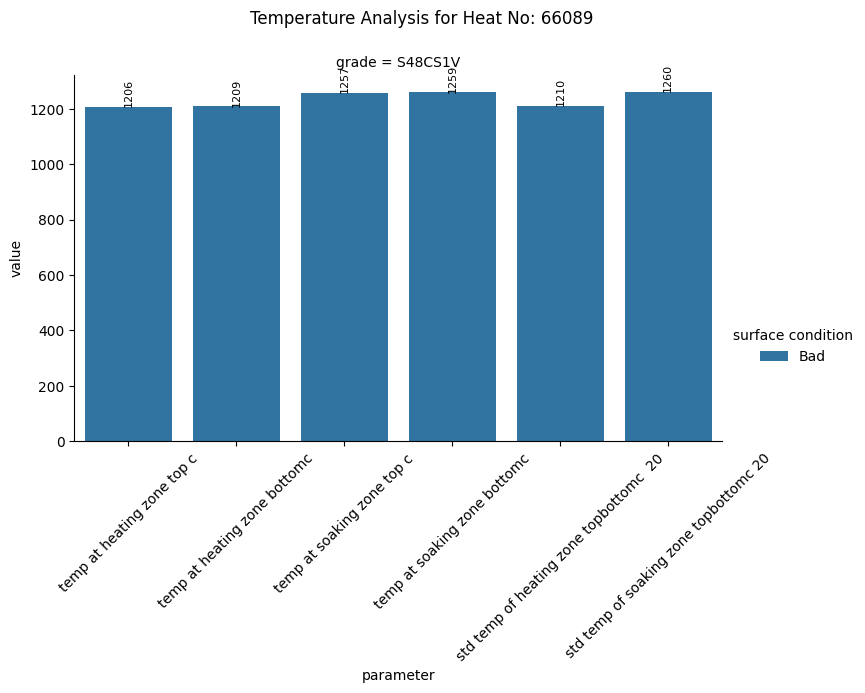


📊 Plotting for Heat No: 66091


/tmp/ipykernel_17935/3627052054.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


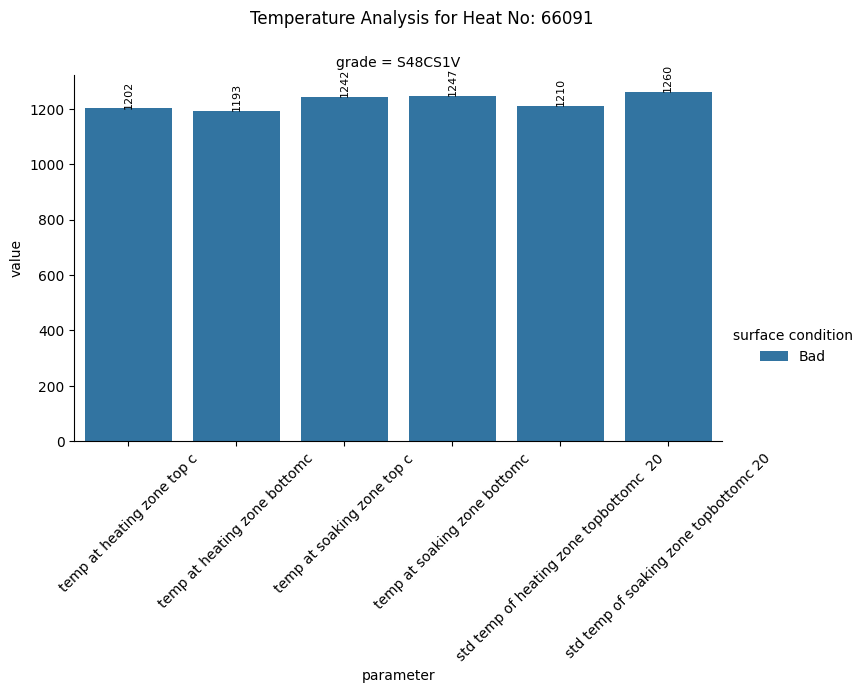


📊 Plotting for Heat No: 66207


/tmp/ipykernel_17935/3627052054.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


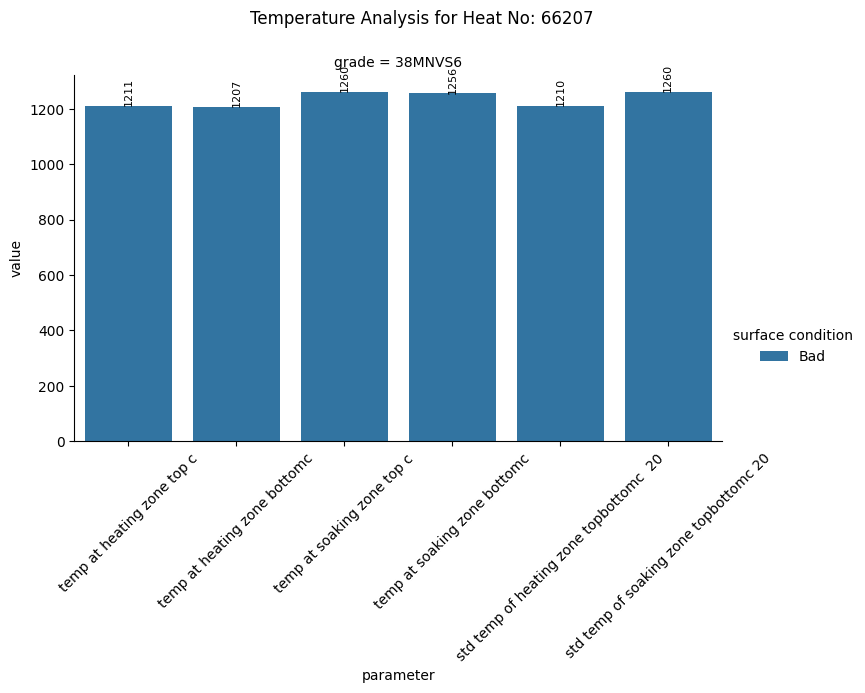


📊 Plotting for Heat No: 66098


/tmp/ipykernel_17935/3627052054.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


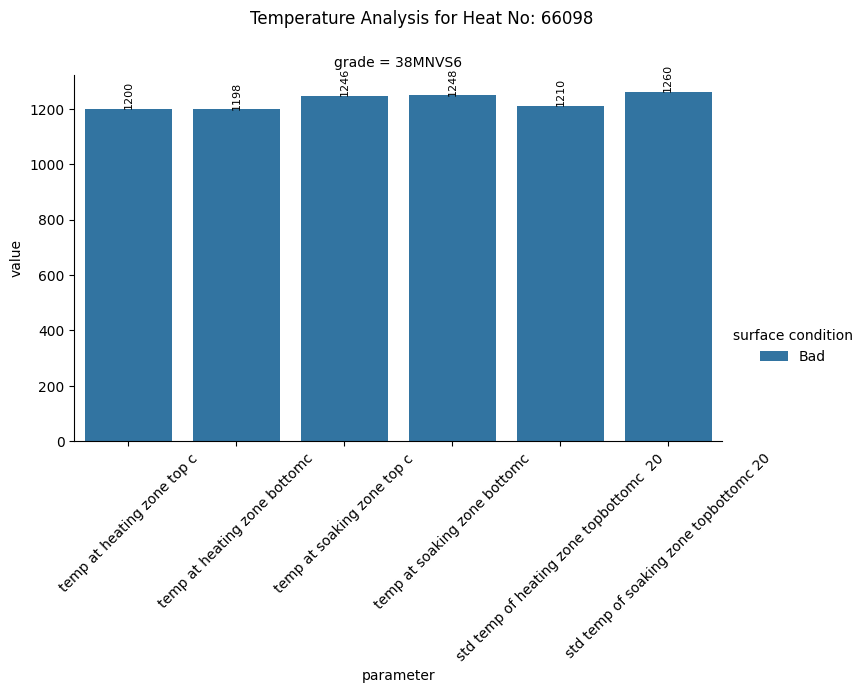


📊 Plotting for Heat No: 66217


/tmp/ipykernel_17935/3627052054.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


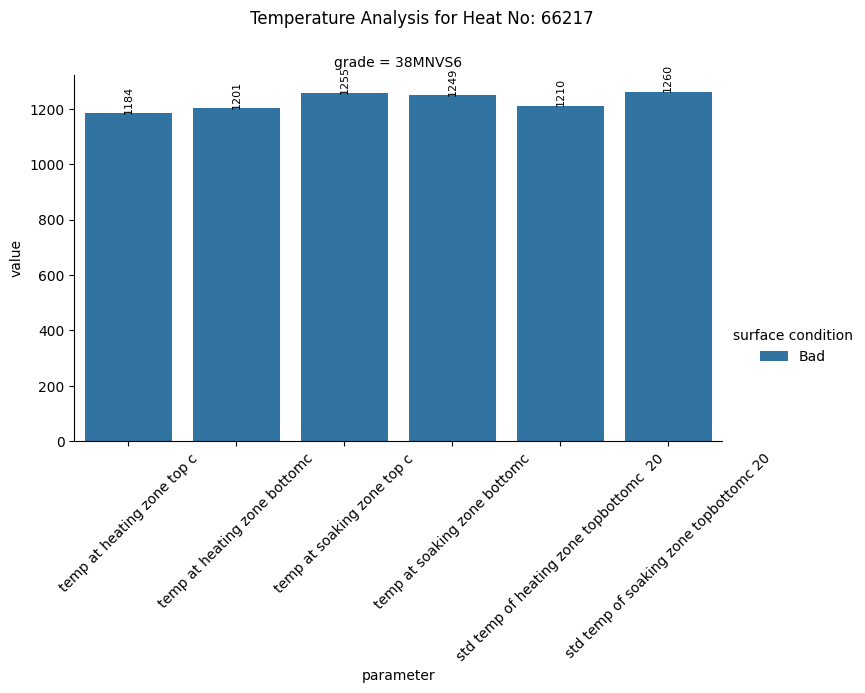


📊 Plotting for Heat No: 66090


/tmp/ipykernel_17935/3627052054.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


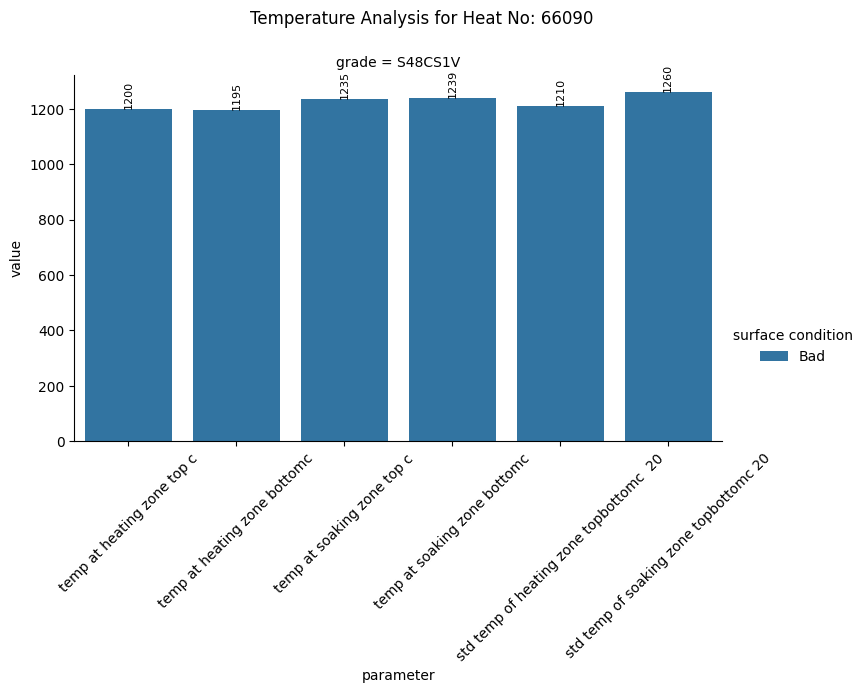


📊 Plotting for Heat No: 66208


/tmp/ipykernel_17935/3627052054.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


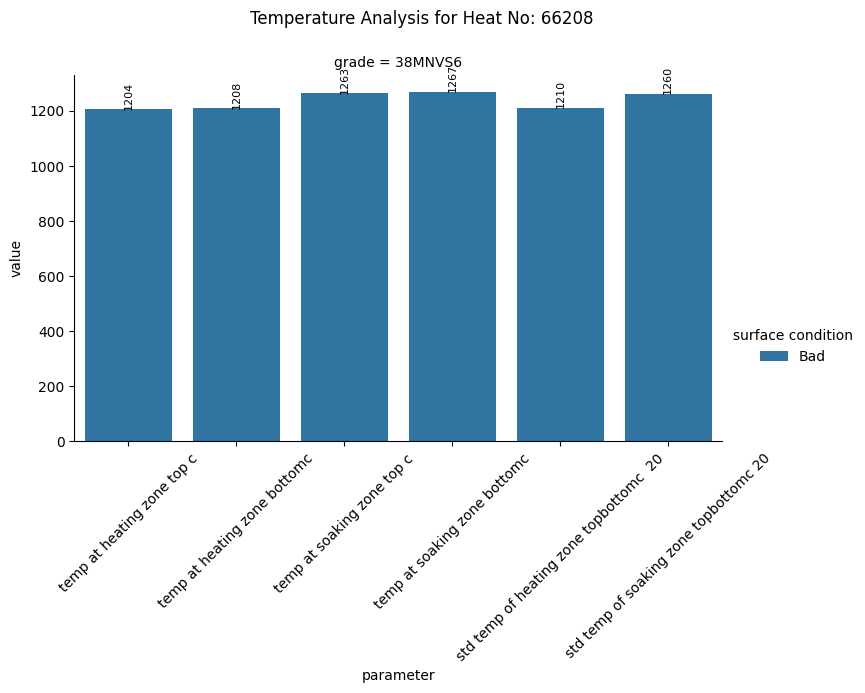


📊 Plotting for Heat No: 66096


/tmp/ipykernel_17935/3627052054.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


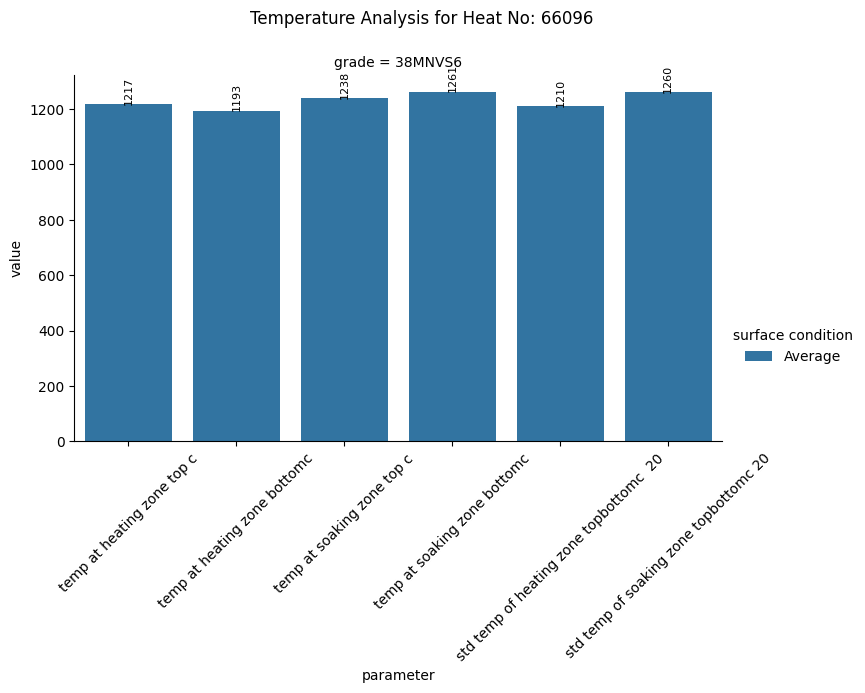


📊 Plotting for Heat No: 66209


/tmp/ipykernel_17935/3627052054.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


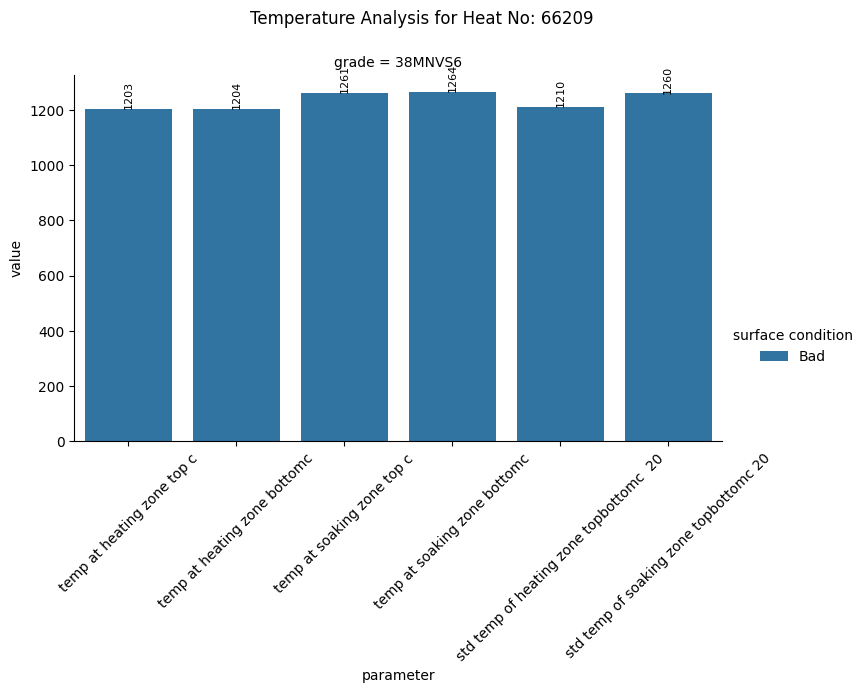


📊 Plotting for Heat No: 65626


/tmp/ipykernel_17935/3627052054.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


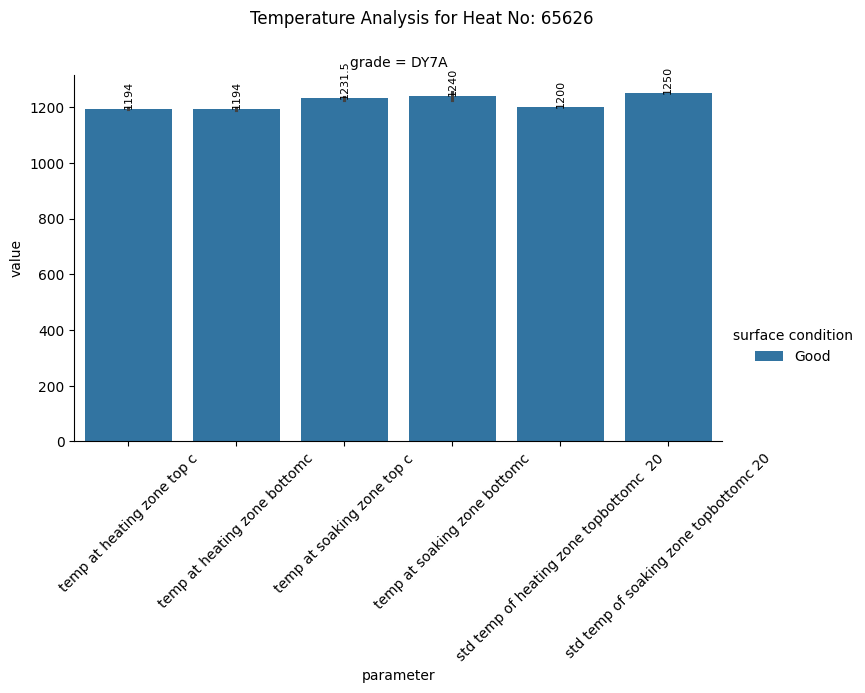


📊 Plotting for Heat No: 66026


/tmp/ipykernel_17935/3627052054.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


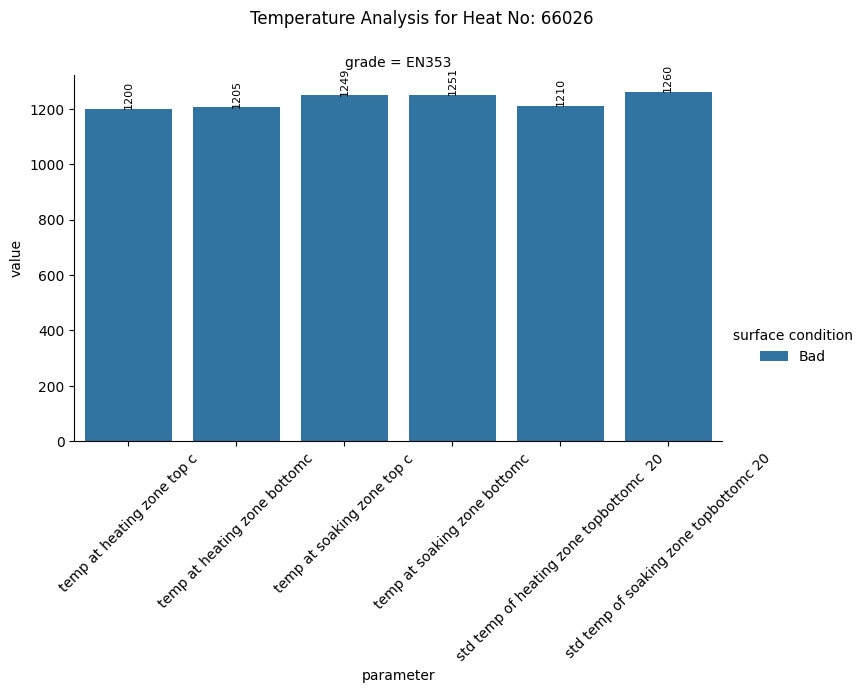


📊 Plotting for Heat No: 63517


/tmp/ipykernel_17935/3627052054.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


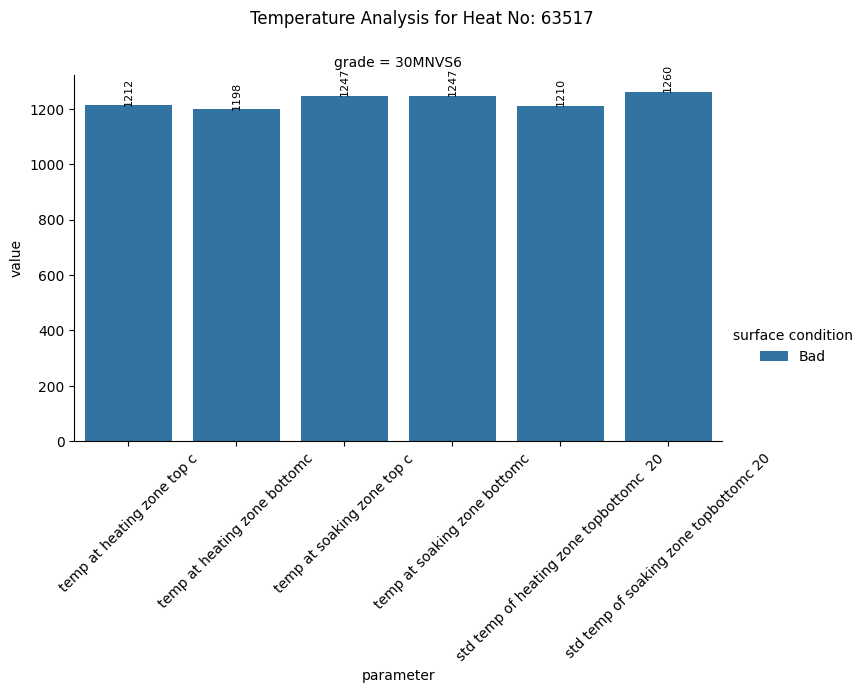


📊 Plotting for Heat No: 66104


/tmp/ipykernel_17935/3627052054.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


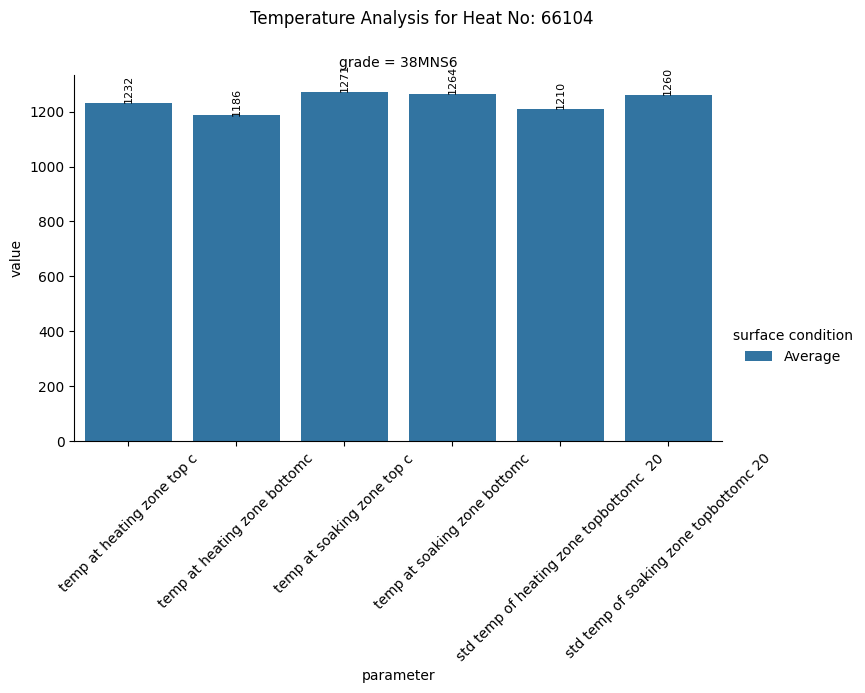


📊 Plotting for Heat No: 66219


/tmp/ipykernel_17935/3627052054.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


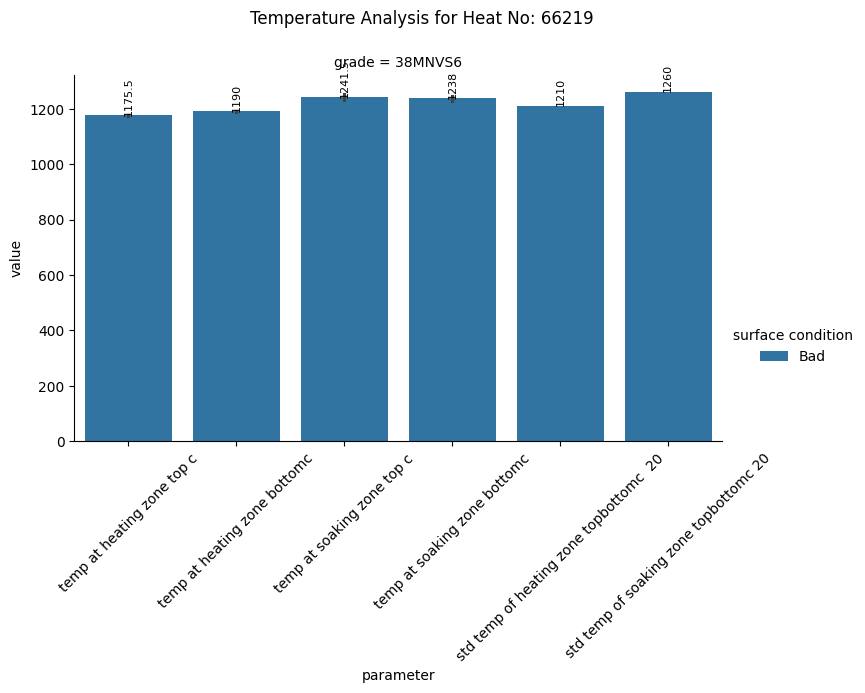


📊 Plotting for Heat No: 66238


/tmp/ipykernel_17935/3627052054.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


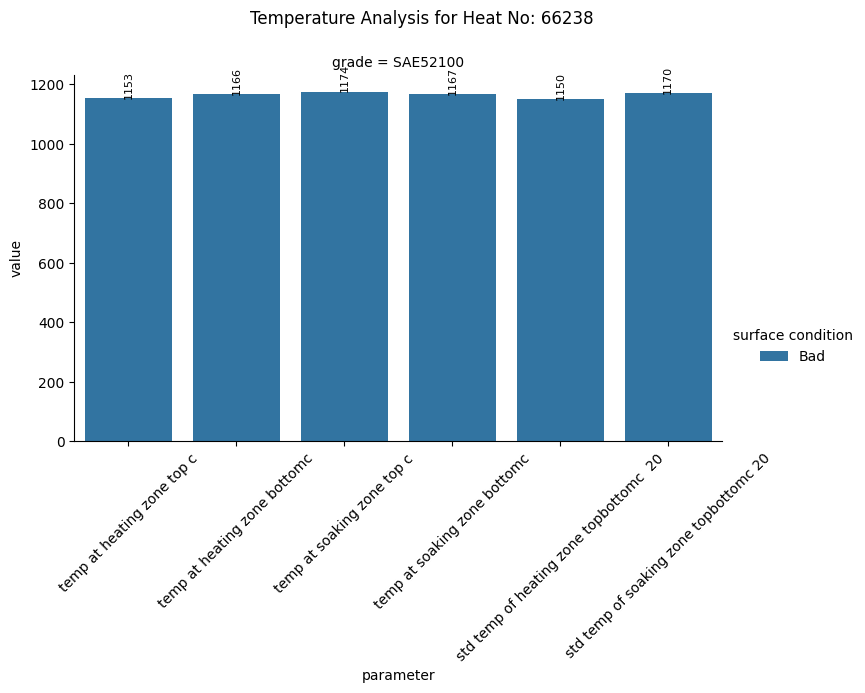


📊 Plotting for Heat No: 66167


/tmp/ipykernel_17935/3627052054.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


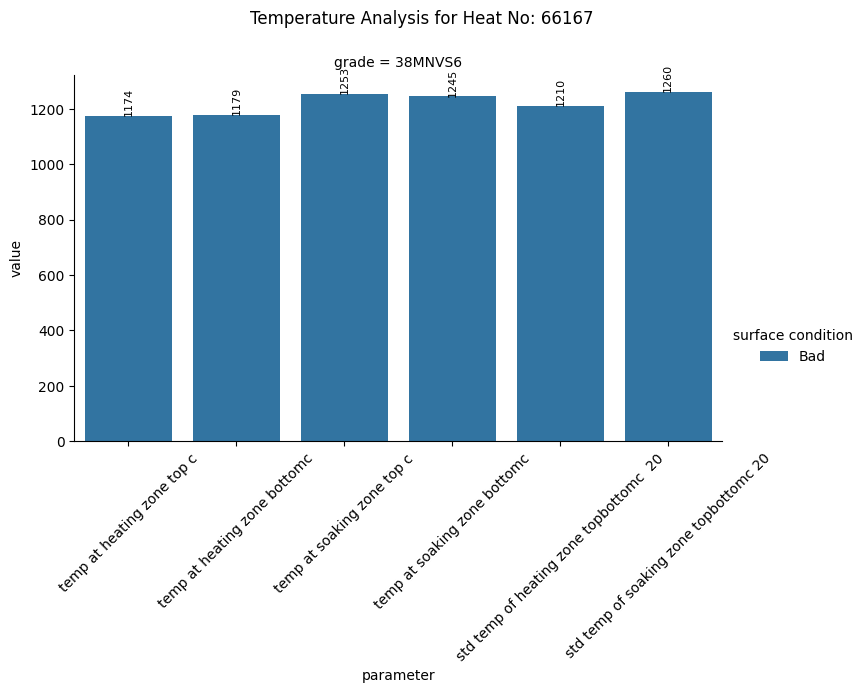


📊 Plotting for Heat No: 66168


/tmp/ipykernel_17935/3627052054.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


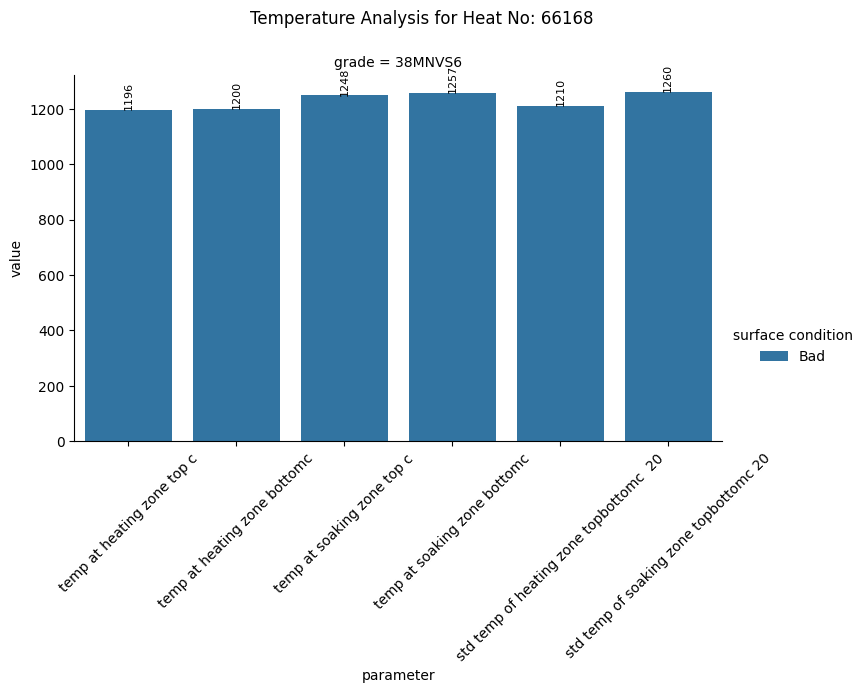


📊 Plotting for Heat No: 66072


/tmp/ipykernel_17935/3627052054.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


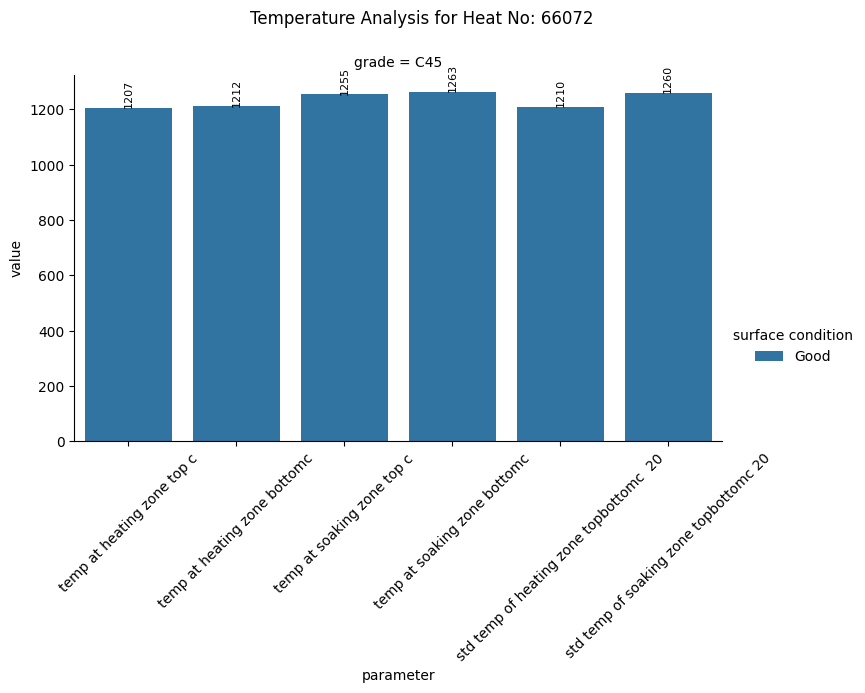

In [88]:
import seaborn as sns
import matplotlib.pyplot as plt

# Temperature + Standard columns
temp_std_cols = [
    'temp at heating zone top c',
    'temp at heating zone bottomc',
    'temp at soaking zone top c',
    'temp at soaking zone bottomc',
    'std temp of heating zone topbottomc  20',
    'std temp of soaking zone topbottomc 20'
]

# Loop through each heat number
for heat in df_process_quality['heat no'].unique():

    #  Filter data for that heat
    df_heat = df_process_quality[
        df_process_quality['heat no'] == heat
    ]

    print(f"\n📊 Plotting for Heat No: {heat}")

    #  Convert to long format
    long_temp_std = df_heat.melt(
        id_vars=['heat no', 'grade', 'surface condition', 'output sizemm'],
        value_vars=temp_std_cols,
        var_name='parameter',
        value_name='value'
    )

    #  Create plot
    g = sns.catplot(
        data=long_temp_std,
        x='parameter',
        y='value',
        hue='surface condition',
        col='grade',
        kind='bar',
        height=5,
        aspect=1.5
    )

    #  Add values on bars
    for ax in g.axes.flat:
        for container in ax.containers:
            ax.bar_label(container, fontsize=8, rotation=90)

    #  Improve readability
    for ax in g.axes.flat:
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

    plt.subplots_adjust(top=0.85)
    g.fig.suptitle(f"Temperature Analysis for Heat No: {heat}")

    plt.show()


📊 Heat No: 66063 | Surface: Average


/tmp/ipykernel_17935/1380744549.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


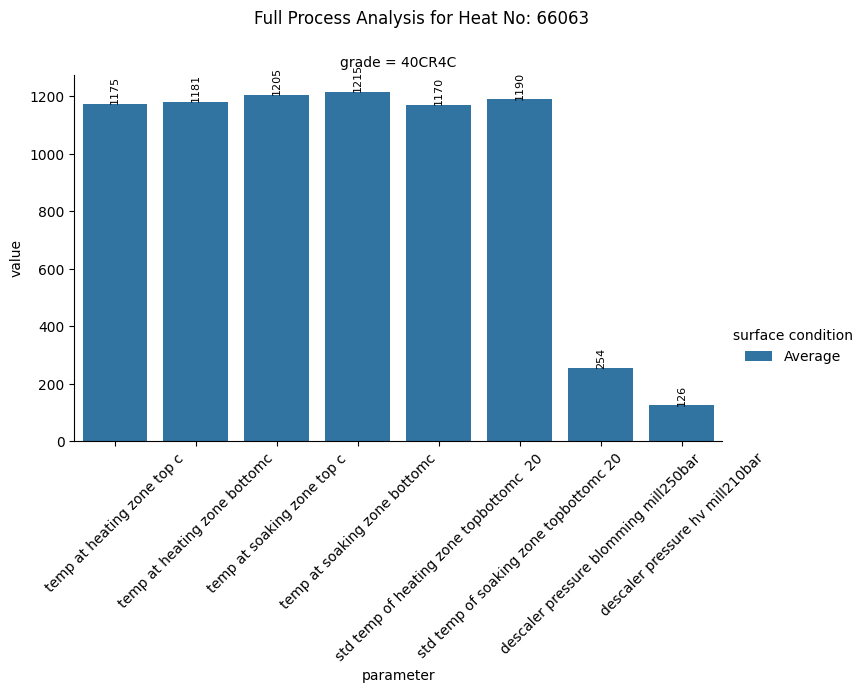


📊 Heat No: 66088 | Surface: Bad


/tmp/ipykernel_17935/1380744549.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


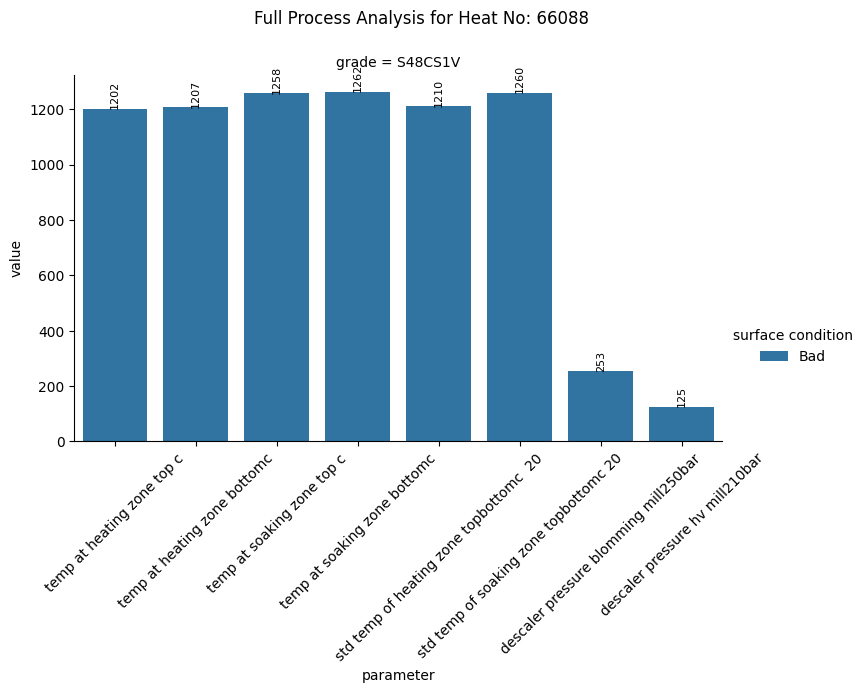


📊 Heat No: 66089 | Surface: Bad


/tmp/ipykernel_17935/1380744549.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


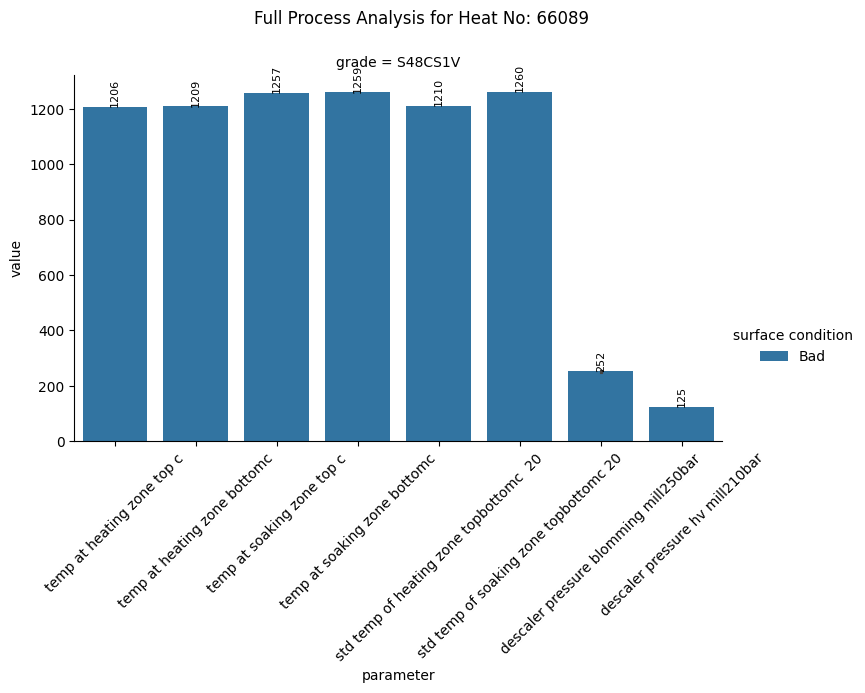


📊 Heat No: 66091 | Surface: Bad


/tmp/ipykernel_17935/1380744549.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


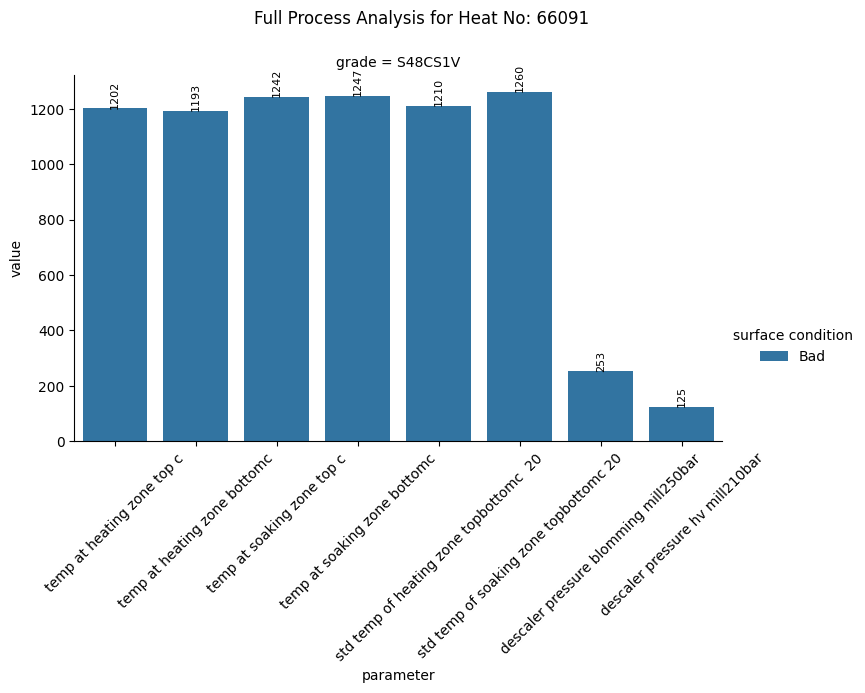


📊 Heat No: 66207 | Surface: Bad


/tmp/ipykernel_17935/1380744549.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


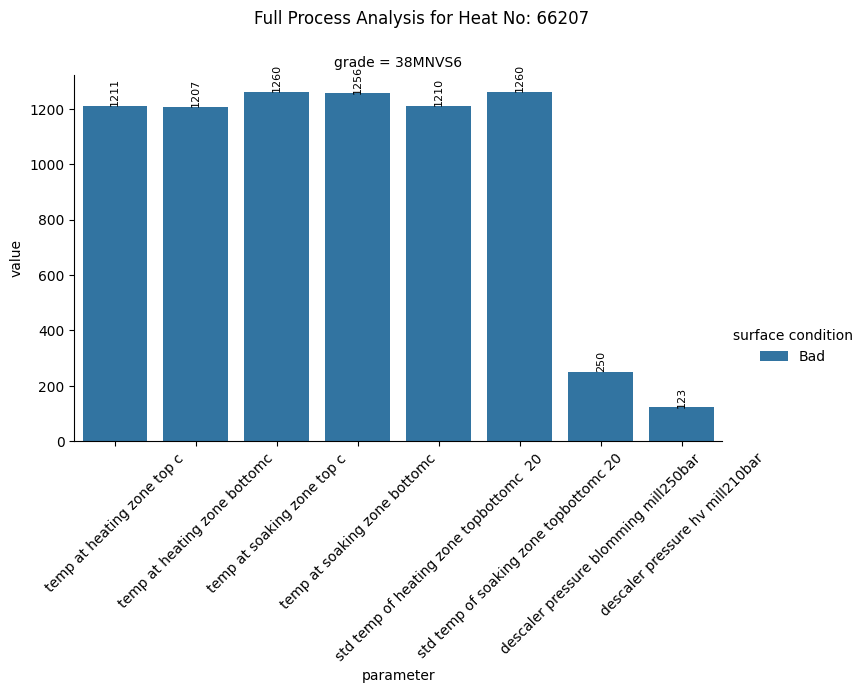


📊 Heat No: 66098 | Surface: Bad


/tmp/ipykernel_17935/1380744549.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


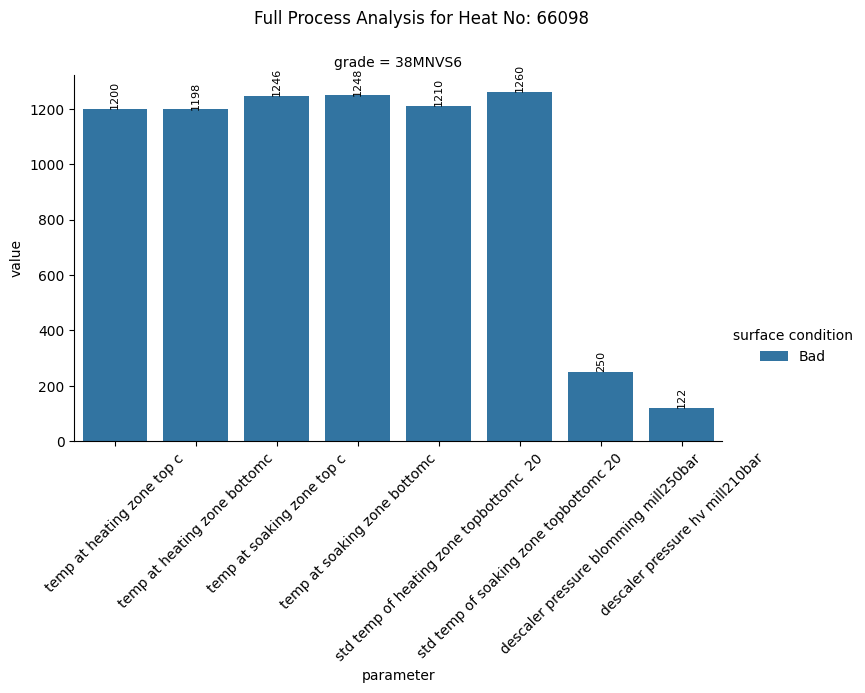


📊 Heat No: 66217 | Surface: Bad


/tmp/ipykernel_17935/1380744549.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


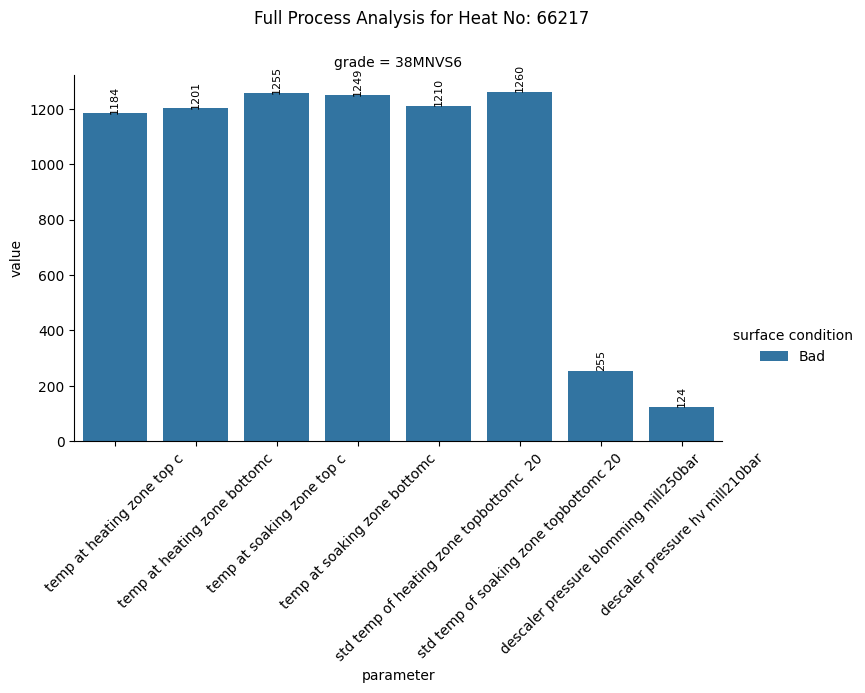


📊 Heat No: 66090 | Surface: Bad


/tmp/ipykernel_17935/1380744549.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


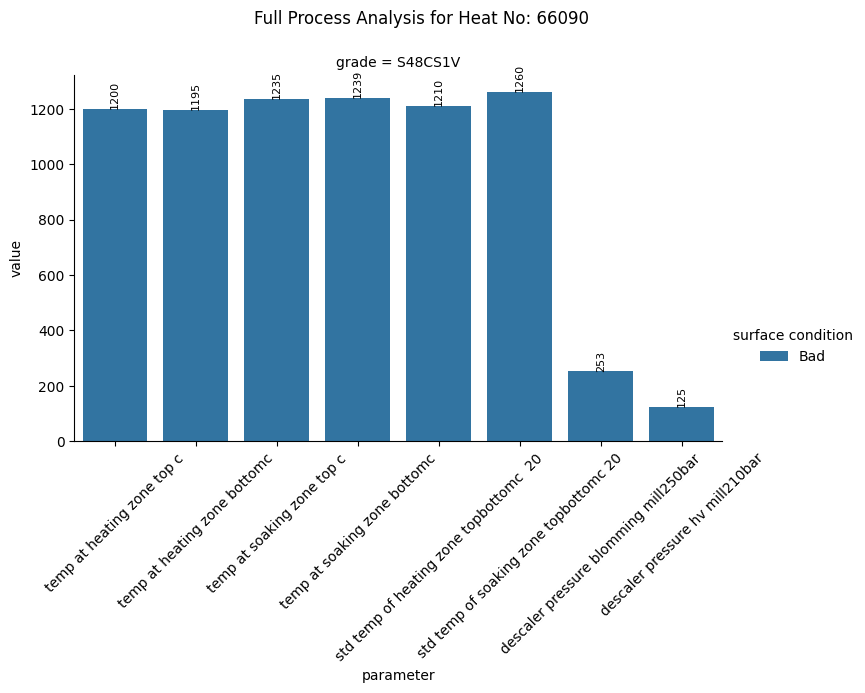


📊 Heat No: 66208 | Surface: Bad


/tmp/ipykernel_17935/1380744549.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


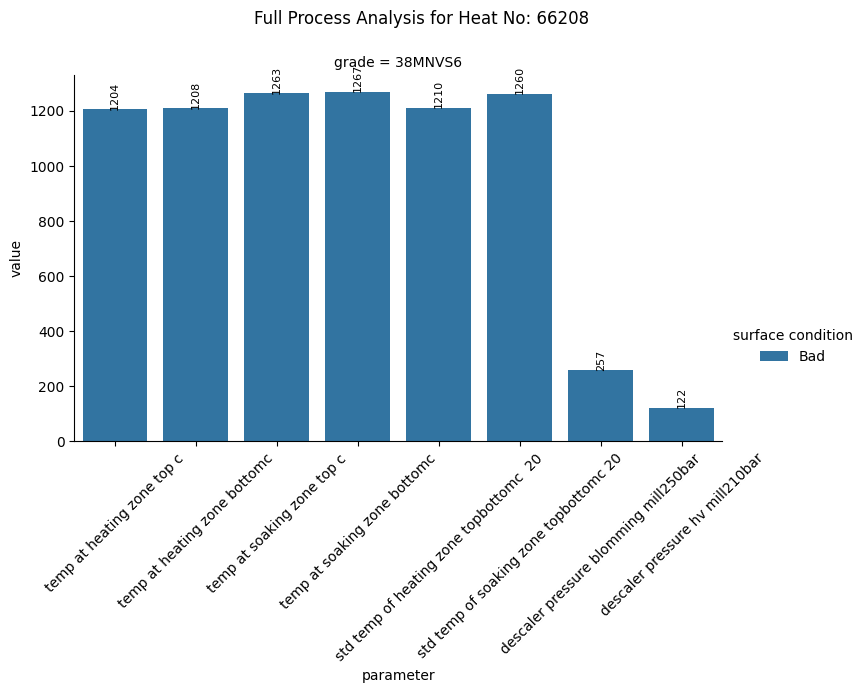


📊 Heat No: 66096 | Surface: Average


/tmp/ipykernel_17935/1380744549.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


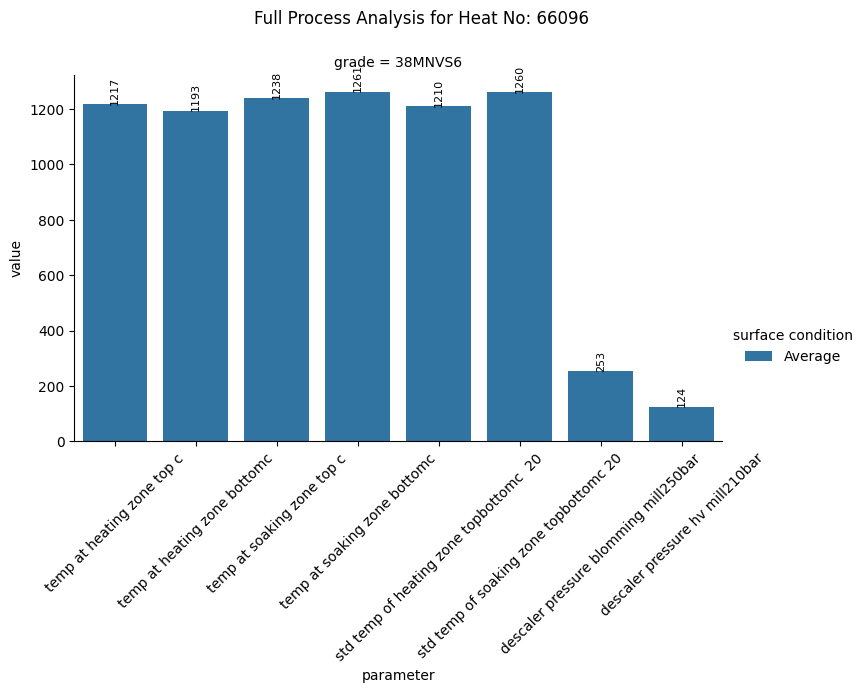


📊 Heat No: 66209 | Surface: Bad


/tmp/ipykernel_17935/1380744549.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


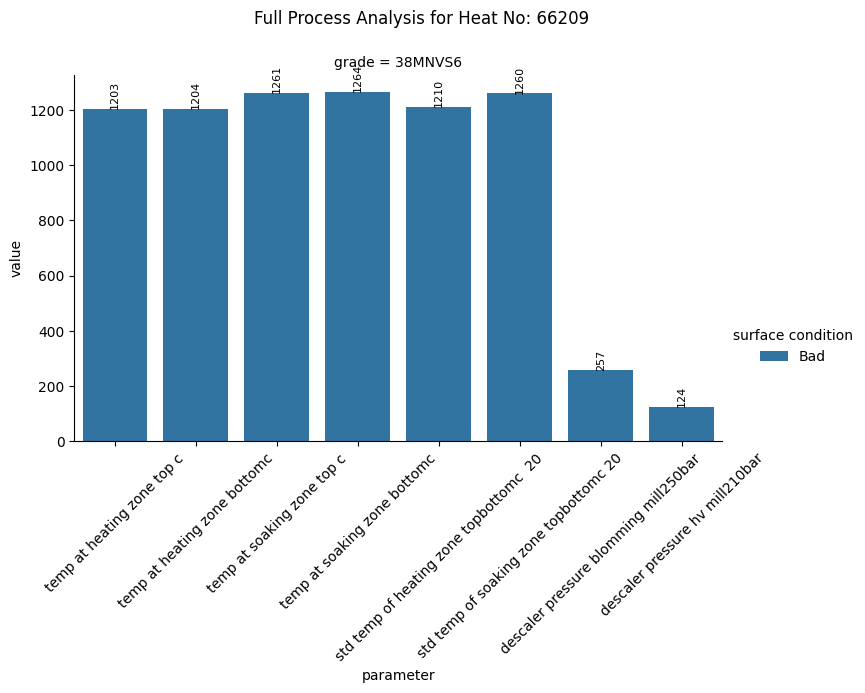


📊 Heat No: 65626 | Surface: Good


/tmp/ipykernel_17935/1380744549.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


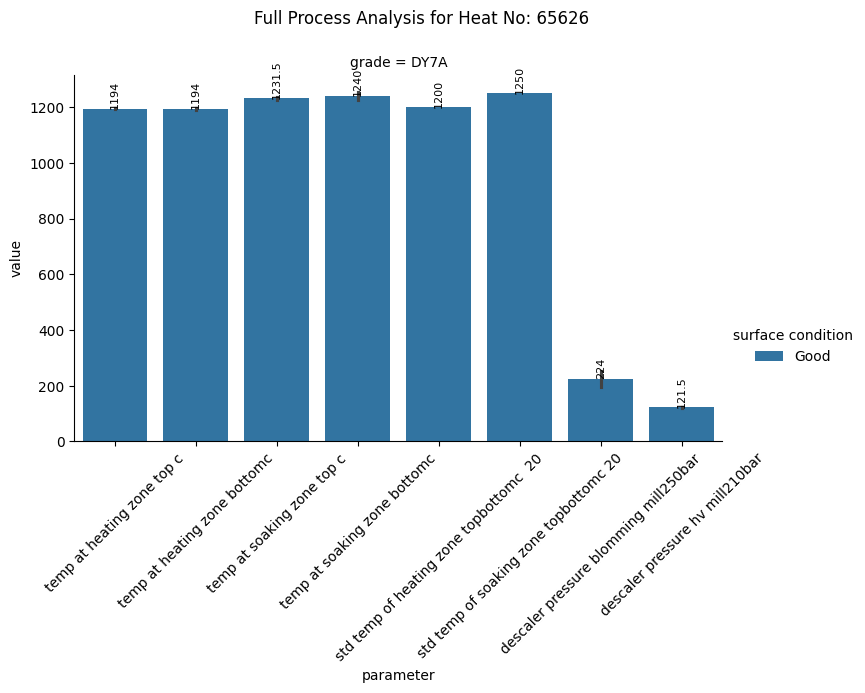


📊 Heat No: 66026 | Surface: Bad


/tmp/ipykernel_17935/1380744549.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


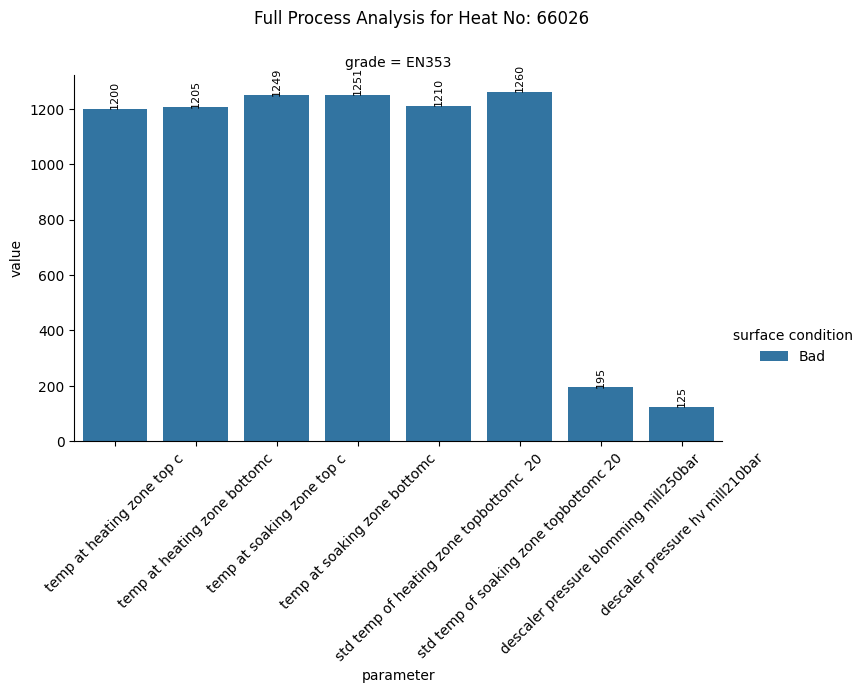


📊 Heat No: 63517 | Surface: Bad


/tmp/ipykernel_17935/1380744549.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


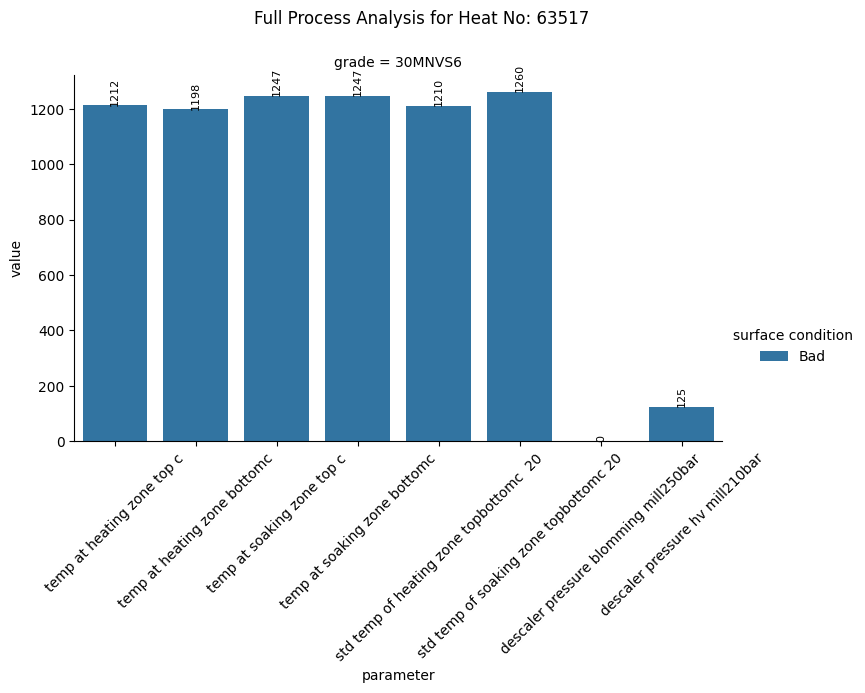


📊 Heat No: 66104 | Surface: Average


/tmp/ipykernel_17935/1380744549.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


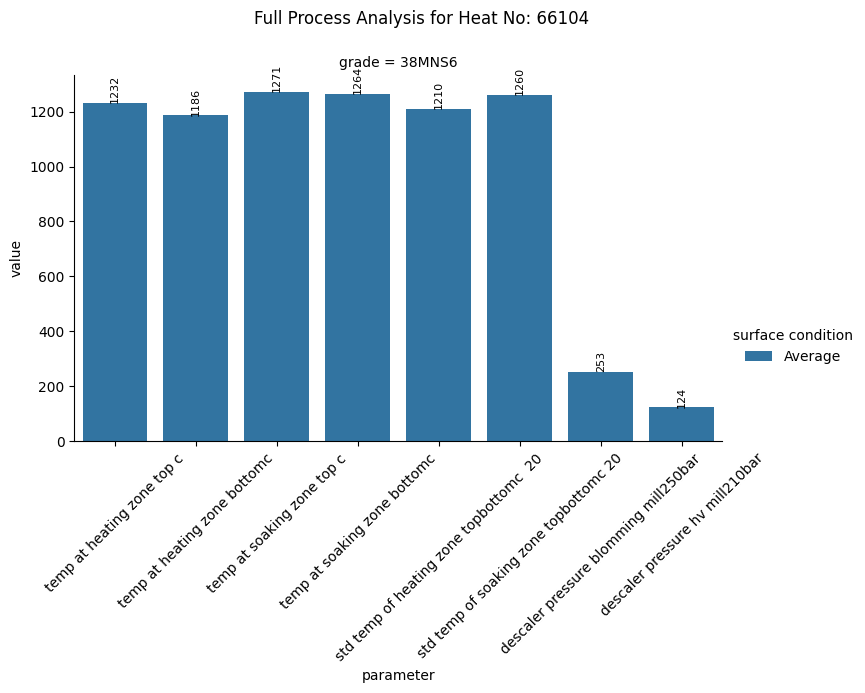


📊 Heat No: 66219 | Surface: Bad


/tmp/ipykernel_17935/1380744549.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


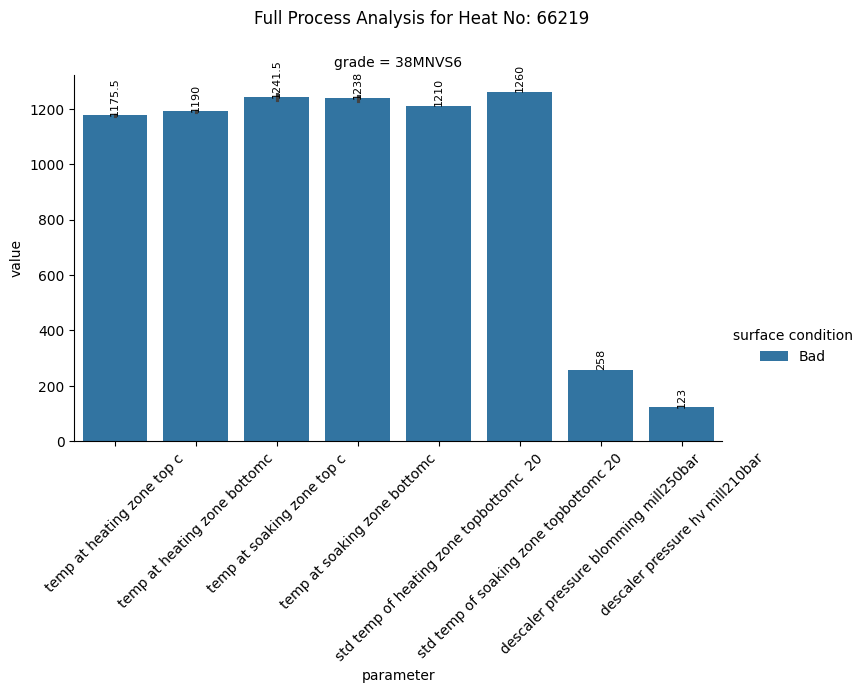


📊 Heat No: 66238 | Surface: Bad


/tmp/ipykernel_17935/1380744549.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


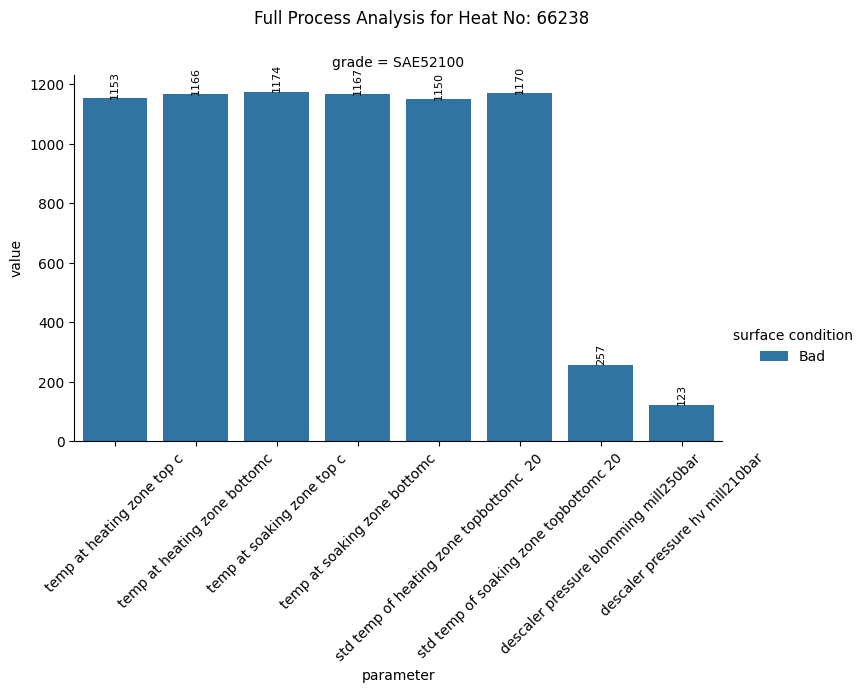


📊 Heat No: 66167 | Surface: Bad


/tmp/ipykernel_17935/1380744549.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


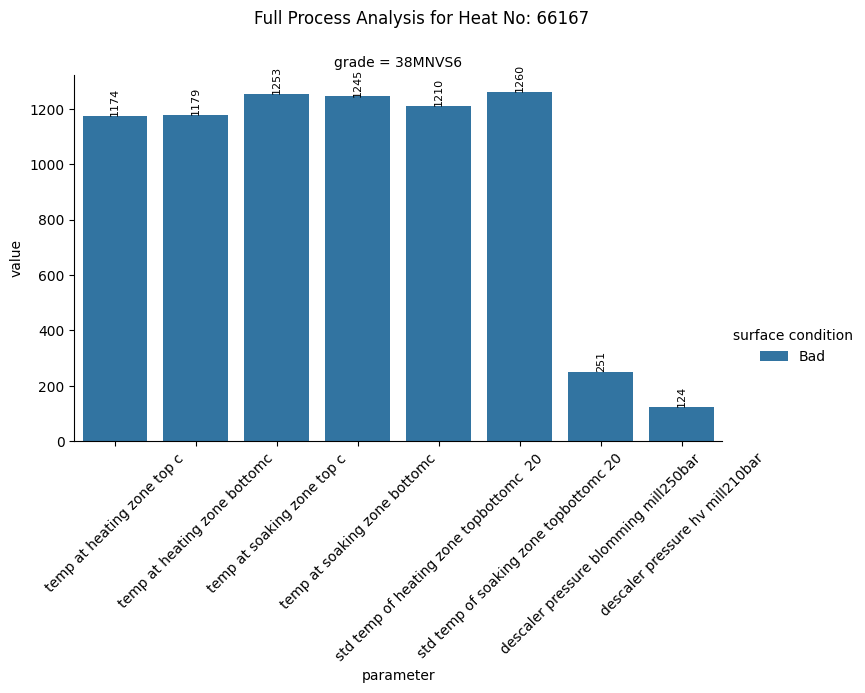


📊 Heat No: 66168 | Surface: Bad


/tmp/ipykernel_17935/1380744549.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


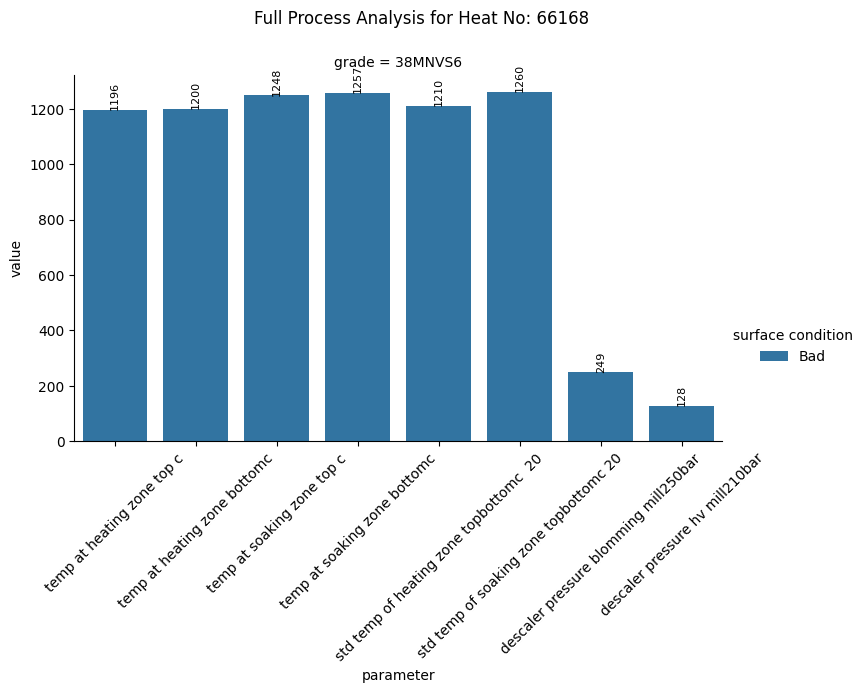


📊 Heat No: 66072 | Surface: Good


/tmp/ipykernel_17935/1380744549.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


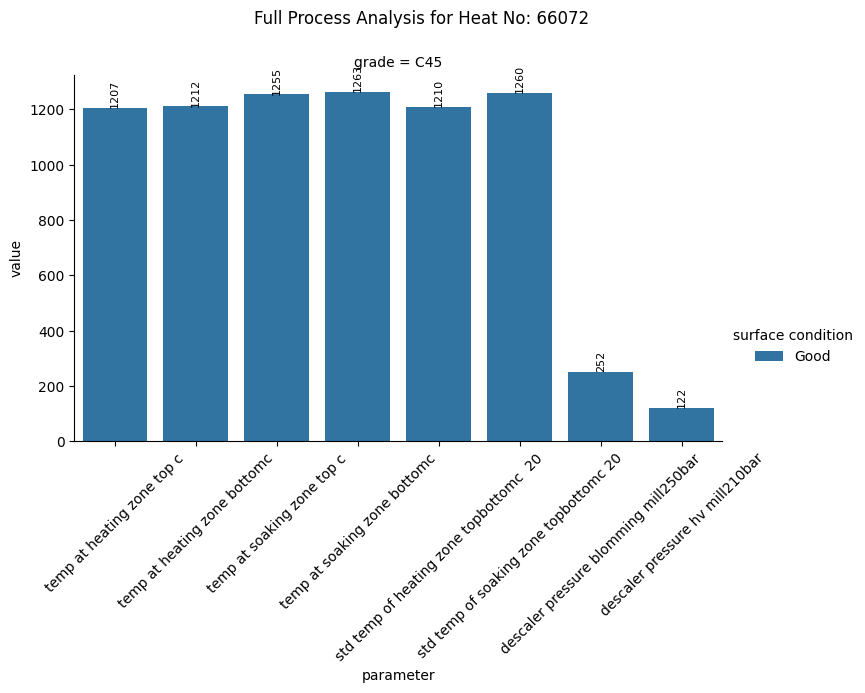

In [89]:
import seaborn as sns
import matplotlib.pyplot as plt

# All important parameters
all_cols = [
    'temp at heating zone top c',
    'temp at heating zone bottomc',
    'temp at soaking zone top c',
    'temp at soaking zone bottomc',
    'std temp of heating zone topbottomc  20',
    'std temp of soaking zone topbottomc 20',
    'descaler pressure blomming mill250bar',
    'descaler pressure hv mill210bar'
]
for heat in df_process_quality['heat no'].unique():

    df_heat = df_process_quality[
        df_process_quality['heat no'] == heat
    ]

    # Identify if heat is BAD
    condition = df_heat['surface condition'].iloc[0]

    print(f"\n📊 Heat No: {heat} | Surface: {condition}")

    # Convert to long format
    long_df = df_heat.melt(
        id_vars=['heat no', 'grade', 'surface condition', 'output sizemm'],
        value_vars=all_cols,
        var_name='parameter',
        value_name='value'
    )

    # Plot
    g = sns.catplot(
        data=long_df,
        x='parameter',
        y='value',
        hue='surface condition',
        col='grade',
        kind='bar',
        height=5,
        aspect=1.5
    )

    # Add values
    for ax in g.axes.flat:
        for container in ax.containers:
            ax.bar_label(container, fontsize=8, rotation=90)

    for ax in g.axes.flat:
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

    plt.subplots_adjust(top=0.85)
    g.fig.suptitle(f"Full Process Analysis for Heat No: {heat}")

    plt.show()

In [90]:
# Calculate deviation from standard temp
df_process_quality['heating_dev'] = (
    (df_process_quality['temp at heating zone top c'] +
     df_process_quality['temp at heating zone bottomc']) / 2
    - df_process_quality['std temp of heating zone topbottomc  20']
)

df_process_quality['soaking_dev'] = (
    (df_process_quality['temp at soaking zone top c'] +
     df_process_quality['temp at soaking zone bottomc']) / 2
    - df_process_quality['std temp of soaking zone topbottomc 20']
)
bad_heats = df_process_quality[
    df_process_quality['surface condition'] == 'Bad'
]

print("\n BAD HEAT ANALYSIS ")

print("Avg Heating Deviation:", bad_heats['heating_dev'].mean())
print("Avg Soaking Deviation:", bad_heats['soaking_dev'].mean())
print("Avg Blooming Pressure:", bad_heats['descaler pressure blomming mill250bar'].mean())
print("Avg HV Pressure:", bad_heats['descaler pressure hv mill210bar'].mean())


 BAD HEAT ANALYSIS 
Avg Heating Deviation: -11.0
Avg Soaking Deviation: -8.59375
Avg Blooming Pressure: 236.27777777777777
Avg HV Pressure: 124.22222222222223


/tmp/ipykernel_17935/3926977191.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_17935/3926977191.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_17935/3926977191.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_17935/3926977191.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_17935/3926977191.py:47: UserWarning: set_tick

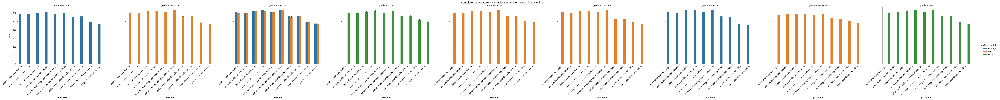

In [91]:
import seaborn as sns
import matplotlib.pyplot as plt

#  ADD NEW COLUMNS HERE
temp_std_cols = [
    'temp at heating zone top c',
    'temp at heating zone bottomc',
    'temp at soaking zone top c',
    'temp at soaking zone bottomc',
    'std temp of heating zone topbottomc  20',
    'std temp of soaking zone topbottomc 20',

    #  NEW 4 COLUMNS
    'surface temp after descaling in bmc',
    'core temp after descaling in bmc',
    'temp before entry to hv mill c',
    'temp after finish in hv mill c'
]

# Melt data
long_temp_std = df_process_quality.melt(
    id_vars=['heat no','grade', 'surface condition', 'output sizemm'],
    value_vars=temp_std_cols,
    var_name='parameter',
    value_name='value'
)

# Combined label
long_temp_std['heat_output'] = (
    long_temp_std['heat no'].astype(str) + "_" + long_temp_std['output sizemm']
)

# Plot
g = sns.catplot(
    data=long_temp_std,
    x='parameter',
    y='value',
    hue='surface condition',
    col='grade',
    kind='bar',
    height=5,
    aspect=1.5
)

# Add values on bars
for ax in g.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.subplots_adjust(top=0.9)
g.fig.suptitle("Complete Temperature Flow Analysis (Furnace → Descaling → Rolling)")

plt.show()

In [92]:
temp_std_cols = [
    'temp at heating zone top c',
    'temp at heating zone bottomc',
    'temp at soaking zone top c',
    'temp at soaking zone bottomc',
    'std temp of heating zone topbottomc  20',   #  fixed
    'std temp of soaking zone topbottomc 20',
    'surface temp after descaling in bmc',
    'core temp after descaling in bmc',
    'temp before entry to hv mill c',
    'temp after finish in hv mill c'
]

/tmp/ipykernel_17935/4202776433.py:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_17935/4202776433.py:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_17935/4202776433.py:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_17935/4202776433.py:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_17935/4202776433.py:41: UserWarning: set_tick

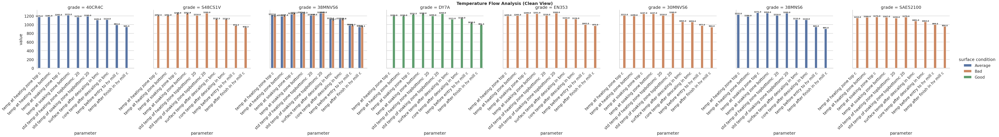

In [93]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="whitegrid", context="talk")

# Reduce clutter (VERY IMPORTANT)
top_heats = df_process_quality['heat no'].value_counts().head(19).index

filtered_df = df_process_quality[
    df_process_quality['heat no'].isin(top_heats)
]

# Melt
long_temp_std = filtered_df.melt(
    id_vars=['heat no','grade', 'surface condition', 'output sizemm'],
    value_vars=temp_std_cols,
    var_name='parameter',
    value_name='value'
)

# Short label (avoid long overlap)
long_temp_std['heat_output'] = (
    "H" + long_temp_std['heat no'].astype(str) +
    "\n" + long_temp_std['output sizemm']
)

# Plot ( removed row=heat_output for clarity)
g = sns.catplot(
    data=long_temp_std,
    x='parameter',
    y='value',
    hue='surface condition',
    col='grade',
    kind='bar',
    height=5,
    aspect=1.4
)

#  Rotate x labels
for ax in g.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

#  Add bold values
for ax in g.axes.flat:
    for container in ax.containers:
        labels = ax.bar_label(container, fmt='%.1f', fontsize=8)
        for label in labels:
            label.set_fontweight('bold')

#  Improve spacing
plt.subplots_adjust(top=0.88, hspace=0.4, wspace=0.2)

g.fig.suptitle(
    "Temperature Flow Analysis (Clean View)",
    fontsize=18,
    fontweight='bold'
)

plt.show()


📊 Heat No: 66063 | Surface: Average


/tmp/ipykernel_17935/1541514968.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


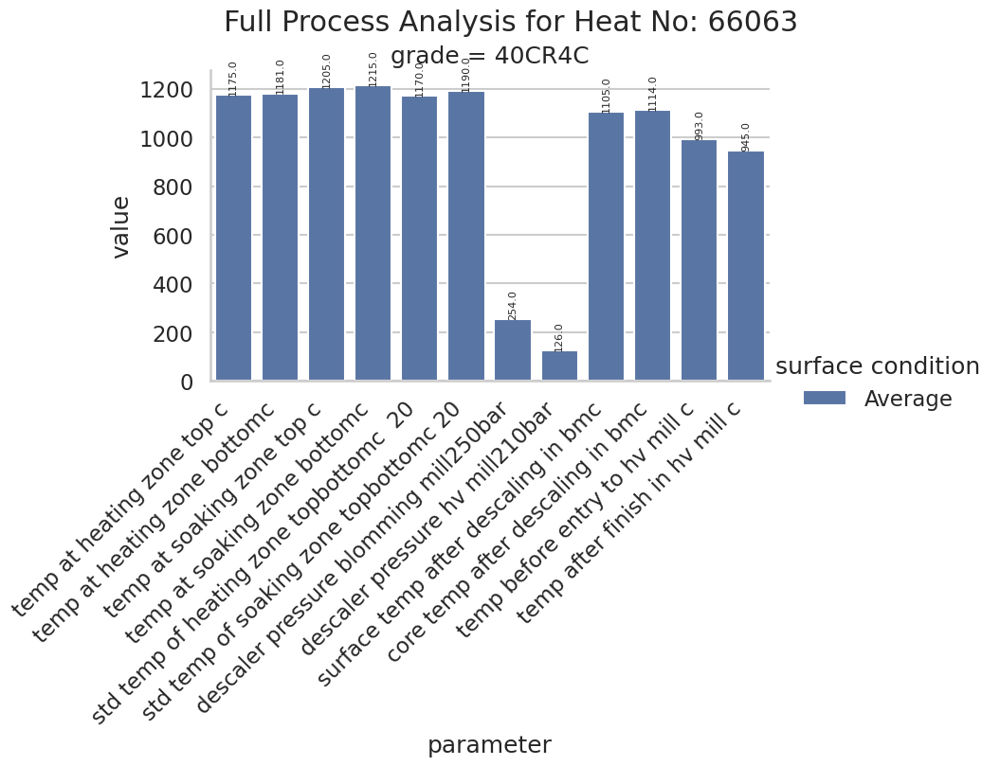


📊 Heat No: 66088 | Surface: Bad


/tmp/ipykernel_17935/1541514968.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


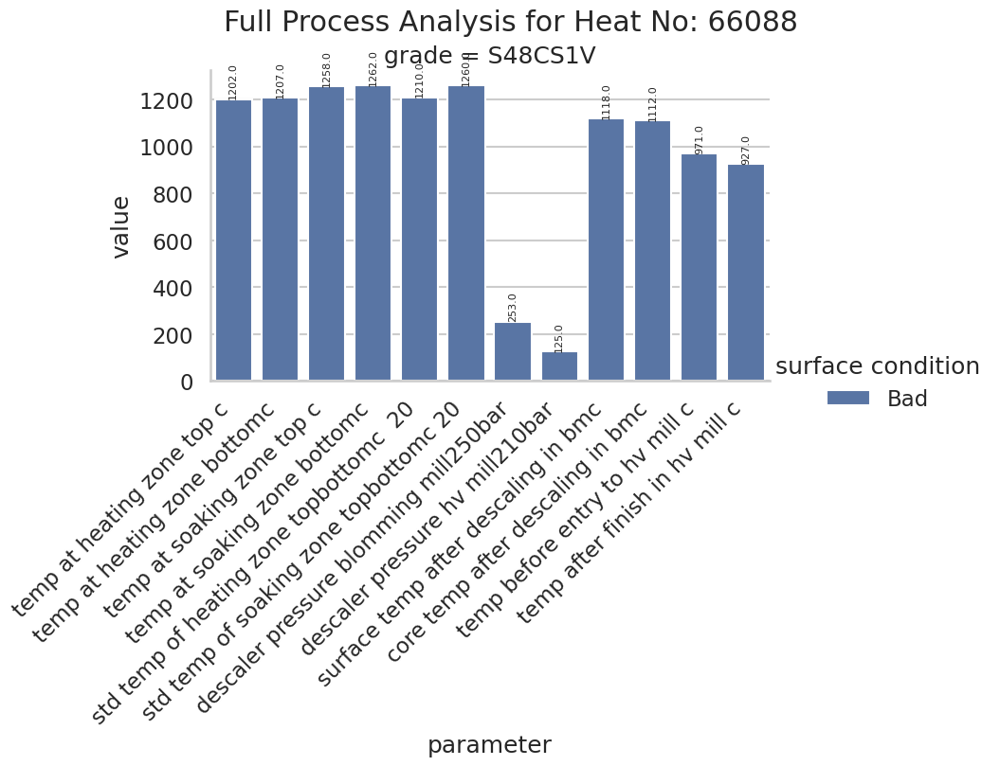


📊 Heat No: 66089 | Surface: Bad


/tmp/ipykernel_17935/1541514968.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


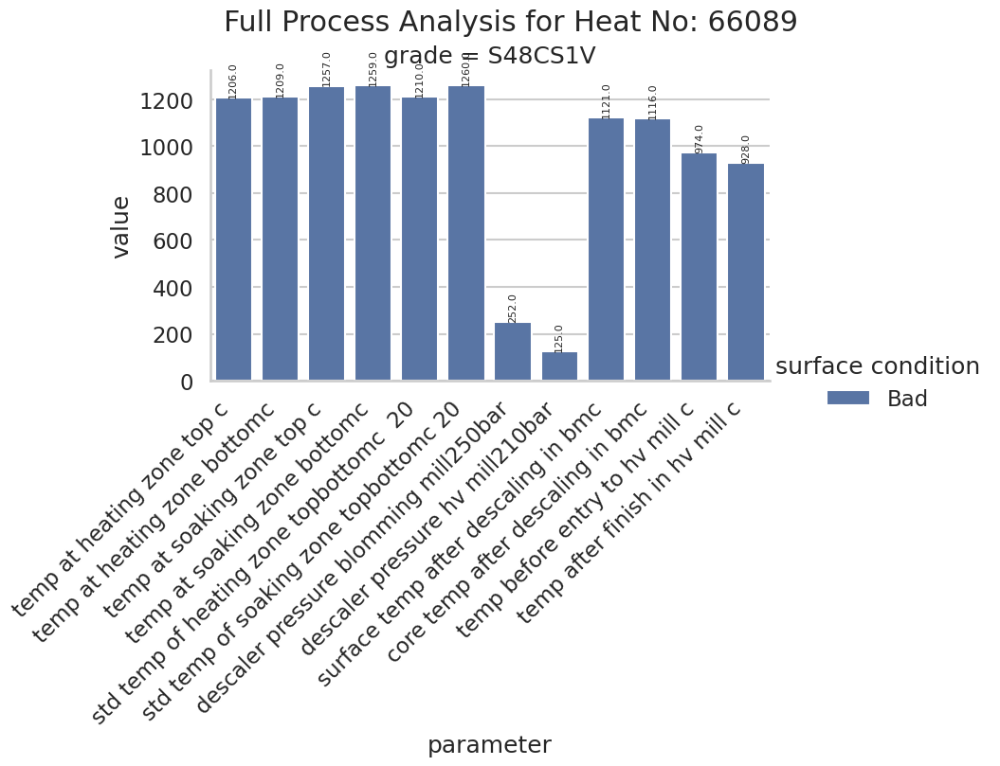


📊 Heat No: 66091 | Surface: Bad


/tmp/ipykernel_17935/1541514968.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


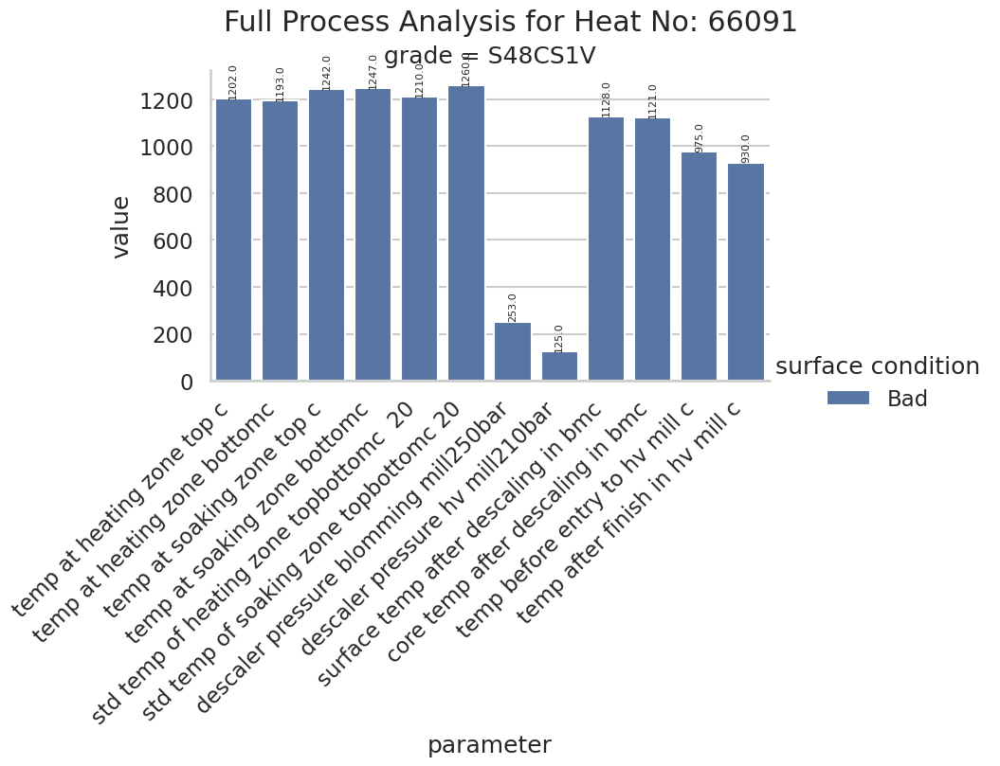


📊 Heat No: 66207 | Surface: Bad


/tmp/ipykernel_17935/1541514968.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


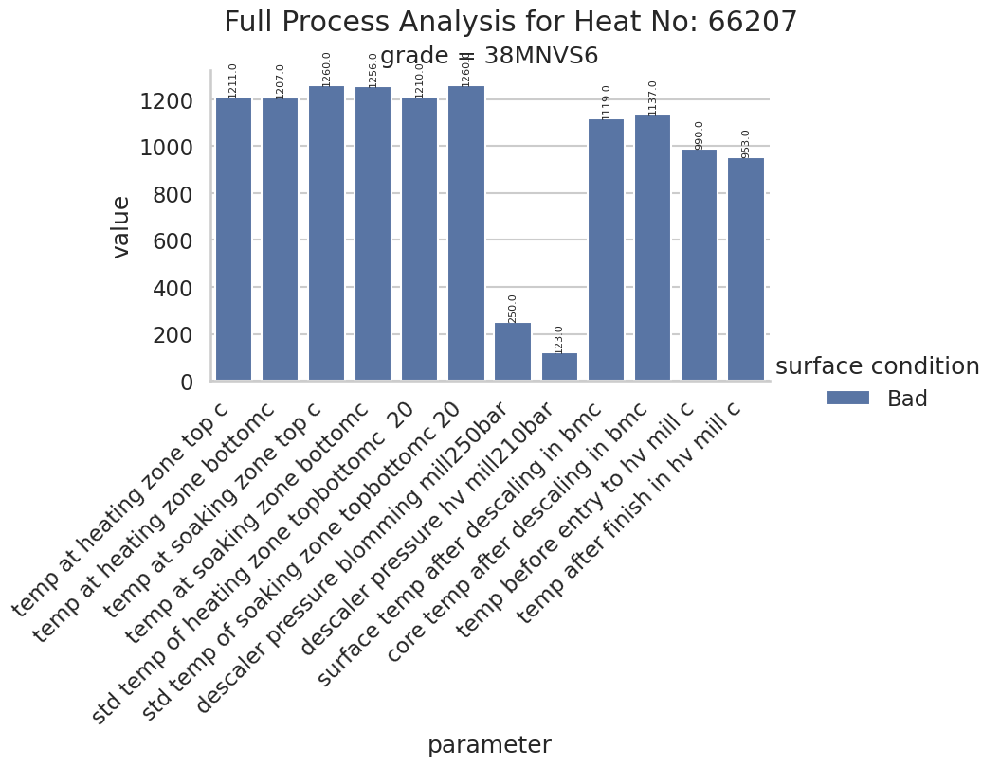


📊 Heat No: 66098 | Surface: Bad


/tmp/ipykernel_17935/1541514968.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


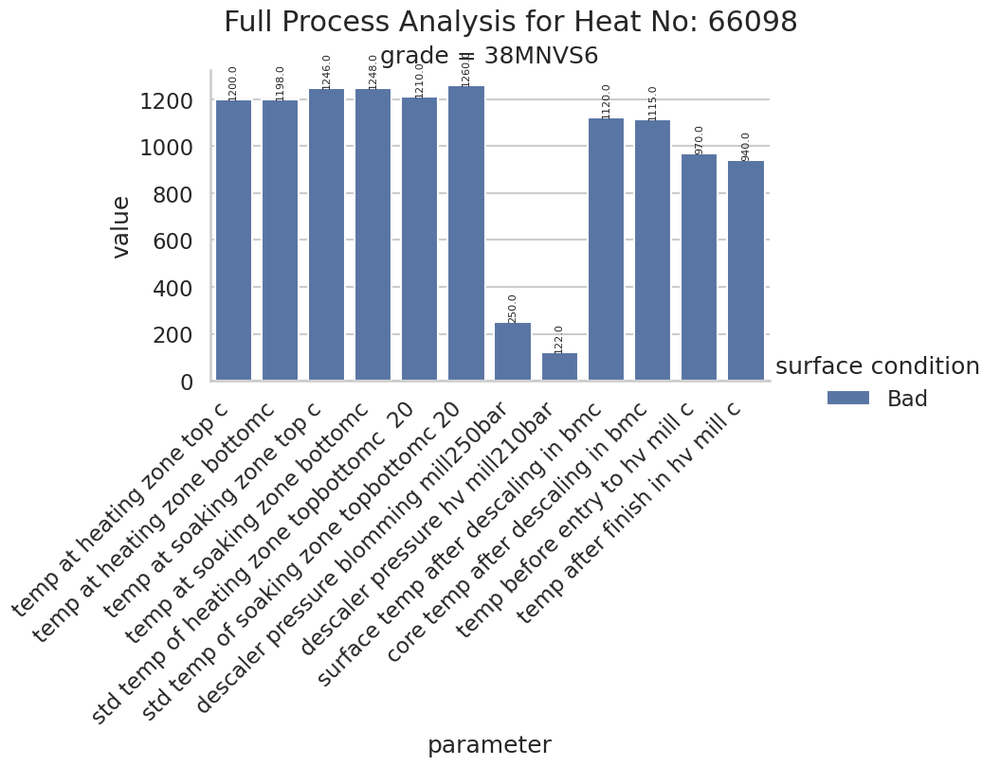


📊 Heat No: 66217 | Surface: Bad


/tmp/ipykernel_17935/1541514968.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


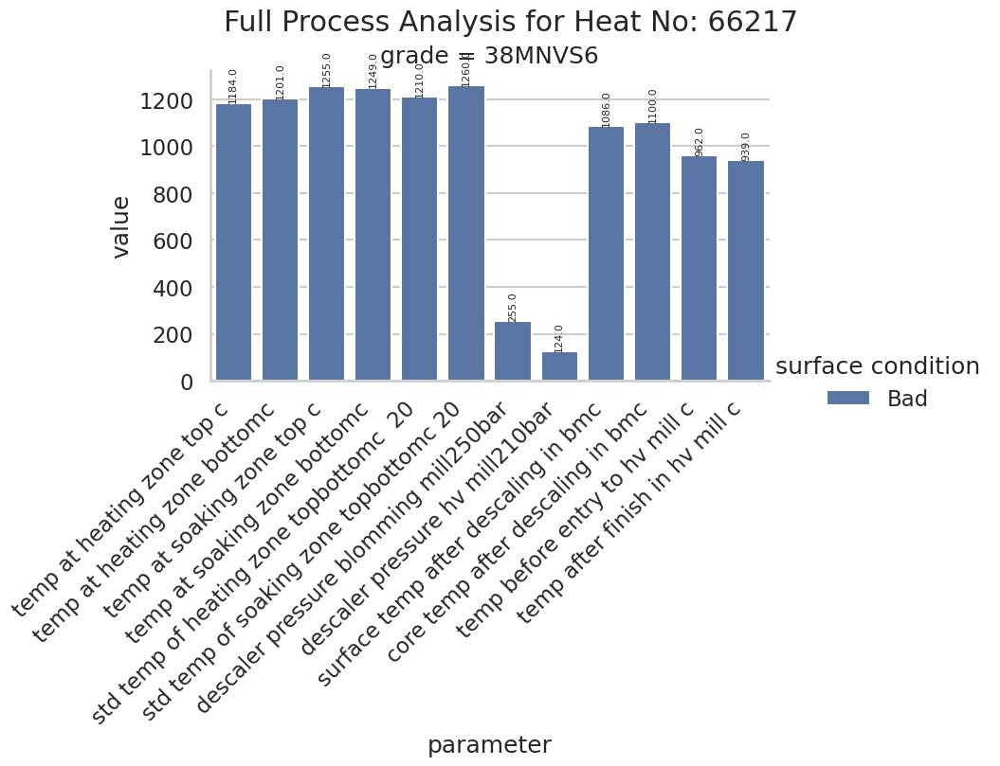


📊 Heat No: 66090 | Surface: Bad


/tmp/ipykernel_17935/1541514968.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


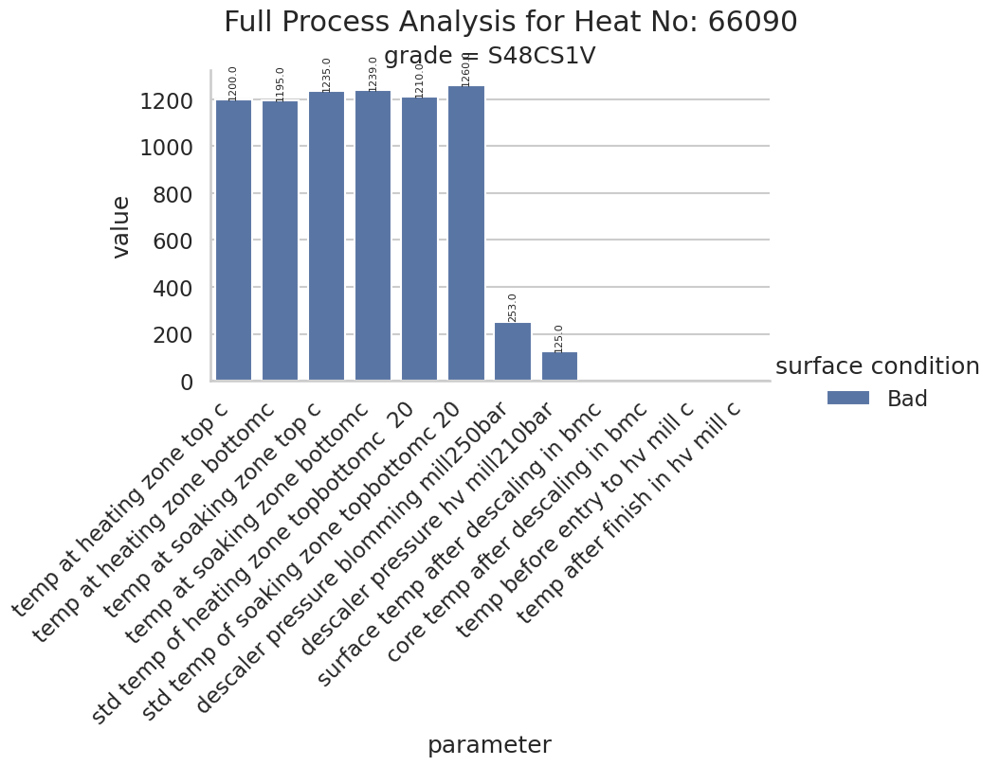


📊 Heat No: 66208 | Surface: Bad


/tmp/ipykernel_17935/1541514968.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


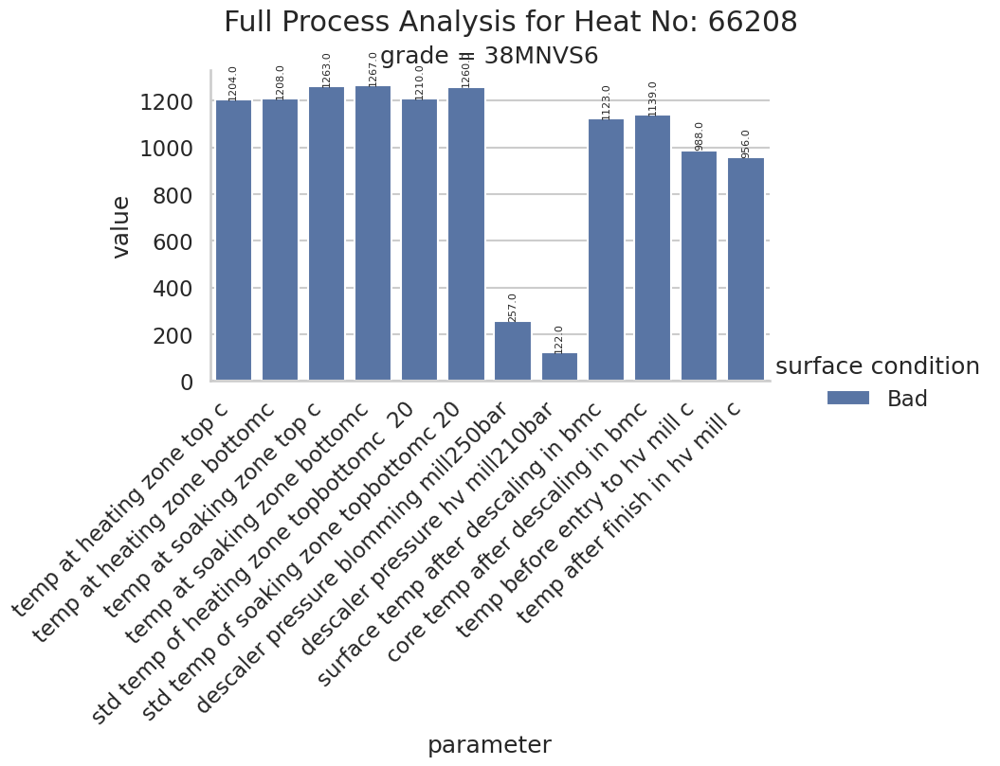


📊 Heat No: 66096 | Surface: Average


/tmp/ipykernel_17935/1541514968.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


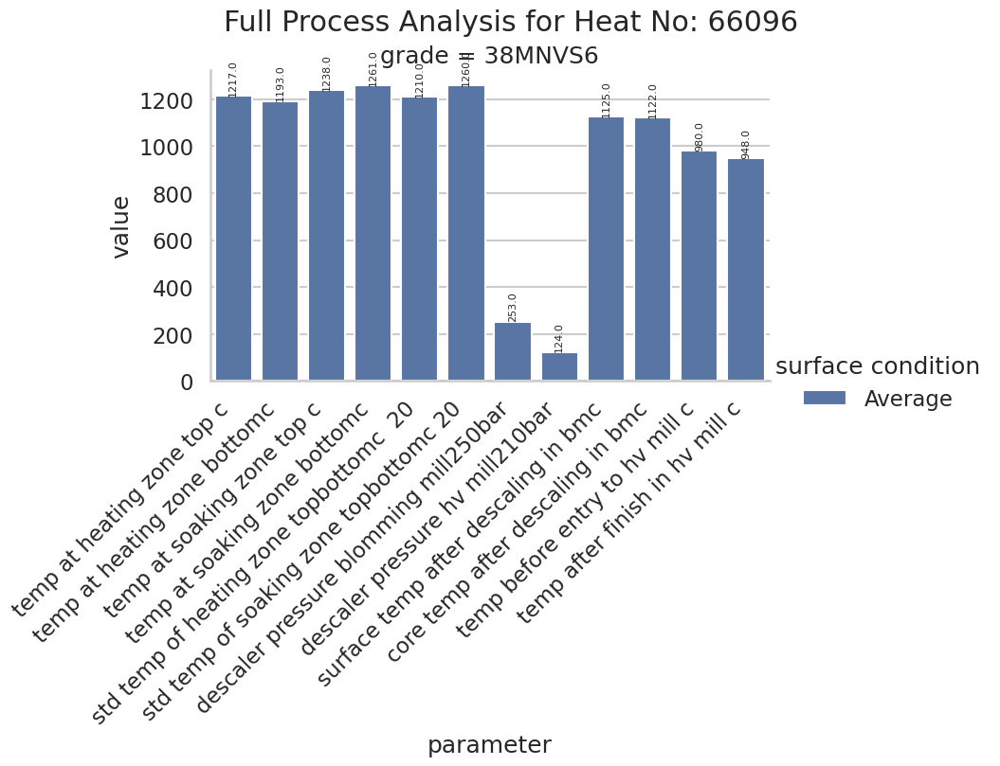


📊 Heat No: 66209 | Surface: Bad


/tmp/ipykernel_17935/1541514968.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


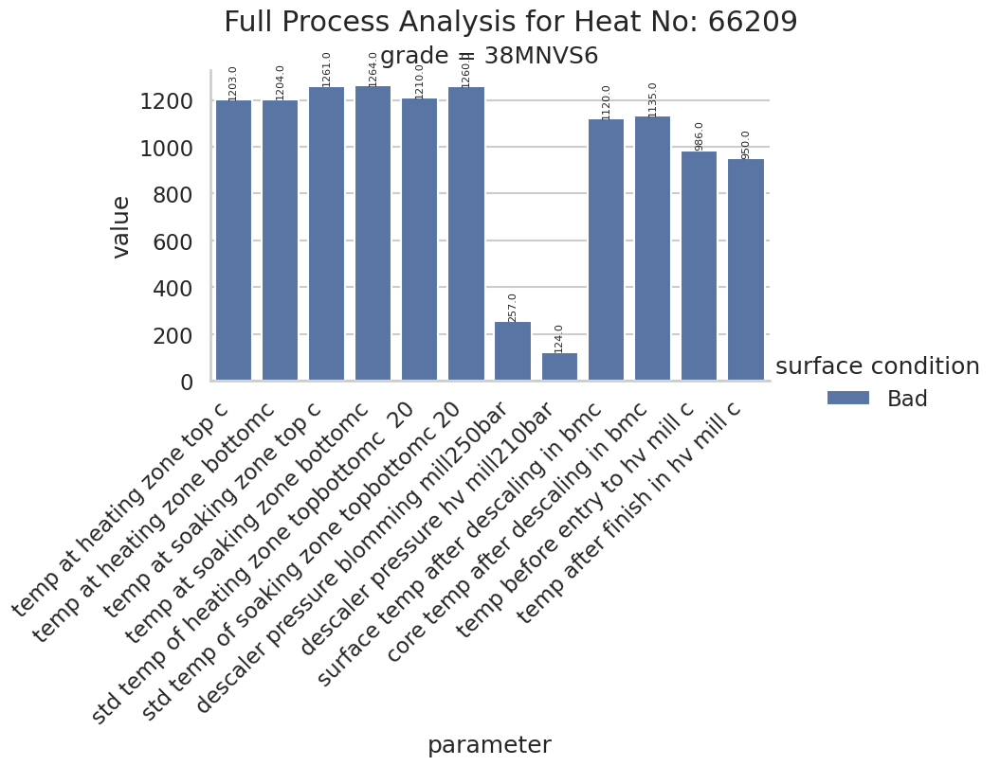


📊 Heat No: 65626 | Surface: Good


/tmp/ipykernel_17935/1541514968.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


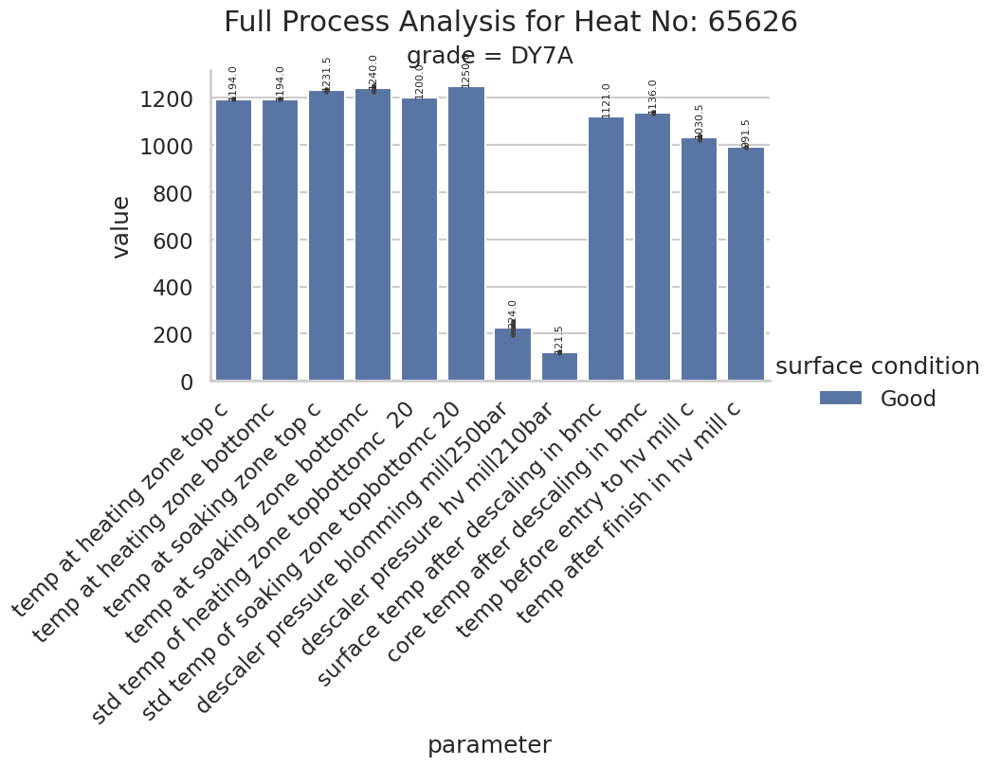


📊 Heat No: 66026 | Surface: Bad


/tmp/ipykernel_17935/1541514968.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


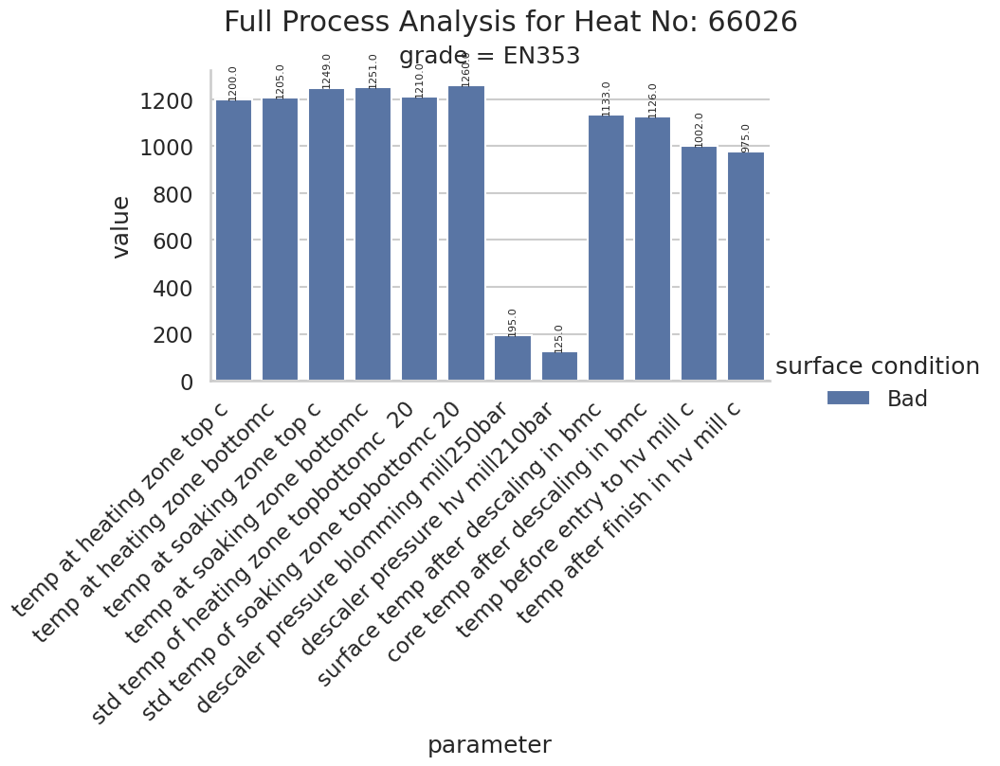


📊 Heat No: 63517 | Surface: Bad


/tmp/ipykernel_17935/1541514968.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


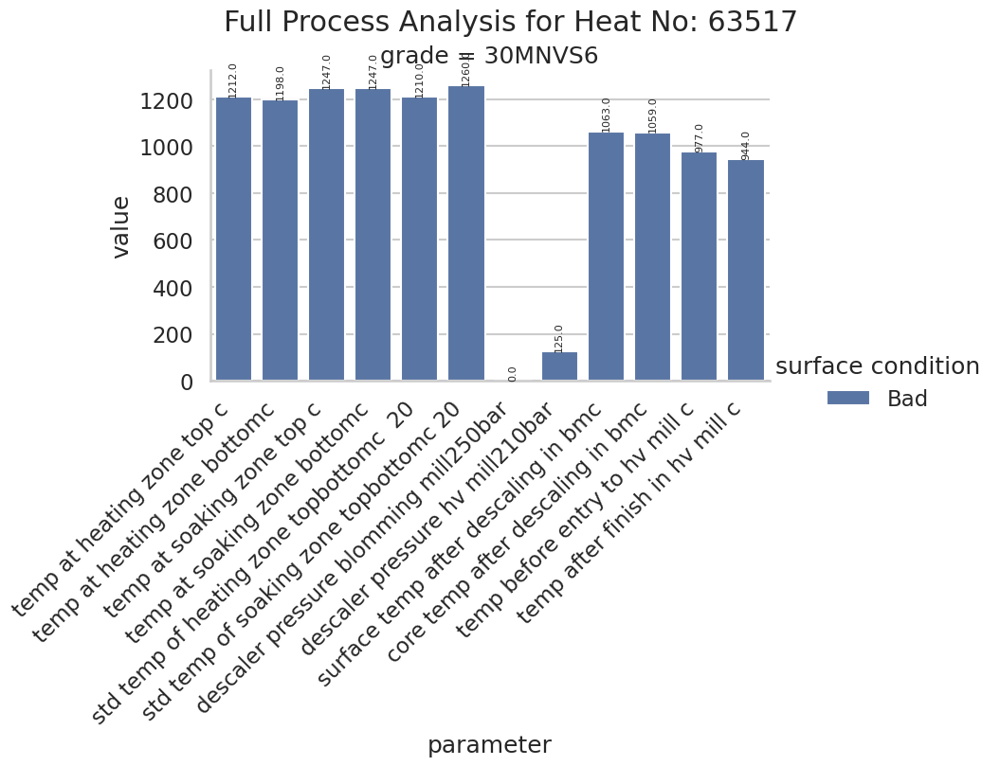


📊 Heat No: 66104 | Surface: Average


/tmp/ipykernel_17935/1541514968.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


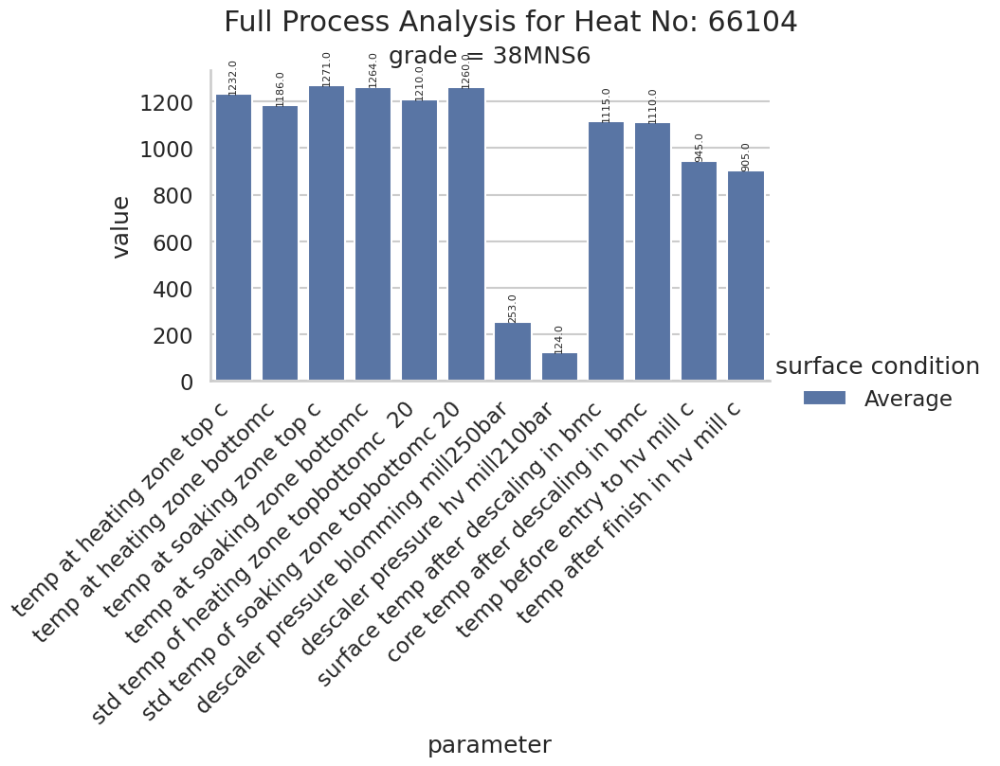


📊 Heat No: 66219 | Surface: Bad


/tmp/ipykernel_17935/1541514968.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


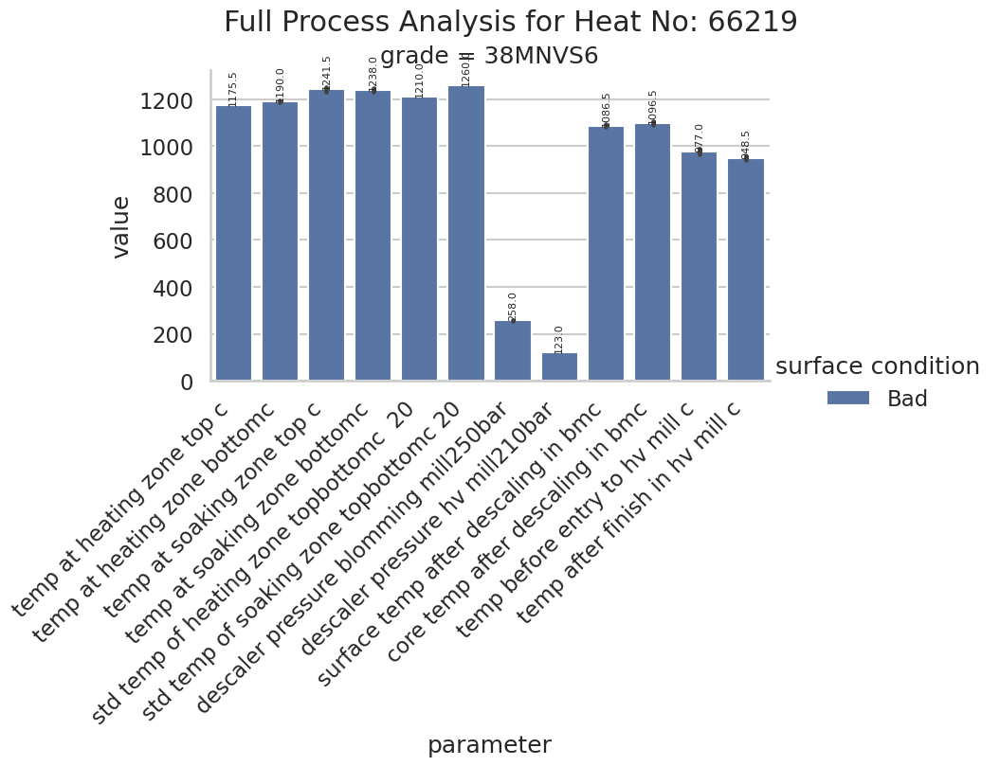


📊 Heat No: 66238 | Surface: Bad


/tmp/ipykernel_17935/1541514968.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


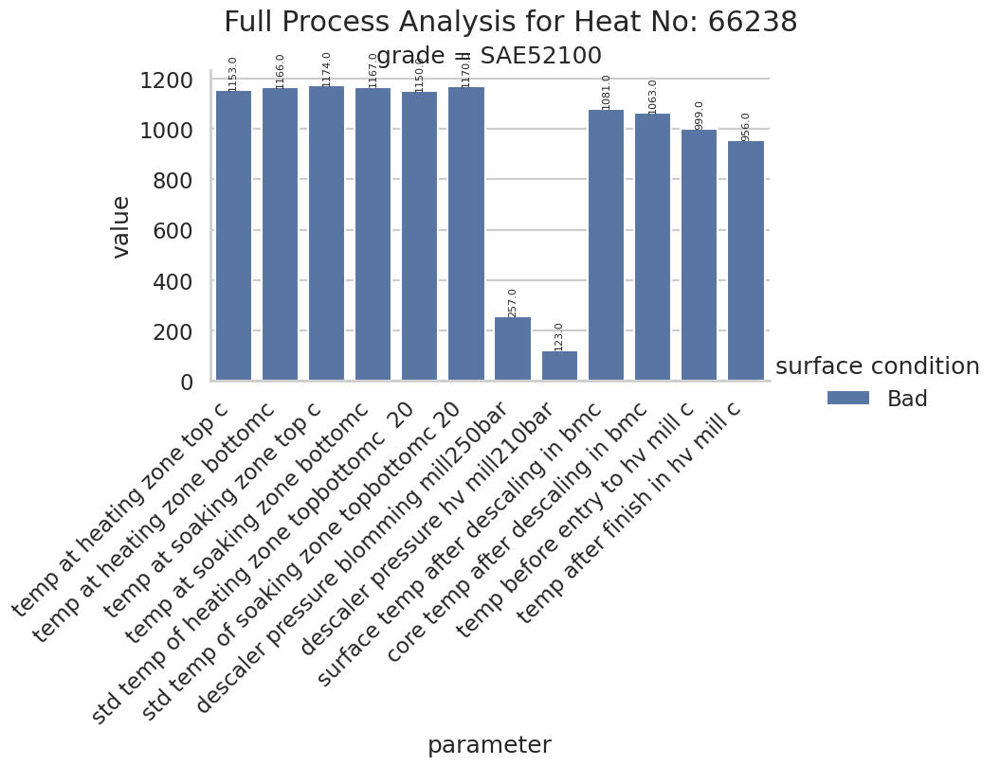


📊 Heat No: 66167 | Surface: Bad


/tmp/ipykernel_17935/1541514968.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


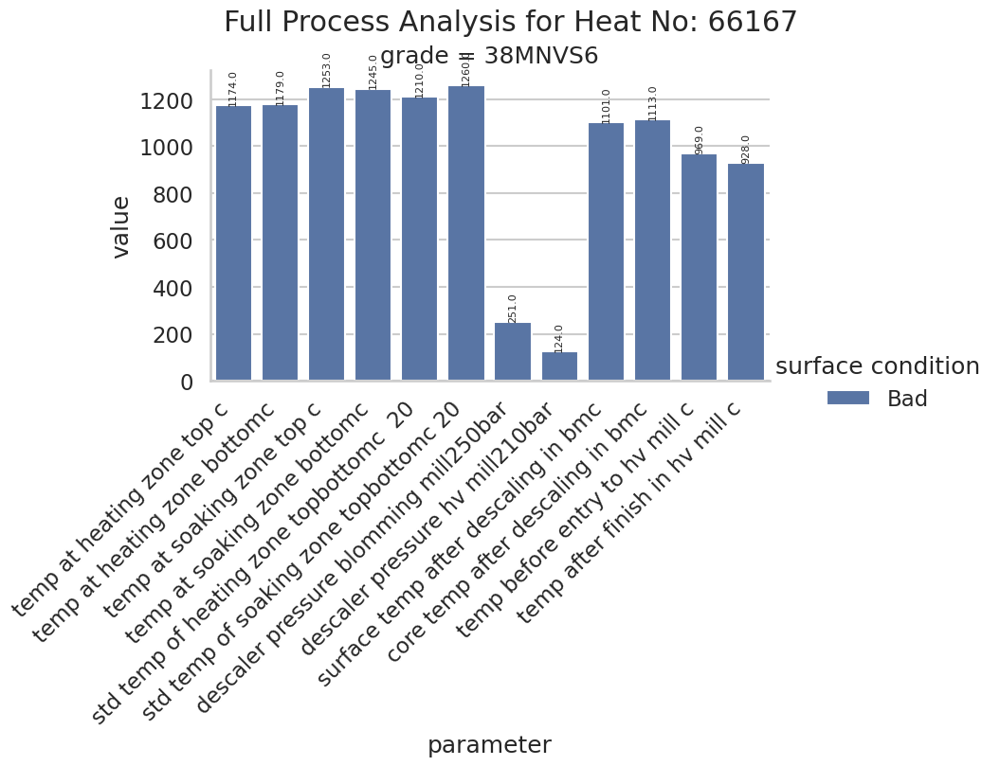


📊 Heat No: 66168 | Surface: Bad


/tmp/ipykernel_17935/1541514968.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


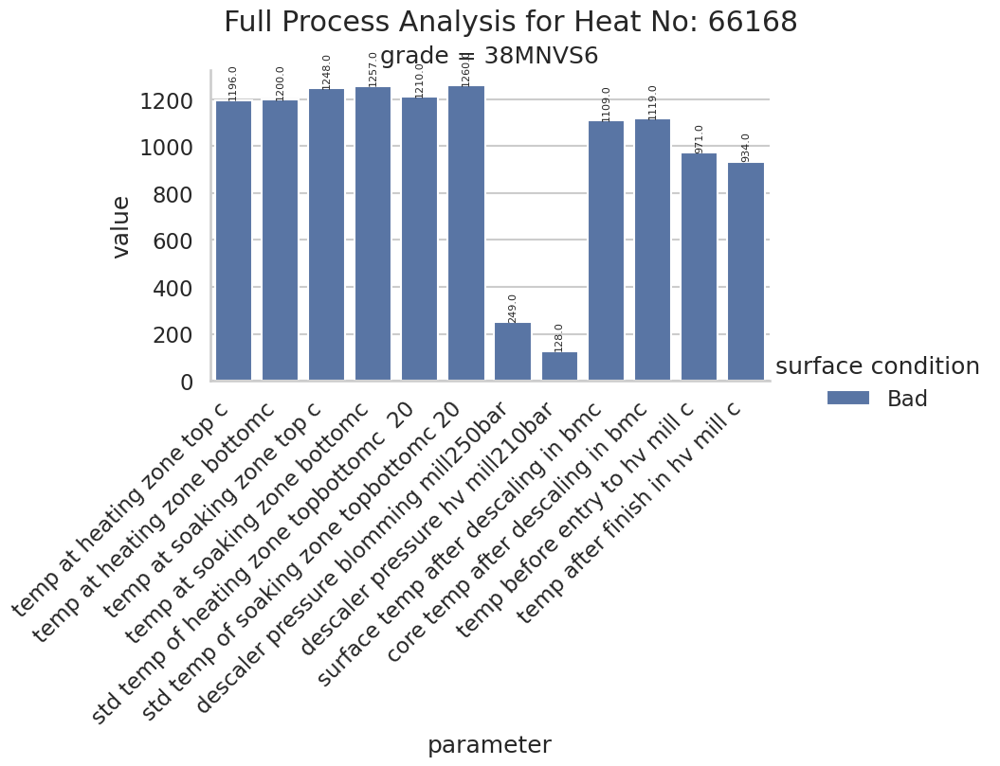


📊 Heat No: 66072 | Surface: Good


/tmp/ipykernel_17935/1541514968.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


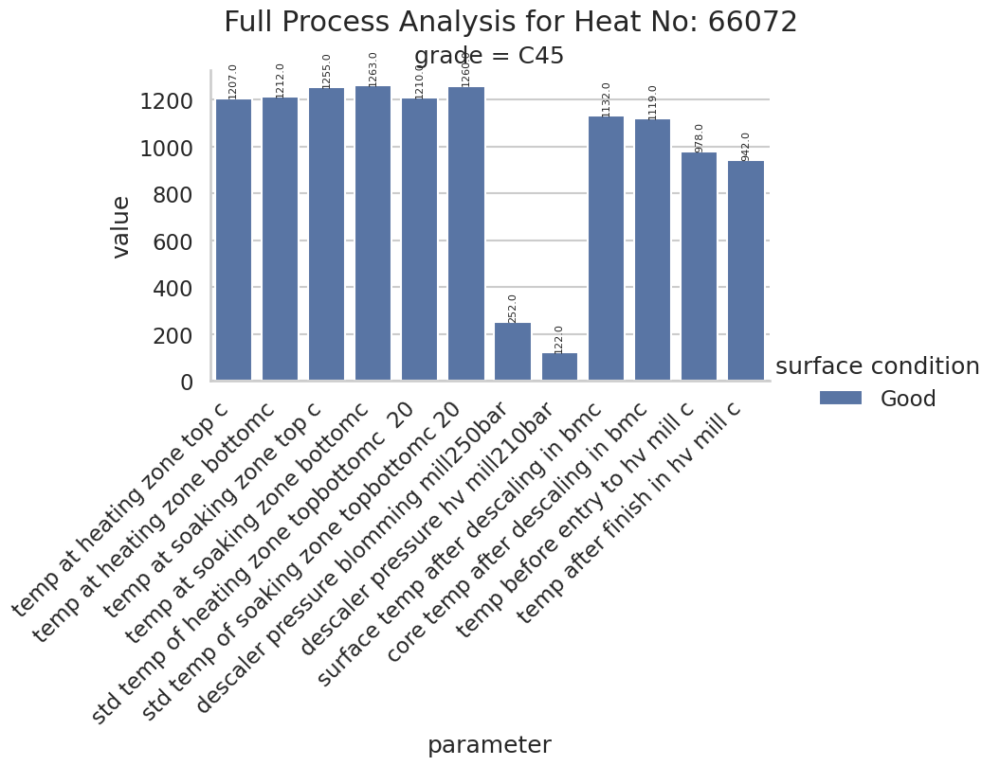

In [94]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# All important parameters (UPDATED)
all_cols = [
    'temp at heating zone top c',
    'temp at heating zone bottomc',
    'temp at soaking zone top c',
    'temp at soaking zone bottomc',
    'std temp of heating zone topbottomc  20',
    'std temp of soaking zone topbottomc 20',
    'descaler pressure blomming mill250bar',
    'descaler pressure hv mill210bar',

    # NEW ADDED COLUMNS
    'surface temp after descaling in bmc',
    'core temp after descaling in bmc',
    'temp before entry to hv mill c',
    'temp after finish in hv mill c'
]

# Convert to numeric (VERY IMPORTANT)
for col in all_cols:
    df_process_quality[col] = pd.to_numeric(df_process_quality[col], errors='coerce')


# Loop heat-wise
for heat in df_process_quality['heat no'].unique():

    df_heat = df_process_quality[
        df_process_quality['heat no'] == heat
    ]

    # Skip if empty
    if df_heat.empty:
        continue

    # Identify condition
    condition = df_heat['surface condition'].iloc[0]

    print(f"\n📊 Heat No: {heat} | Surface: {condition}")

    # Melt data
    long_df = df_heat.melt(
        id_vars=['heat no', 'grade', 'surface condition', 'output sizemm'],
        value_vars=all_cols,
        var_name='parameter',
        value_name='value'
    )

    # Plot
    g = sns.catplot(
        data=long_df,
        x='parameter',
        y='value',
        hue='surface condition',
        col='grade',
        kind='bar',
        height=5,
        aspect=1.6
    )

    # Add values on bars
    for ax in g.axes.flat:
        for container in ax.containers:
            ax.bar_label(container, fmt='%.1f', fontsize=8, rotation=90)

    # Rotate labels
    for ax in g.axes.flat:
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

    plt.subplots_adjust(top=0.85)
    g.fig.suptitle(f"Full Process Analysis for Heat No: {heat}")

    plt.show()

In [95]:
filtered=df_process_quality[df_process_quality['heat no'].isin([66167, 66168])]
print(filtered.to_string())

   heat no    grade   size   customer rolling mill agency        avg surface quality surface condition       date       type of steel finishing millbmhv input sizemm output sizemm hot cold charge grinding non grinding lime coating  descaler pressure blomming mill250bar  temperature at preheating zonec  std temp of heating zone topbottomc  20  std temp of soaking zone topbottomc 20  temp at heating zone top c  temp at heating zone bottomc  temp at soaking zone top c  temp at soaking zone bottomc  surface temp after descaling in bmc  core temp after descaling in bmc temp before entry and exit in bm mill c  temp before entry to hv mill c  temp after finish in hv mill c temp at cooling bedc std furnace residence time frt hr first bloom frt   hrs last bloom frt    hrs mill speed bmms mill speed hvms  descaler pressure hv mill210bar no of passes required for bm mll no of passes required for hv mll temp of bar during cutting c semisfinished bar cooling tempduring transfer for pit coolingc sur

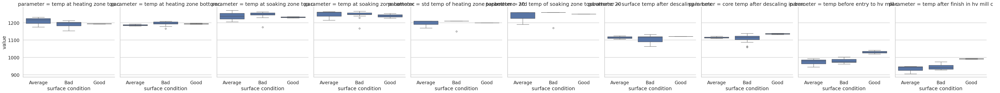

In [96]:
sns.catplot(
    data=long_temp_std,
    x='surface condition',
    y='value',
    col='parameter',
    kind='box'
)
plt.show()

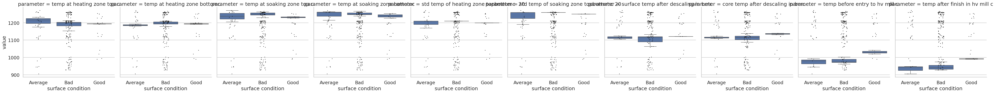

In [97]:
g = sns.catplot(
    data=long_temp_std,
    x='surface condition',
    y='value',
    col='parameter',
    kind='box'
)

# Overlay actual values
for ax in g.axes.flat:
    sns.stripplot(
        data=long_temp_std,
        x='surface condition',
        y='value',
        ax=ax,
        color='black',
        size=2,
        jitter=True

    )

plt.show()

Q1: 1182.0
Median: 1200.0
Q3: 1203.25
IQR: 21.25
Lower Whisker: 1150.125
Upper Whisker: 1235.125
Outliers: []


<Axes: xlabel='surface condition', ylabel='value'>

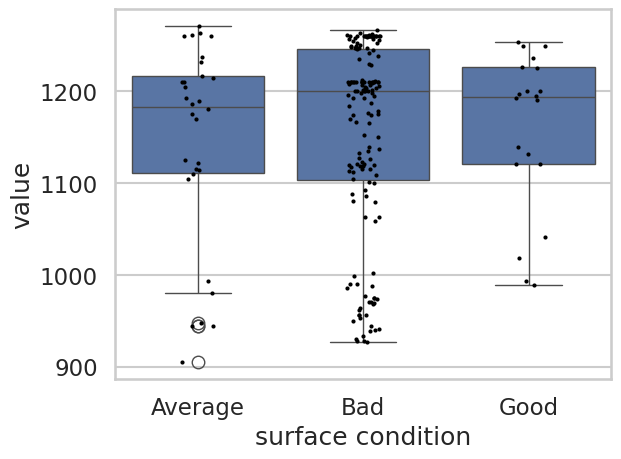

In [98]:
# Select one example group (you can change this)
sample = long_temp_std[
    (long_temp_std['parameter'] == 'temp at heating zone top c') &
    (long_temp_std['surface condition'] == 'Bad')
]['value']

# Calculate boxplot statistics
Q1 = sample.quantile(0.25)
Q2 = sample.quantile(0.50)  # Median
Q3 = sample.quantile(0.75)

IQR = Q3 - Q1

# Whiskers
lower_whisker = Q1 - 1.5 * IQR
upper_whisker = Q3 + 1.5 * IQR

# Outliers
outliers = sample[(sample < lower_whisker) | (sample > upper_whisker)]

print("Q1:", Q1)
print("Median:", Q2)
print("Q3:", Q3)
print("IQR:", IQR)
print("Lower Whisker:", lower_whisker)
print("Upper Whisker:", upper_whisker)
print("Outliers:", outliers.values)

sns.boxplot(
    data=long_temp_std,
    x='surface condition',
    y='value'
)

sns.stripplot(
    data=long_temp_std,
    x='surface condition',
    y='value',
    color='black',
    size=3
)

In [99]:
long_temp_std['deviation'] = long_temp_std['value'] - long_temp_std.groupby(
    ['heat no', 'output sizemm']
)['value'].transform('mean')

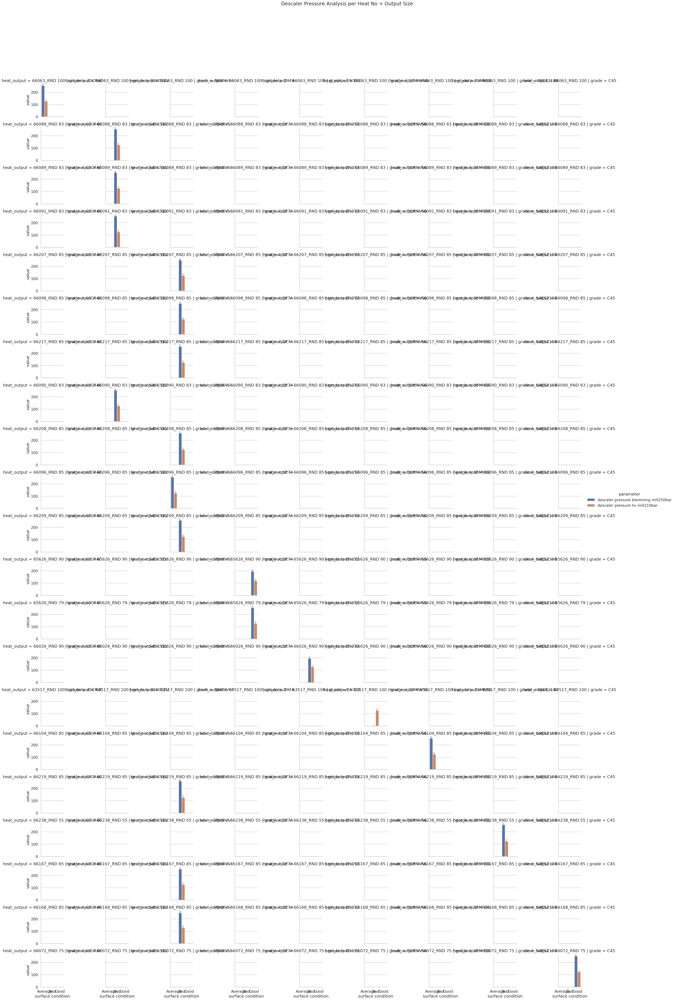

In [100]:
import seaborn as sns
import matplotlib.pyplot as plt

#  Pressure columns
pressure_cols = [
    'descaler pressure blomming mill250bar',
    'descaler pressure hv mill210bar'
]

#  Melt data (include heat no, grade, output size)
long_pressure = df_process_quality.melt(
    id_vars=['heat no', 'grade', 'surface condition', 'output sizemm'],
    value_vars=pressure_cols,
    var_name='parameter',
    value_name='value'
)

#  Create combined label (heat + output size)
long_pressure['heat_output'] = (
    long_pressure['heat no'].astype(str) + "_" + long_pressure['output sizemm']
)

#  BAR PLOT (same as temp plot)
g = sns.catplot(
    data=long_pressure,
    x='surface condition',
    y='value',
    hue='parameter',
    col='grade',
    row='heat_output',
    kind='bar',
    height=3,
    aspect=1.3
)

#  Add values on top
for ax in g.axes.flat:
    for container in ax.containers:
        ax.bar_label(container, fontsize=6, rotation=90)

plt.subplots_adjust(top=0.9)
g.fig.suptitle("Descaler Pressure Analysis per Heat No + Output Size")

plt.show()

In [101]:
grouped.head(21)

,heat no,grade,input sizemm,output sizemm,surface condition,temp at heating zone top c,temp at heating zone bottomc,temp at soaking zone top c,temp at soaking zone bottomc,descaler pressure blomming mill250bar,descaler pressure hv mill210bar
0,63517,30MNVS6,280*320,RND 100,Bad,1212.0,1198.0,1247.0,1247.0,0.0,125.0
1,65626,DY7A,205*225,RND 79,Good,1193.0,1197.0,1227.0,1226.0,253.0,124.0
2,65626,DY7A,205*225,RND 90,Good,1195.0,1191.0,1236.0,1254.0,195.0,119.0
3,66026,EN353,280*320,RND 90,Bad,1200.0,1205.0,1249.0,1251.0,195.0,125.0
4,66063,40CR4C,280*320,RND 100,Average,1175.0,1181.0,1205.0,1215.0,254.0,126.0
5,66072,C45,280*320,RND 75,Good,1207.0,1212.0,1255.0,1263.0,252.0,122.0
6,66088,S48CS1V,280*320,RND 83,Bad,1202.0,1207.0,1258.0,1262.0,253.0,125.0
7,66089,S48CS1V,280*320,RND 83,Bad,1206.0,1209.0,1257.0,1259.0,252.0,125.0
8,66090,S48CS1V,280*320,RND 83,Bad,1200.0,1195.0,1235.0,1239.0,253.0,125.0
9,66091,S48CS1V,280*320,RND 83,Bad,1202.0,1193.0,1242.0,1247.0,253.0,125.0


<Figure size 3000x1600 with 0 Axes>

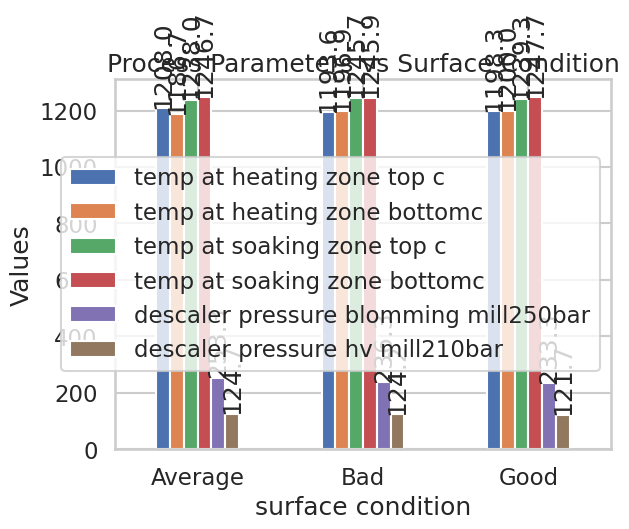

In [102]:
import matplotlib.pyplot as plt
import numpy as np

cols = [
    'temp at heating zone top c',
    'temp at heating zone bottomc',
    'temp at soaking zone top c',
    'temp at soaking zone bottomc',
    'descaler pressure blomming mill250bar',
    'descaler pressure hv mill210bar'
]

# Group data
grouped = df_process_quality.groupby('surface condition')[cols].mean()

# Plot
plt.figure(figsize=(15,8),dpi=200)
ax = grouped.plot(kind='bar')

# Add values on top of bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f', label_type='edge',rotation=90)

plt.title('Process Parameters vs Surface Condition')
plt.xticks(rotation=0)
plt.ylabel('Values')
plt.show()

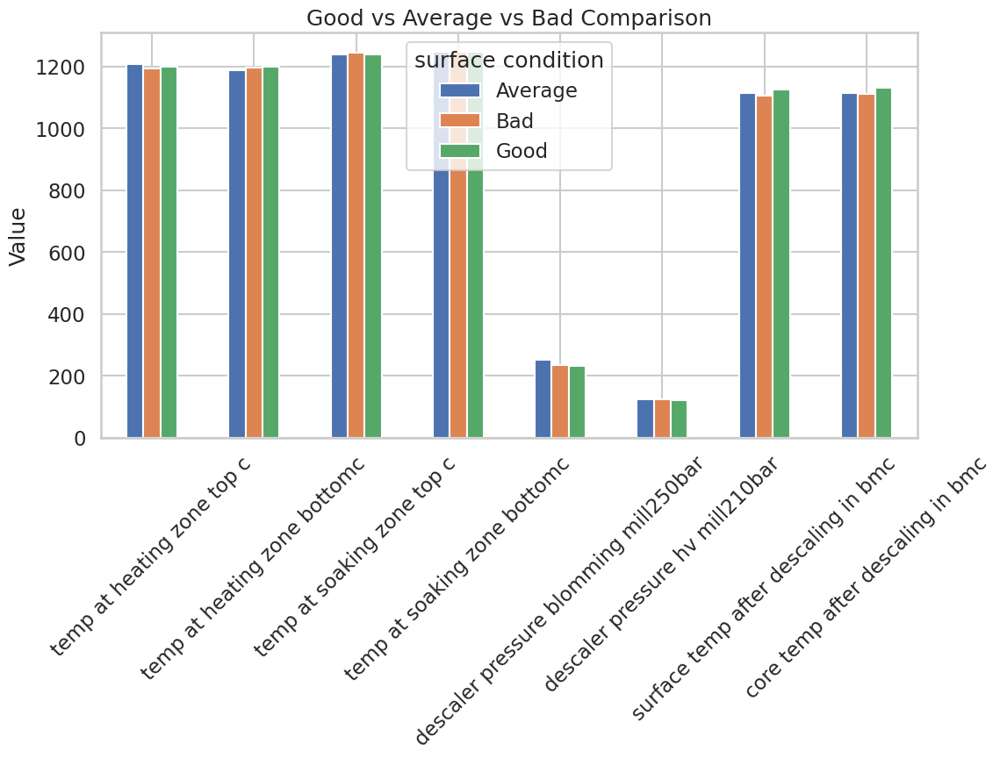

In [103]:
comparison = df_process_quality.groupby('surface condition')[
    [
        'temp at heating zone top c',
        'temp at heating zone bottomc',
        'temp at soaking zone top c',
        'temp at soaking zone bottomc',
        'descaler pressure blomming mill250bar',
        'descaler pressure hv mill210bar',
        'surface temp after descaling in bmc',
        'core temp after descaling in bmc'
    ]
].mean().T

comparison.plot(kind='bar', figsize=(12,6))

plt.title('Good vs Average vs Bad Comparison')
plt.ylabel('Value')
plt.xticks(rotation=45)
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f', padding=2)
plt.show()

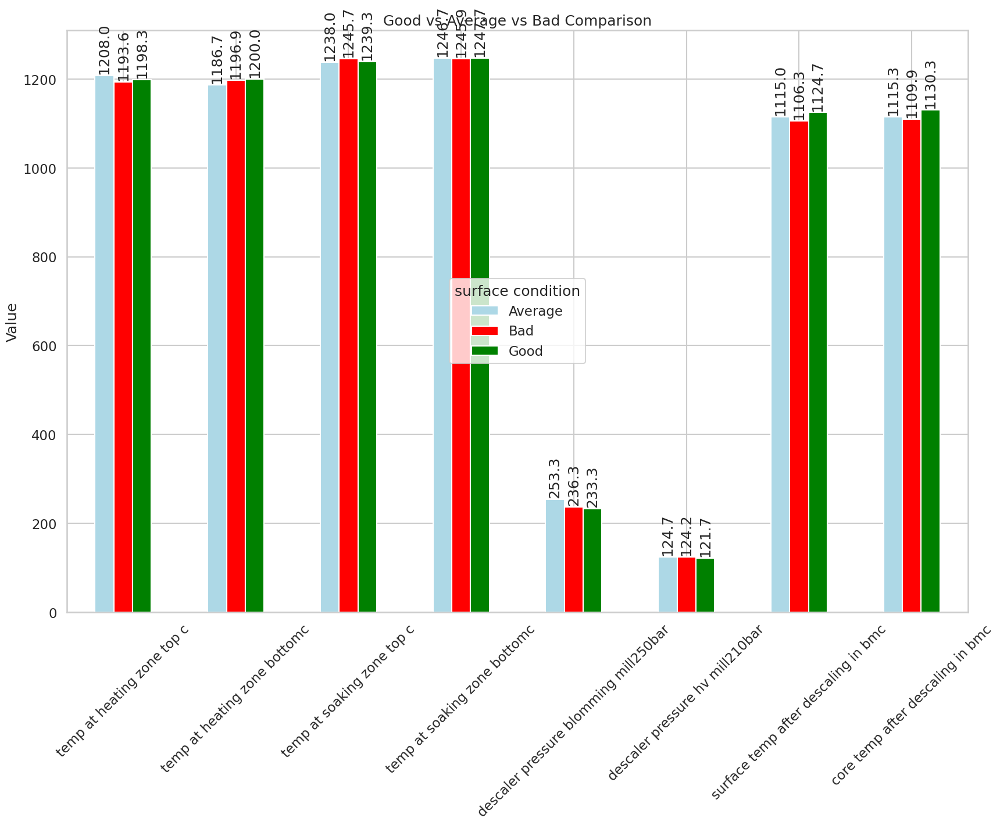

In [104]:
comparison = df_process_quality.groupby('surface condition')[
    [
        'temp at heating zone top c',
        'temp at heating zone bottomc',
        'temp at soaking zone top c',
        'temp at soaking zone bottomc',
        'descaler pressure blomming mill250bar',
        'descaler pressure hv mill210bar',
        'surface temp after descaling in bmc',
        'core temp after descaling in bmc'
    ]
].mean().T

#  Define colors (order must match columns)
colors = []
for col in comparison.columns:
    if col == 'Good':
        colors.append('green')
    elif col == 'Bad':
        colors.append('red')
    else:
        colors.append('lightblue')   # for Average

ax = comparison.plot(kind='bar', figsize=(20,13), color=colors)

plt.title('Good vs Average vs Bad Comparison')
plt.ylabel('Value')
plt.xticks(rotation=45)

# Add values on bars (optional but recommended)
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f', padding=2,rotation=90)

plt.show()

In [105]:
df_process_quality['heating_diff'] = (
    df_process_quality['temp at heating zone top c'] -
    df_process_quality['temp at heating zone bottomc']
)

df_process_quality['soaking_diff'] = (
    df_process_quality['temp at soaking zone top c'] -
    df_process_quality['temp at soaking zone bottomc']
)

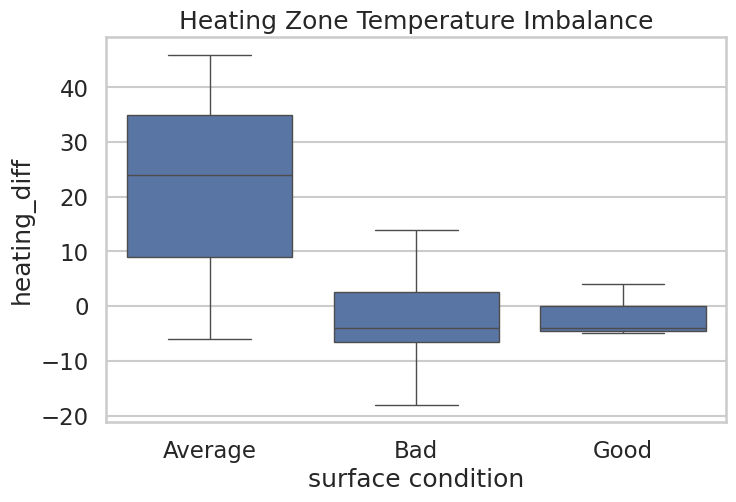

In [106]:
import seaborn as sns

plt.figure(figsize=(8,5))
sns.boxplot(data=df_process_quality,
            x='surface condition',
            y='heating_diff')

plt.title('Heating Zone Temperature Imbalance')
plt.show()

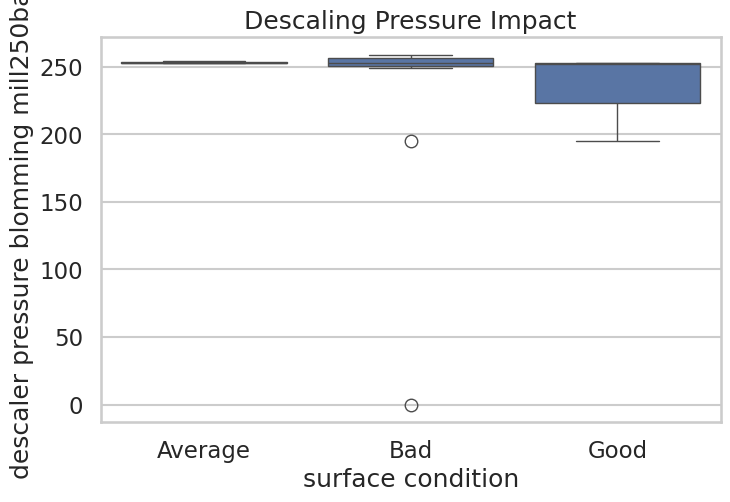

In [107]:
plt.figure(figsize=(8,5))
sns.boxplot(data=df_process_quality,
            x='surface condition',
            y='descaler pressure blomming mill250bar')

plt.title('Descaling Pressure Impact')
plt.show()

In [108]:
summary = pd.DataFrame({
    'Good': df_process_quality[df_process_quality['surface condition']=='Good'].mean(numeric_only=True),
    'Bad': df_process_quality[df_process_quality['surface condition']=='Bad'].mean(numeric_only=True)
})

summary['Difference'] = summary['Bad'] - summary['Good']

summary.sort_values('Difference', ascending=False)

,Good,Bad,Difference
avg,5.665098,19.086808,13.421710
soaking_diff,-8.333333,-0.187500,8.145833
temp at soaking zone top c,1239.333333,1245.687500,6.354167
std temp of heating zone topbottomc 20,1203.333333,1206.666667,3.333333
descaler pressure blomming mill250bar,233.333333,236.277778,2.944444
descaler pressure hv mill210bar,121.666667,124.222222,2.555556
std temp of soaking zone topbottomc 20,1253.333333,1255.000000,1.666667
soaking_dev,-9.833333,-8.593750,1.239583
heating_diff,-1.666667,-3.250000,-1.583333
temp at soaking zone bottomc,1247.666667,1245.875000,-1.791667


In [109]:
summary = pd.DataFrame({
    'Good': df_process_quality[df_process_quality['surface condition']=='Good'].mean(numeric_only=True),
    'Average': df_process_quality[df_process_quality['surface condition']=='Average'].mean(numeric_only=True),
    'Bad': df_process_quality[df_process_quality['surface condition']=='Bad'].mean(numeric_only=True)
})

# Differences
summary['Bad-Good'] = summary['Bad'] - summary['Good']
summary['Avg-Good'] = summary['Average'] - summary['Good']

# Sort by most impact (Bad vs Good)
summary = summary.sort_values('Bad-Good', ascending=False)

summary

,Good,Average,Bad,Bad-Good,Avg-Good
avg,5.665098,12.160000,19.086808,13.421710,6.494902
soaking_diff,-8.333333,-8.666667,-0.187500,8.145833,-0.333333
temp at soaking zone top c,1239.333333,1238.000000,1245.687500,6.354167,-1.333333
std temp of heating zone topbottomc 20,1203.333333,1196.666667,1206.666667,3.333333,-6.666667
descaler pressure blomming mill250bar,233.333333,253.333333,236.277778,2.944444,20.000000
descaler pressure hv mill210bar,121.666667,124.666667,124.222222,2.555556,3.000000
std temp of soaking zone topbottomc 20,1253.333333,1236.666667,1255.000000,1.666667,-16.666667
soaking_dev,-9.833333,5.666667,-8.593750,1.239583,15.500000
heating_diff,-1.666667,21.333333,-3.250000,-1.583333,23.000000
temp at soaking zone bottomc,1247.666667,1246.666667,1245.875000,-1.791667,-1.000000


In [110]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [111]:
df_process_quality = pd.read_excel('/content/final_process_data (2).xlsx')

In [112]:
df_process_quality.columns = df_process_quality.columns.str.strip()\
    .str.lower()\
    .str.replace('\n', ' ', regex=True)\
    .str.replace('\s+', ' ', regex=True)

<>:4: SyntaxWarning: invalid escape sequence '\s'
<>:4: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_17935/5402073.py:4: SyntaxWarning: invalid escape sequence '\s'
  .str.replace('\s+', ' ', regex=True)


In [113]:
cols = [
    'temp at heating zone top c',
    'temp at heating zone bottomc',
    'temp at soaking zone top c',
    'temp at soaking zone bottomc',
    'descaler pressure blomming mill250bar',
    'descaler pressure hv mill210bar'
]

for col in cols:
    df_process_quality[col] = pd.to_numeric(df_process_quality[col], errors='coerce')

In [114]:
def load_and_clean_data():
    pass

In [115]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# ============================
# STYLE (FOR PRESENTATION)
# ============================
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("talk")
sns.set_palette(["#2ecc71", "#f1c40f", "#e74c3c"])  # Green, Yellow, Red


# ============================
# 1️⃣ SURFACE QUALITY DISTRIBUTION
# ============================
def plot_surface_quality_distribution(df):

    fig, ax = plt.subplots(figsize=(8, 6))

    counts = df['surface condition'].value_counts()

    wedges, texts, autotexts = ax.pie(
        counts,
        labels=counts.index,
        autopct='%1.1f%%',
        colors=["#2ecc71", "#f1c40f", "#e74c3c"],
        startangle=90,
        wedgeprops=dict(width=0.4, edgecolor='w')
    )

    plt.title('Overall Surface Quality Breakdown', fontweight='bold')
    plt.tight_layout()
    plt.show()


# ============================
# 2️⃣ PRESSURE IMPACT
# ============================
def plot_pressure_impact(df):

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    # Blooming Mill
    sns.boxplot(
        data=df,
        x='surface condition',
        y='descaler pressure blomming mill250bar',
        order=['Good', 'Average', 'Bad'],
        ax=axes[0]
    )

    axes[0].set_title('Blooming Mill Pressure', fontweight='bold')
    axes[0].axhline(y=245, color='red', linestyle='--')


    # HV Mill
    sns.boxplot(
        data=df,
        x='surface condition',
        y='descaler pressure hv mill210bar',
        order=['Good', 'Average', 'Bad'],
        ax=axes[1]
    )

    axes[1].set_title('HV Mill Pressure', fontweight='bold')
    axes[1].axhline(y=200, color='red', linestyle='--')

    plt.suptitle('Descaler Pressure Impact on Surface Quality', fontweight='bold')
    plt.tight_layout()
    plt.show()


# ============================
# 3️⃣ TEMPERATURE DEVIATION
# ============================
def plot_temperature_deviations(df):

    # Create new column
    df['heating_diff'] = (
        df['temp at heating zone top c'] -
        df['temp at heating zone bottomc']
    )

    plt.figure(figsize=(10, 6))

    sns.violinplot(
        data=df,
        x='surface condition',
        y='heating_diff',
        order=['Good', 'Average', 'Bad']
    )

    plt.axhline(0, color='black')

    plt.title('Heating Zone Temperature Imbalance', fontweight='bold')
    plt.ylabel('Top - Bottom Temperature Difference')

    plt.show()


# ============================
# 4️⃣ GOOD vs BAD SUMMARY
# ============================
def plot_good_vs_bad_summary(df):

    comparison = df.groupby('surface condition')[
        [
            'descaler pressure blomming mill250bar',
            'descaler pressure hv mill210bar'
        ]
    ].mean().loc[['Good', 'Bad']].T

    comparison['Difference (%)'] = (
        (comparison['Good'] - comparison['Bad']) / comparison['Good']
    ) * 100

    fig, ax = plt.subplots(figsize=(10, 5))

    comparison[['Good', 'Bad']].plot(
        kind='barh',
        ax=ax,
        color=['#2ecc71', '#e74c3c']
    )

    plt.title('Good vs Bad Comparison', fontweight='bold')

    # Add values
    for i, (idx, row) in enumerate(comparison.iterrows()):
        plt.text(row['Good'], i, f"{row['Good']:.0f}", color='green')
        plt.text(row['Bad'], i, f"{row['Bad']:.0f}", color='red')

    plt.tight_layout()
    plt.show()

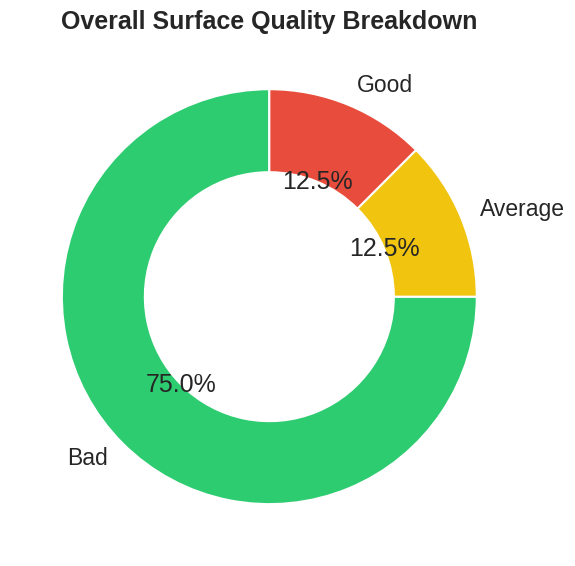

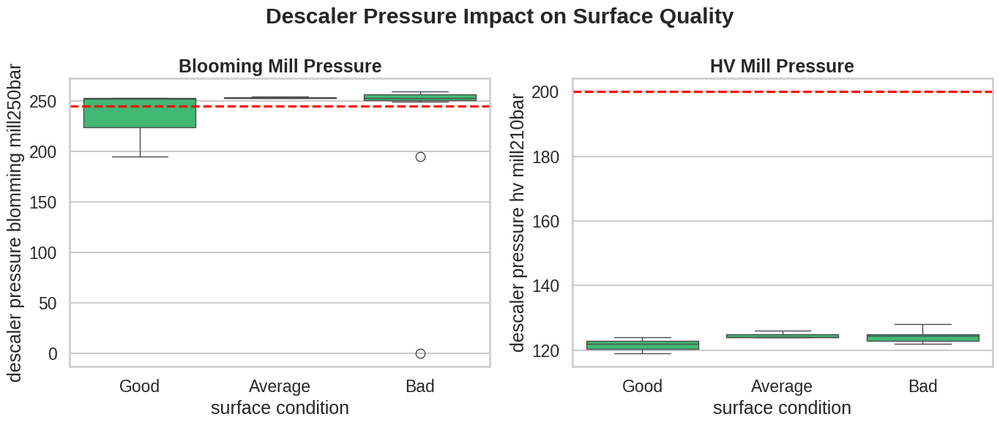

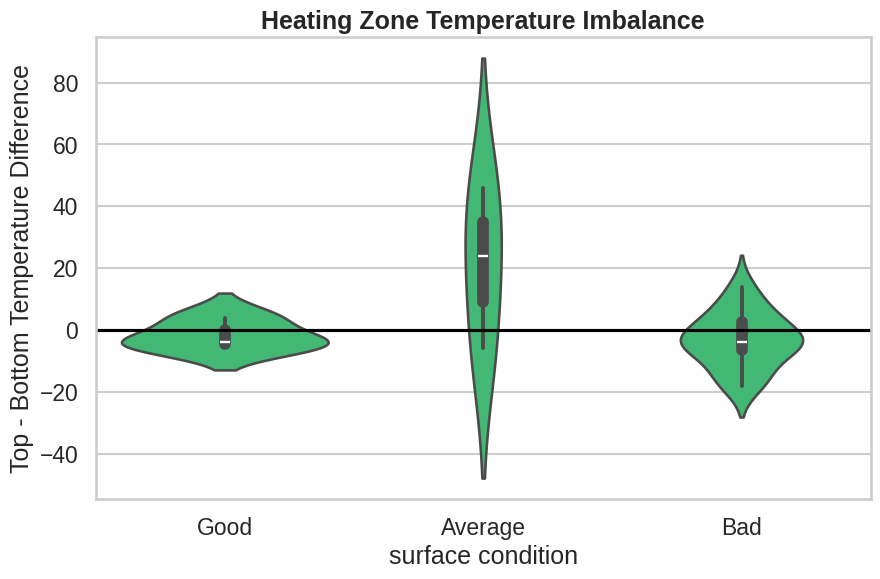

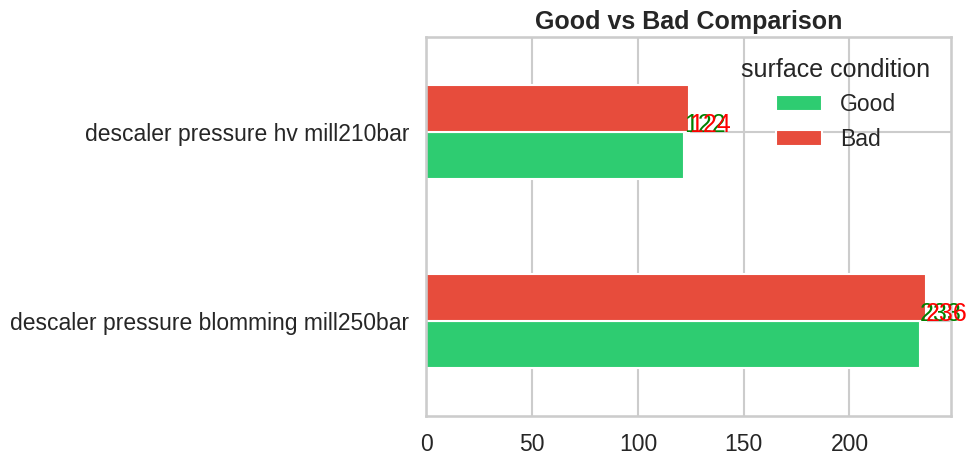

In [116]:
plot_surface_quality_distribution(df_process_quality)

plot_pressure_impact(df_process_quality)

plot_temperature_deviations(df_process_quality)

plot_good_vs_bad_summary(df_process_quality)